# Multi Color Light Curves from Lauren macArthur applied to November/december visits at AuxTel

- author Sylvie Dagoret-Campagne
- creation date 2024-04-04
- last update 2024-04-05
  
``Quantum Graphs``: https://tigress-web.princeton.edu/~lkelvin/pipelines/ 

``CalibrateTask``: 
https://github.com/lsst/pipe_tasks/blob/main/python/lsst/pipe/tasks/calibrate.py#L392-L399

 

In [1]:
from lsst.daf.butler import Butler

import astropy.units as u
import numpy as np 
import pandas as pd
pd.set_option("display.max_columns", None)
from astropy.time import Time

import scipy.stats

import matplotlib
%matplotlib inline
from matplotlib import pyplot as plt
from mpl_toolkits.axes_grid1 import make_axes_locatable
from matplotlib.colors import LogNorm,SymLogNorm

import lsst.afw.display.rgb as afwRgb
import lsst.afw.image as afwImage
import lsst.geom as geom
import pickle
from astropy.stats import SigmaClip

In [2]:
plt.rcParams["figure.figsize"] = (10,6)
plt.rcParams["axes.labelsize"] = 'large'
plt.rcParams['axes.titlesize'] = 'large'
plt.rcParams['xtick.labelsize']= 'large'
plt.rcParams['ytick.labelsize']= 'large'

In [3]:
def get_corners_radec(wcs, bbox):
    """
    Return the corners in RA,Dec in degrees given the WCS and bounding box for an image.

    Parameters
    ----------
    wcs: image WCS returned by the Butler
    bbox: bounding box returned by the Butler

    Returns
    -------
    corners_ra, corners_dec in decimal degrees
    """

    corners_x = [bbox.beginX, bbox.beginX, bbox.endX, bbox.endX]
    corners_y = [bbox.beginY, bbox.endY, bbox.endY, bbox.beginY]
    corners_ra = []
    corners_dec = []
    for i in range(4):
        radec = wcs.pixelToSky(corners_x[i], corners_y[i])
        corners_ra.append(radec.getRa().asDegrees())
        corners_dec.append(radec.getDec().asDegrees())
    
    return corners_ra, corners_dec

In [4]:
saveDir = "./lc_output_auxtel_2023_2024_photom"
doSaveFigs = False  # set to True if you actually want to save the figures in the above dir

In [5]:
# Set some selections for reliable data
minNumMatches = 3
minSnCalibFlux = 50  # 100

In [6]:
# INSERT YOUR auxTel/LATISS collection and tract/band HERE
butlerRoot = "/repo/embargo"
# collection = "LATISS/runs/AUXTEL_DRP_IMAGING_20230509_20231207/w_2023_49/PREOPS-4648"
#collection = "LATISS/runs/AUXTEL_DRP_IMAGING_20230509_20240201/w_2024_05/PREOPS-4871"
collection = "LATISS/runs/AUXTEL_DRP_IMAGING_20230509_20240311/w_2024_10/PREOPS-4985"

collectionStr = collection.replace("/", "_")
instrument = "LATISS"
skymapName = "latiss_v1"

tract = 3864
suptitle = collectionStr + f" inst = {instrument} tract = {tract}"

calibFluxStr = "apFlux_35_0_instFlux"

file_output_selectedsources = f"lightcurves-selectedsources_tract{tract}_2023-2024.csv"
fullname_file_output_selectedsources = os.path.join(saveDir,file_output_selectedsources)

## Initiate butler from variables set above

In [7]:
# Initiate butler from variables set above
butler = Butler(butlerRoot, collections=collection, instrument=instrument, skymap=skymapName)
camera = butler.get("camera", instrument=instrument)
skymap = butler.get("skyMap")
print("camera_name = {}".format(camera.getName()))
print("collection = {}".format(collection))

camera_name = LATISS
collection = LATISS/runs/AUXTEL_DRP_IMAGING_20230509_20240311/w_2024_10/PREOPS-4985


## load isolated_star_sources

In [8]:
# Try to get the Schema
data_product = "isolated_star_sources"
datasetRefs = butler.registry.queryDatasets(datasetType=data_product, collections=collection, where= "instrument='LATISS'")
for i, ref in enumerate(datasetRefs):
    print(i,ref)
    butler_data = butler.get(ref)
    break

if not isinstance(butler_data, pd.core.frame.DataFrame):
    print(butler_data.getSchema())

0 isolated_star_sources@{instrument: 'LATISS', skymap: 'latiss_v1', tract: 5616} [sc=DataFrame] (run=LATISS/runs/AUXTEL_DRP_IMAGING_20230509_20240311/w_2024_10/PREOPS-4985/20240318T162806Z id=5f4f812e-80ee-4a4f-9c28-ee1d827a3288)


## isolated_star_sources Keeping all bands here, but keep the tract selection

The main starting point is the table of isolated_star_sources which has been constructed in step 2a from a catalog
Note that isolated star sources are associated to an object (a static starobject)
Here the work is doneband by band.
It is a good idea to work band by band.

In [9]:
# Load in isolated_star_sources and trim to band of interest and select the tract
isolatedStarSourcesFull = butler.get("isolated_star_sources", tract=tract)
#isolatedStarSourcesFull = isolatedStarSourcesFull[isolatedStarSourcesFull["band"] == band]

In [10]:
# Just to have a look at what's in the catalog:
isolatedStarSourcesFull[isolatedStarSourcesFull.index == 0]

,index,sourceId,visit,detector,ra,dec,physical_filter,band,apFlux_35_0_instFlux,apFlux_35_0_instFluxErr,x,y,apFlux_50_0_instFlux,apFlux_50_0_instFluxErr,apFlux_50_0_flag,localBackground_instFlux,localBackground_flag,source_row,obj_index
0,720,178244558356742865,2023111500493,0,122.502818,-36.181373,empty~SDSSi_65mm,i,17929.311148,580.063968,3089.020434,3522.956779,18544.821571,817.794717,False,-0.084691,False,720,0


In [11]:
isolatedStarSourcesFull.head()

,index,sourceId,visit,detector,ra,dec,physical_filter,band,apFlux_35_0_instFlux,apFlux_35_0_instFluxErr,x,y,apFlux_50_0_instFlux,apFlux_50_0_instFluxErr,apFlux_50_0_flag,localBackground_instFlux,localBackground_flag,source_row,obj_index
0,720,178244558356742865,2023111500493,0,122.502818,-36.181373,empty~SDSSi_65mm,i,17929.311148,580.063968,3089.020434,3522.956779,18544.821571,817.794717,False,-0.084691,False,720,0
1,657,178244564799193746,2023111500499,0,122.502820,-36.181372,empty~SDSSi_65mm,i,17965.443097,593.565729,1981.052932,3539.433919,18788.373258,839.011243,False,0.049484,False,657,0
2,690,178244568020419251,2023111500502,0,122.502819,-36.181372,empty~SDSSi_65mm,i,17309.856495,581.983397,1425.831515,3545.340924,17906.736267,821.413552,False,0.070277,False,690,0
3,481,178244580905320930,2023111500514,0,122.502817,-36.181374,empty~SDSSi_65mm,i,16563.487123,545.671588,3634.994108,2036.356179,16308.805325,776.241811,False,-0.196106,False,481,0
4,432,178244587347771825,2023111500520,0,122.502822,-36.181372,empty~SDSSi_65mm,i,17951.820662,577.548601,2527.386039,2051.742380,18624.356145,814.688326,False,0.041315,False,432,0


In [12]:
isolatedStarSourcesFull.tail()

,index,sourceId,visit,detector,ra,dec,physical_filter,band,apFlux_35_0_instFlux,apFlux_35_0_instFluxErr,x,y,apFlux_50_0_instFlux,apFlux_50_0_instFluxErr,apFlux_50_0_flag,localBackground_instFlux,localBackground_flag,source_row,obj_index
163856,56,179546353280483385,2023122200468,0,122.636922,-36.166699,empty~SDSSy_65mm,y,6159.305843,570.340900,4029.261883,467.716012,NaN,NaN,True,-0.120178,False,56,1298
163857,6,178913118334746631,2023120400546,0,122.627449,-36.261951,empty~SDSSy_65mm,y,6002.652226,546.429347,3854.516501,69.447705,5149.290161,779.662392,False,-0.179842,False,6,1299
163858,289,181973644384141602,2024022900067,0,122.439252,-36.069256,empty~SDSSy_65mm,y,17046.173911,591.284537,1160.102547,3639.086131,19346.313383,837.526273,False,0.166535,False,289,1300
163859,311,181973652974076216,2024022900075,0,122.477861,-36.067847,empty~SDSSy_65mm,y,17262.146455,589.125479,1210.733303,3710.297643,17597.427159,831.424850,False,0.083739,False,311,1301
163860,149,179159378874597526,2023121100518,0,122.371089,-36.241101,empty~SDSSy_65mm,y,6536.212928,607.428677,112.776400,984.505377,7636.402888,864.654488,False,0.303516,False,149,1302


In [13]:
isolatedStarSourcesFull.columns

Index(['index', 'sourceId', 'visit', 'detector', 'ra', 'dec',
       'physical_filter', 'band', 'apFlux_35_0_instFlux',
       'apFlux_35_0_instFluxErr', 'x', 'y', 'apFlux_50_0_instFlux',
       'apFlux_50_0_instFluxErr', 'apFlux_50_0_flag',
       'localBackground_instFlux', 'localBackground_flag', 'source_row',
       'obj_index'],
      dtype='object')

In [14]:
print(sorted(isolatedStarSourcesFull["visit"].unique()))

[2023111500491, 2023111500492, 2023111500493, 2023111500494, 2023111500495, 2023111500496, 2023111500497, 2023111500498, 2023111500499, 2023111500500, 2023111500501, 2023111500502, 2023111500503, 2023111500504, 2023111500505, 2023111500506, 2023111500507, 2023111500508, 2023111500509, 2023111500510, 2023111500511, 2023111500512, 2023111500513, 2023111500514, 2023111500515, 2023111500516, 2023111500517, 2023111500518, 2023111500519, 2023111500520, 2023111500521, 2023111500522, 2023111500523, 2023111500524, 2023111500525, 2023111500526, 2023111500527, 2023111500528, 2023111500529, 2023111500530, 2023111500531, 2023111500532, 2023111500533, 2023111500534, 2023111500535, 2023111500536, 2023111500537, 2023111500538, 2023111500539, 2023111500540, 2023111500541, 2023111500542, 2023111500543, 2023111500544, 2023111500545, 2023111500546, 2023111500547, 2023111500548, 2023111500549, 2023111500550, 2023111500551, 2023111500552, 2023111500553, 2023111500554, 2023111500555, 2023111500556, 202311150

In [15]:
# Just to have a look at what's in the catalog:
isolatedStarSourcesFull[isolatedStarSourcesFull.index == 0]

,index,sourceId,visit,detector,ra,dec,physical_filter,band,apFlux_35_0_instFlux,apFlux_35_0_instFluxErr,x,y,apFlux_50_0_instFlux,apFlux_50_0_instFluxErr,apFlux_50_0_flag,localBackground_instFlux,localBackground_flag,source_row,obj_index
0,720,178244558356742865,2023111500493,0,122.502818,-36.181373,empty~SDSSi_65mm,i,17929.311148,580.063968,3089.020434,3522.956779,18544.821571,817.794717,False,-0.084691,False,720,0


In [16]:
print("calibFluxStr = {},,minSnCalibFlux = {}, minNumMatches = {}".format(calibFluxStr,minSnCalibFlux,minNumMatches))

calibFluxStr = apFlux_35_0_instFlux,,minSnCalibFlux = 50, minNumMatches = 3


## Select a number of visits with enough good sources but in all bands here

- extract the list of known objects

In [17]:
calibFluxStr

'apFlux_35_0_instFlux'

In [18]:
minSnCalibFlux

50

In [19]:
# Trim the isolated_star_sources cat to those PSF S/N > minSnCalibFlux
# and number of matches sources > minNumMatches.
objIndexListFull = list(set(isolatedStarSourcesFull["obj_index"].values))

# Select the bright stars above a minimum of S/N ratio
if minSnCalibFlux is not None:
    snCalibFlux = isolatedStarSourcesFull[calibFluxStr]/isolatedStarSourcesFull[calibFluxStr + "Err"]
    snMask = snCalibFlux > minSnCalibFlux
    isolatedStarSourcesMinSn = isolatedStarSourcesFull[snMask].copy(deep=True)
else:
    isolatedStarSourcesMinSn = isolatedStarSourcesFull.copy(deep=True)

# object index with obj index in above selected bright selected star
objIndexListMinSn = list(set(isolatedStarSourcesMinSn["obj_index"].values))

# requires that the object is associated to several sources (at least minNumMatches sources)
# loop on object having sources with S/N aboe selection 
objIndexList = []
for objIndex in objIndexListMinSn:
    objData = isolatedStarSourcesMinSn[isolatedStarSourcesMinSn["obj_index"] == objIndex]
    if len(objData) >= minNumMatches:
        objIndexList.append(objIndex)
numTrimmed = len(objIndexListFull) - len(objIndexList)

mask = []
for objIndex, visit in zip(isolatedStarSourcesMinSn["obj_index"], isolatedStarSourcesMinSn["visit"]):
    if objIndex in objIndexList:
        mask.append(True)
    else:
        mask.append(False)
isolatedStarSources = isolatedStarSourcesMinSn[mask].copy(deep=True)

# Select a number of visits according quality criteria
visitList = list(set(isolatedStarSources["visit"].values))

if minSnCalibFlux is not None:
    print("Trimmed isolated_star_sources catalog to S/N {} > {} (leaving N={} matched sources from original {})".format(
        calibFluxStr, minSnCalibFlux, len(isolatedStarSources), len(isolatedStarSourcesFull)))
print("Trimmed isolated_star_sources catalog to objecst with nMatches >= {} (leaving {} objects from {}).".format(
    minNumMatches, len(objIndexList), len(objIndexListFull)))

Trimmed isolated_star_sources catalog to S/N apFlux_35_0_instFlux > 50 (leaving N=47325 matched sources from original 163861)
Trimmed isolated_star_sources catalog to objecst with nMatches >= 3 (leaving 355 objects from 1303).


In [20]:
sorted_visitList = sorted(visitList)

In [21]:
def convertVisitToDatestr(visit):

    num = visit//100_000
    year = num//10_000
    month= (num-year*10_000)//100
    day = (num-year*10_000-month*100)

    year_str = str(year).zfill(4)
    month_str = str(month).zfill(2)
    day_str = str(day).zfill(2)
    
    datestr = f"{year_str}-{month_str}-{day_str}"
    return datestr

In [22]:
def convertVisitToMJD(visit):
    return Time(convertVisitToDatestr(visit)).mjd

In [23]:
sorted_visits_mjd = list(map(convertVisitToMJD, sorted_visitList))

## sourceTable_visit

This is the main output of FGCM calibration which has selected a number of sources. These sources were originally selected from isolated sources.

In [24]:
# Extra columns to load from sourceTable_visit catalogs
names = ["psfFlux", "psfFluxErr", "psfFlux_flag", "psfFlux_apCorr", "psfFlux_apCorrErr",
         "extendedness", "detect_isPrimary", "deblend_skipped",
         "gaussianFlux", "gaussianFluxErr", "gaussianFlux_flag",
         "localPhotoCalib", "localPhotoCalibErr", "localPhotoCalib_flag"]

## Note that some sourceTable_visit not found for some visits in isolated_star_sources 

In [25]:
# Load in the sourceTable_visit catalogs to get the psfFlux and other useful info per source.
# Columns loaded are those in names above.
sourceCatalogs = []
nSourceDict = {}
visitsToRemove = []

# loop over all selected visit
for visit in visitList:
    try:
        sourceCatalogOrig = butler.get("sourceTable_visit", visit=visit, parameters={"columns": names})
        primaryCat = sourceCatalogOrig[sourceCatalogOrig["detect_isPrimary"]].copy(deep=True)
        nSourceDict[visit] = sum(primaryCat["psfFlux"]/primaryCat["psfFluxErr"] > 5)
        sourceCatalogs.append(primaryCat)
    except LookupError:
        print("sourceTable_visit not found for visit {}".format(visit))
        isolatedStarSources = isolatedStarSources[isolatedStarSources["visit"] != visit].copy(deep=True)
        visitsToRemove.append(visit)
visitList = list(set(visitList) - set(visitsToRemove))

# Do the minNumMatches cut again since visits may have been removed due to lack of sourceTable_visit
print("Number of objects with >=3 matches before sourceTable_visit exsistence check: {}".format(len(objIndexList)))
objIndexListAllNew = list(set(isolatedStarSources["obj_index"].values))
objIndexList = []
for objIndex in objIndexListAllNew:
    objData = isolatedStarSources[isolatedStarSources["obj_index"] == objIndex]
    if len(objData) >= minNumMatches:
        objIndexList.append(objIndex)
mask = []
for objIndex, visit in zip(isolatedStarSources["obj_index"], isolatedStarSources["visit"]):
    if objIndex in objIndexList:
        mask.append(True)
    else:
        mask.append(False)
isolatedStarSources = isolatedStarSources[mask].copy(deep=True)
visitList = list(set(isolatedStarSources["visit"].values))
print("Number of objects with >=3 matches after sourceTable_visit exsistence check: {}".format(len(objIndexList)))
dataJoined = pd.concat(sourceCatalogs).merge(isolatedStarSources, on="sourceId", how="inner")

sourceTable_visit not found for visit 2024030200023
sourceTable_visit not found for visit 2024030200026
sourceTable_visit not found for visit 2024030200034
sourceTable_visit not found for visit 2024030200038
sourceTable_visit not found for visit 2024030200043
sourceTable_visit not found for visit 2024030200049
sourceTable_visit not found for visit 2024030200050
sourceTable_visit not found for visit 2023112000360
sourceTable_visit not found for visit 2023112000367
sourceTable_visit not found for visit 2024020600055
sourceTable_visit not found for visit 2023113000525
sourceTable_visit not found for visit 2023113000529
sourceTable_visit not found for visit 2023113000528
sourceTable_visit not found for visit 2024012900356
sourceTable_visit not found for visit 2024022600054
sourceTable_visit not found for visit 2024022600055
sourceTable_visit not found for visit 2023111600631
sourceTable_visit not found for visit 2023111600638
sourceTable_visit not found for visit 2023111600640
sourceTable_

In [26]:
visitsToRemove 

[2024030200023,
 2024030200026,
 2024030200034,
 2024030200038,
 2024030200043,
 2024030200049,
 2024030200050,
 2023112000360,
 2023112000367,
 2024020600055,
 2023113000525,
 2023113000529,
 2023113000528,
 2024012900356,
 2024022600054,
 2024022600055,
 2023111600631,
 2023111600638,
 2023111600640,
 2023111600684,
 2023111600688,
 2023111600702,
 2023111600708,
 2024030700246,
 2024020700276,
 2024020700277,
 2024020700280,
 2024020700282,
 2024020700286,
 2024020700290,
 2024020700303,
 2024020700304,
 2024020700305,
 2024020700306,
 2024020700317,
 2024020700318,
 2024020700319,
 2024020700331,
 2024020700334,
 2024020700339,
 2024020700349,
 2024020700350,
 2024020700358,
 2024020800027,
 2024020800024,
 2024020800039,
 2024020800040,
 2024020800043,
 2024020800044,
 2024020800047,
 2024020800053,
 2024020800055,
 2024020800056,
 2024020800057,
 2024020800060,
 2024020800062,
 2024020800064,
 2024020800072,
 2023121900370,
 2024030200065,
 2024030200077,
 2024030200081,
 2024030

## Will start to work on dataJoined which associate selected "isolated_star_sources" in the selected band and visits the good calibration in "sourceTable_visit"

### add my info from CCD Visit Table

- CCD visit table is a pre-FGCM calibration
- it provides airmass and initial zero-point

In [27]:
# need also. ["zeroPoint","airmass"]

In [28]:
# Collect useful columns from ccdVisitTable
ccdVisitTable = butler.get("ccdVisitTable")
ccdVisitTable["airmass"] = ccdVisitTable["zenithDistance"].apply(lambda x: 1/np.cos(np.pi/180.*x))
ccdVisitTable["medianE"] = np.sqrt(ccdVisitTable["psfStarDeltaE1Median"] ** 2.0 + 
                                    ccdVisitTable["psfStarDeltaE2Median"] ** 2.0)
psfSigmaDict = {}
skyBgDict = {}
skyNoiseDict = {}
expTimeDict = {}
expMidptMjdDict = {}
medianEDict = {}
psfStarScaledDeltaSizeScatterDict = {}
astromOffsetStdDict = {}
psfTraceRadiusDeltaDict = {}
zeroPointDict = {}
airmassDict = {}
seeingDict = {}
# for visit in ccdVisitTable["visitId"].values:
#     if visit in visitList:
for visit in visitList:
    if visit in ccdVisitTable["visitId"].values:
        psfSigmaDict[visit] = ccdVisitTable[ccdVisitTable["visitId"] == visit]["psfSigma"].values[0]
        skyBgDict[visit] = ccdVisitTable[ccdVisitTable["visitId"] == visit]["skyBg"].values[0]
        skyNoiseDict[visit] = ccdVisitTable[ccdVisitTable["visitId"] == visit]["skyNoise"].values[0]
        expTimeDict[visit] = ccdVisitTable[ccdVisitTable["visitId"] == visit]["expTime"].values[0]
        expMidptMjdDict[visit] = ccdVisitTable[ccdVisitTable["visitId"] == visit]["expMidptMJD"].values[0]
        medianEDict[visit] = ccdVisitTable[ccdVisitTable["visitId"] == visit]["medianE"].values[0]
        psfStarScaledDeltaSizeScatterDict[visit] = ccdVisitTable[ccdVisitTable["visitId"] == visit]["psfStarScaledDeltaSizeScatter"].values[0]
        astromOffsetStdDict[visit] = ccdVisitTable[ccdVisitTable["visitId"] == visit]["astromOffsetStd"].values[0]
        psfTraceRadiusDeltaDict[visit] = ccdVisitTable[ccdVisitTable["visitId"] == visit]["psfTraceRadiusDelta"].values[0]
        zeroPointDict[visit] = ccdVisitTable[ccdVisitTable["visitId"] == visit]["zeroPoint"].values[0]
        airmassDict[visit] = ccdVisitTable[ccdVisitTable["visitId"] == visit]["airmass"].values[0]
        seeingDict[visit] = ccdVisitTable[ccdVisitTable["visitId"] == visit]["seeing"].values[0]
    else:
        raise RuntimeError("ERROR: visit {} not found in ccdVisitTable".format(visit))

In [29]:
# Just to have a look at what's in the catalog:
ccdVisitTable[ccdVisitTable.index == ccdVisitTable.index[0]] 

,visitId,physical_filter,band,ra,dec,zenithDistance,zeroPoint,psfSigma,skyBg,skyNoise,astromOffsetMean,astromOffsetStd,nPsfStar,psfStarDeltaE1Median,psfStarDeltaE2Median,psfStarDeltaE1Scatter,psfStarDeltaE2Scatter,psfStarDeltaSizeMedian,psfStarDeltaSizeScatter,psfStarScaledDeltaSizeScatter,psfTraceRadiusDelta,maxDistToNearestPsf,effTime,effTimePsfSigmaScale,effTimeSkyBgScale,effTimeZeroPointScale,decl,detector,seeing,skyRotation,expMidpt,expMidptMJD,expTime,obsStart,obsStartMJD,darkTime,xSize,ySize,llcra,llcdec,ulcra,ulcdec,urcra,urcdec,lrcra,lrcdec,airmass,medianE
ccdVisitId,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
40919696896,2023051100262,SDSSr_65mm~empty,r,239.946728,-24.053747,56.749516,27.697306,7.760594,11.193549,7.8568,0.025776,0.014186,27,-0.002812,-0.001684,0.028204,0.007311,0.066781,0.043159,0.005508,0.449597,1922.977051,0.213347,0.016604,2.680115,0.15981,-24.053747,0,1.749004,322.911701,2023-05-12 01:08:56.302993,60076.047874,30.0,2023-05-12 01:08:41.302993,60076.0477,30.2434,4071,3999,239.935567,-24.128923,240.029265,-24.062575,239.957875,-23.97857,239.864202,-24.044874,1.823818,0.003278


### Plot visits versus time

In [30]:
ccdVisitTable_subset = ccdVisitTable[["visitId","band","zeroPoint","psfSigma","skyBg","skyNoise","seeing","expMidptMJD","obsStart","airmass","llcra","llcdec","ulcra","ulcdec","urcra","urcdec","lrcra","lrcdec"]]

#### compute nightObs and datetime time

In [31]:
ccdVisitTable_subset["nightObs"] =ccdVisitTable_subset.apply(lambda x: x['visitId']//100_000, axis=1)
ccdVisitTable_subset["Time"] = pd.to_datetime(ccdVisitTable_subset['obsStart'])

/tmp/ipykernel_22084/2741161870.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ccdVisitTable_subset["nightObs"] =ccdVisitTable_subset.apply(lambda x: x['visitId']//100_000, axis=1)
/tmp/ipykernel_22084/2741161870.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ccdVisitTable_subset["Time"] = pd.to_datetime(ccdVisitTable_subset['obsStart'])


In [32]:
ccdVisitTable_g = ccdVisitTable_subset[ccdVisitTable_subset.band== "g"]
ccdVisitTable_r = ccdVisitTable_subset[ccdVisitTable_subset.band== "r"]
ccdVisitTable_i = ccdVisitTable_subset[ccdVisitTable_subset.band== "i"]
ccdVisitTable_z = ccdVisitTable_subset[ccdVisitTable_subset.band== "z"]
ccdVisitTable_y = ccdVisitTable_subset[ccdVisitTable_subset.band== "y"]

In [33]:
ccdVisitTable_subset.head()

,visitId,band,zeroPoint,psfSigma,skyBg,skyNoise,seeing,expMidptMJD,obsStart,airmass,llcra,llcdec,ulcra,ulcdec,urcra,urcdec,lrcra,lrcdec,nightObs,Time
ccdVisitId,,,,,,,,,,,,,,,,,,,,
40919696896,2023051100262,r,27.697306,7.760594,11.193549,7.856800,1.749004,60076.047874,2023-05-12 01:08:41.302993,1.823818,239.935567,-24.128923,240.029265,-24.062575,239.957875,-23.978570,239.864202,-24.044874,20230511,2023-05-12 01:08:41.302993
40919697408,2023051100264,i,27.838850,6.321881,28.073927,8.586373,1.424821,60076.052140,2023-05-12 01:14:49.912000,1.762794,239.985571,-23.974553,239.869115,-23.994653,239.890710,-24.099127,240.007258,-24.079012,20230511,2023-05-12 01:14:49.912000
40919698432,2023051100268,r,27.716721,8.038972,10.700970,7.854424,1.811649,60076.055316,2023-05-12 01:19:24.311494,1.721301,239.951871,-24.120505,240.046767,-24.055593,239.976942,-23.970518,239.882074,-24.035387,20230511,2023-05-12 01:19:24.311494
40919698944,2023051100270,i,27.858833,6.754847,23.952974,8.440454,1.522426,60076.057363,2023-05-12 01:22:21.150002,1.695170,240.008535,-23.984061,239.892085,-24.004162,239.913693,-24.108652,240.030234,-24.088534,20230511,2023-05-12 01:22:21.150002
40919699200,2023051100271,i,27.826286,6.488425,23.321407,8.416399,1.462219,60076.058878,2023-05-12 01:24:32.058502,1.677014,239.964342,-24.126362,240.059682,-24.062017,239.990410,-23.976542,239.895100,-24.040845,20230511,2023-05-12 01:24:32.058502


In [34]:
ccdVisitTable_subset.tail()

,visitId,band,zeroPoint,psfSigma,skyBg,skyNoise,seeing,expMidptMJD,obsStart,airmass,llcra,llcdec,ulcra,ulcdec,urcra,urcdec,lrcra,lrcdec,nightObs,Time
ccdVisitId,,,,,,,,,,,,,,,,,,,,
43453134336,2024030800566,y,26.166447,4.858362,13.559249,8.029708,1.094969,60378.247447,2024-03-09 05:56:04.403505,1.628972,122.426835,-36.257489,122.561095,-36.256166,122.559331,-36.149845,122.425254,-36.151166,20240308,2024-03-09 05:56:04.403505
43453134592,2024030800567,g,27.953827,6.890330,3.249260,7.539632,1.553279,60378.248624,2024-03-09 05:57:46.104001,1.640791,122.444307,-36.257399,122.578585,-36.256079,122.576821,-36.149726,122.442725,-36.151044,20240308,2024-03-09 05:57:46.104001
43453134848,2024030800568,r,27.774017,6.158408,6.951125,7.735226,1.388087,60378.249164,2024-03-09 05:58:32.775498,1.646516,122.444537,-36.257436,122.578805,-36.256104,122.577046,-36.149772,122.442960,-36.151103,20240308,2024-03-09 05:58:32.775498
43453135104,2024030800569,z,27.314375,5.293322,16.513548,8.214679,1.193113,60378.249704,2024-03-09 05:59:19.465993,1.652293,122.444783,-36.257474,122.579046,-36.256150,122.577282,-36.149812,122.443202,-36.151133,20240308,2024-03-09 05:59:19.465993
43453135360,2024030800570,y,26.234928,5.417888,14.284846,8.045543,1.221227,60378.250260,2024-03-09 06:00:07.432002,1.658276,122.445158,-36.257498,122.579434,-36.256166,122.577677,-36.149831,122.443583,-36.151162,20240308,2024-03-09 06:00:07.432002


In [35]:
# function of time conversion
from astropy.time import Time

def dt_to_mjd(dt):
    t = Time(dt)
    return t.to_value('mjd','float')

def mjd_to_dt(mjd):
    tm = Time(mjd, format='mjd')
    # Convert to datetime
    utc =tm.to_datetime()
    return utc

In [36]:
dt = ccdVisitTable_subset.iloc[0]['Time']
dt

Timestamp('2023-05-12 01:08:41.302993')

In [37]:
type(dt)

pandas._libs.tslibs.timestamps.Timestamp

In [38]:
mjd = dt_to_mjd(dt)
mjd

60076.04770026612

In [39]:
tm = mjd_to_dt(mjd)

In [40]:
#ax.secondary_xaxis?

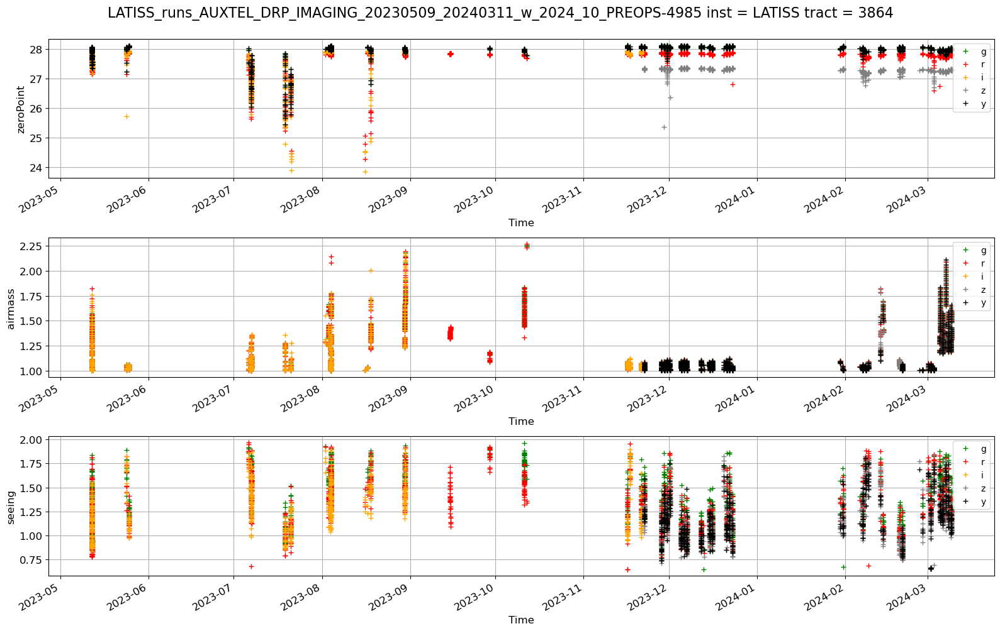

In [41]:
fig,axs = plt.subplots(3,1,figsize=(16,10))
ax1,ax2,ax3 = axs
ccdVisitTable_g.plot(x="Time",y="zeroPoint",marker='+',c="g",lw=0.0,ax=ax1,grid=True,label="g")
ccdVisitTable_r.plot(x="Time",y="zeroPoint",marker='+',c="r",lw=0.0,ax=ax1,grid=True,label="r")
ccdVisitTable_i.plot(x="Time",y="zeroPoint",marker='+',c="orange",lw=0.0,ax=ax1,grid=True,label="i")
ccdVisitTable_z.plot(x="Time",y="zeroPoint",marker='+',c="grey",lw=0.0,ax=ax1,grid=True,label="z")
ccdVisitTable_g.plot(x="Time",y="zeroPoint",marker='+',c="k",lw=0.0,ax=ax1,grid=True,label="y")
#ax1.set_title("zeroPoint")
ax1.set_ylabel("zeroPoint")
#ax1_up = ax1.secondary_xaxis("top", functions=( dt_to_mjd, mjd_to_dt))
#ccdVisitTable_g.plot(x="expMidptMJD",y="zeroPoint",marker='+',c="g",lw=0.0,ax=ax1_up,grid=True,label="g")

ccdVisitTable_g.plot(x="Time",y="airmass",marker='+',c="g",lw=0.0,ax=ax2,grid=True,label="g")
ccdVisitTable_r.plot(x="Time",y="airmass",marker='+',c="r",lw=0.0,ax=ax2,grid=True,label="r")
ccdVisitTable_i.plot(x="Time",y="airmass",marker='+',c="orange",lw=0.0,ax=ax2,grid=True,label="i")
ccdVisitTable_z.plot(x="Time",y="airmass",marker='+',c="grey",lw=0.0,ax=ax2,grid=True,label="z")
ccdVisitTable_y.plot(x="Time",y="airmass",marker='+',c="k",lw=0.0,ax=ax2,grid=True,label="y")
#ax2.set_title("airmass")
ax2.set_ylabel("airmass")

ccdVisitTable_g.plot(x="Time",y="seeing",marker='+',c="g",lw=0.0,ax=ax3,grid=True,label="g")
ccdVisitTable_r.plot(x="Time",y="seeing",marker='+',c="r",lw=0.0,ax=ax3,grid=True,label="r")
ccdVisitTable_i.plot(x="Time",y="seeing",marker='+',c="orange",lw=0.0,ax=ax3,grid=True,label="i")
ccdVisitTable_z.plot(x="Time",y="seeing",marker='+',c="grey",lw=0.0,ax=ax3,grid=True,label="z")
ccdVisitTable_y.plot(x="Time",y="seeing",marker='+',c="k",lw=0.0,ax=ax3,grid=True,label="y")
#ax2.set_title("airmass")
ax3.set_ylabel("seeing")

#df.plot(x="Time",y="coord_dec",marker='o',c="g",lw=0.0,ax=ax2,grid=True)
plt.suptitle(suptitle,y=1.0,fontsize=16)
plt.tight_layout()

In [42]:
dataJoined.columns

Index(['sourceId', 'psfFlux', 'psfFluxErr', 'psfFlux_flag', 'psfFlux_apCorr',
       'psfFlux_apCorrErr', 'extendedness', 'detect_isPrimary',
       'deblend_skipped', 'gaussianFlux', 'gaussianFluxErr',
       'gaussianFlux_flag', 'localPhotoCalib', 'localPhotoCalibErr',
       'localPhotoCalib_flag', 'index', 'visit', 'detector', 'ra', 'dec',
       'physical_filter', 'band', 'apFlux_35_0_instFlux',
       'apFlux_35_0_instFluxErr', 'x', 'y', 'apFlux_50_0_instFlux',
       'apFlux_50_0_instFluxErr', 'apFlux_50_0_flag',
       'localBackground_instFlux', 'localBackground_flag', 'source_row',
       'obj_index'],
      dtype='object')

In [43]:
# Add columns into dataJoined table to have them all in one place
dataJoined["psfSn"] = dataJoined["psfFlux"]/dataJoined["psfFluxErr"]
dataJoined["psfMag"] = (dataJoined["psfFlux"].values*u.nJy).to(u.ABmag).value
dataJoined["psfMagErr"] = 2.5/np.log(10.0)*(dataJoined["psfFluxErr"].values/dataJoined["psfFlux"].values)

#dataJoined["apFlux_35_0_calFlux"] = dataJoined["apFlux_35_0_instFlux"]*dataJoined["localPhotoCalib"]
#dataJoined["apFlux_35_0_calFluxErr"] = dataJoined["apFlux_35_0_instFluxErr"]*dataJoined["localPhotoCalib"]
# This is the way to apply aperture corrections :
dataJoined["apFlux_35_0_calFlux"] = dataJoined["apFlux_35_0_instFlux"]*dataJoined["localPhotoCalib"]*dataJoined['psfFlux_apCorr']
dataJoined["apFlux_35_0_calFluxErr"] = dataJoined["apFlux_35_0_instFluxErr"]*dataJoined["localPhotoCalib"]*dataJoined['psfFlux_apCorr']

# NOTE: psfFlux is the fgcm calibrated flux.  I'm pretty sure you get the "instrumental" 
# flux by dividing psfFlux by the localPhotoCalib value.
dataJoined["psfInstMag"] = ((dataJoined["psfFlux"].values/dataJoined["localPhotoCalib"].values)*u.nJy).to(u.ABmag).value
dataJoined["psfGausFluxRatio"] = dataJoined["psfFlux"]/dataJoined["gaussianFlux"]
dataJoined["psfSigma"] = dataJoined.apply(lambda x: psfSigmaDict[x["visit"]], axis=1)
dataJoined["skyBg"] = dataJoined.apply(lambda x: skyBgDict[x["visit"]], axis=1)
dataJoined["expTime"] = dataJoined.apply(lambda x: expTimeDict[x["visit"]], axis=1)
dataJoined["expMidptMjd"] = dataJoined.apply(lambda x: expMidptMjdDict[x["visit"]], axis=1)
dataJoined["nSource"] = dataJoined.apply(lambda x: nSourceDict[x["visit"]], axis=1)
dataJoined["medianE"] = dataJoined.apply(lambda x: medianEDict[x["visit"]], axis=1)
dataJoined["psfStarScaledDeltaSizeScatter"] = dataJoined.apply(lambda x: psfStarScaledDeltaSizeScatterDict[x["visit"]], axis=1)
dataJoined["astromOffsetStd"] = dataJoined.apply(lambda x: astromOffsetStdDict[x["visit"]], axis=1)
dataJoined["psfTraceRadiusDelta"] = dataJoined.apply(lambda x: psfTraceRadiusDeltaDict[x["visit"]], axis=1)

# I add the airmass and zero-point I want to keep here
dataJoined["zeroPoint"] = dataJoined.apply(lambda x: zeroPointDict[x["visit"]], axis=1)
dataJoined["airmass"] = dataJoined.apply(lambda x: airmassDict[x["visit"]], axis=1)
dataJoined["seeing"] = dataJoined.apply(lambda x: seeingDict[x["visit"]], axis=1)

matchedObjIdList = list(set(dataJoined["obj_index"]))

In [44]:
dataJoined[dataJoined.index == 0]

,sourceId,psfFlux,psfFluxErr,psfFlux_flag,psfFlux_apCorr,psfFlux_apCorrErr,extendedness,detect_isPrimary,deblend_skipped,gaussianFlux,gaussianFluxErr,gaussianFlux_flag,localPhotoCalib,localPhotoCalibErr,localPhotoCalib_flag,index,visit,detector,ra,dec,physical_filter,band,apFlux_35_0_instFlux,apFlux_35_0_instFluxErr,x,y,apFlux_50_0_instFlux,apFlux_50_0_instFluxErr,apFlux_50_0_flag,localBackground_instFlux,localBackground_flag,source_row,obj_index,psfSn,psfMag,psfMagErr,apFlux_35_0_calFlux,apFlux_35_0_calFluxErr,psfInstMag,psfGausFluxRatio,psfSigma,skyBg,expTime,expMidptMjd,nSource,medianE,psfStarScaledDeltaSizeScatter,astromOffsetStd,psfTraceRadiusDelta,zeroPoint,airmass,seeing
0,179300073413279749,1.573370e+06,12747.629058,False,1.01918,0.0,0.0,True,False,1.610028e+06,16299.16107,False,44.702317,0.081973,False,4,2023121500478,0,122.61631,-36.190488,SDSSz_65mm~empty,z,35957.22677,617.848502,3577.161135,50.744859,37554.299549,870.65158,False,0.285867,False,4,526,123.424505,15.907923,0.008797,1.638200e+06,28148.984346,20.033748,0.977231,4.217063,13.336939,30.0,60294.235492,907,0.000921,0.017815,0.011082,0.618124,27.28923,1.071148,0.950443


## The association between the independent sources is done through the object index 

- for plotting the repeatability

In [45]:
# Compute repeatability related values per object/object group and add
# them inplace to the dataJoined DataFrame.
psfMagDiffMmagDfList = []
psfMagStdMmagAll = []
psfMagStdMmagDict = {}
psfMagDiffChiDfList = []
psfSnAll = []
raDiffMasDfList = []
decDiffMasDfList = []
raCosDecDiffMasDfList = []
objRaDegList = []
objDecDegList = []
raStdMasAll = []
decStdMasAll = []
raCosDecStdMasAll = []
objDataList = []

# loop on objects
for objIndex in matchedObjIdList:
    # select sources corresponding to that object
    objData = dataJoined[dataJoined["obj_index"] == objIndex]
    psfMag = objData["psfMag"]
    psfMagErr = objData["psfMagErr"]

    # average flux over all visits
    clippedMeanMagArray = scipy.stats.sigmaclip(psfMag, low=3.0, high=3.0).clipped
    clippedMeanMag = np.mean(clippedMeanMagArray)
    clippedMeanMagErr = np.std(clippedMeanMagArray)/np.sqrt(len(clippedMeanMagArray))

    # array of difference between flux an clipped mean average
    psfMagDiffMmag = 1000*(psfMag - clippedMeanMag)
    # sigma arrays over the difference
    psfMagStdMmag = np.std(psfMagDiffMmag)
    # residuals array
    psfMagDiffChi = (psfMag - clippedMeanMag)/np.sqrt(psfMagErr**2 + clippedMeanMagErr**2)
    
    clippedMeanRaArray = scipy.stats.sigmaclip(objData["ra"], low=3.0, high=3.0).clipped
    clippedMeanRa = np.mean(clippedMeanRaArray)
    raDiffMas = (objData["ra"] - clippedMeanRa)*3600*1000
    
    clippedMeanDecArray = scipy.stats.sigmaclip(objData["dec"], low=3.0, high=3.0).clipped
    clippedMeanDec = np.mean(clippedMeanDecArray)
    decDiffMas = (objData["dec"] - clippedMeanDec)*3600*1000
    
    raCosDec = np.deg2rad(objData["ra"])*np.cos(np.deg2rad(objData["dec"]))
    clippedMeanRaCosDecArray = scipy.stats.sigmaclip(raCosDec, low=3.0, high=3.0).clipped
    clippedMeanRaCosDec = np.mean(clippedMeanRaCosDecArray)
    raCosDecDiffRad = (raCosDec - clippedMeanRaCosDec)
    raCosDecDiffMas = np.rad2deg(raCosDecDiffRad)*3600*1000

    # save for all sources of the object
    psfMagDiffMmagDfList.append(psfMagDiffMmag)
    psfMagStdMmagAll.append(psfMagStdMmag)
    psfMagDiffChiDfList.append(psfMagDiffChi)

    raDiffMasDfList.append(raDiffMas)
    decDiffMasDfList.append(decDiffMas)
    raCosDecDiffMasDfList.append(raCosDecDiffMas)
    
    objRaDegList.append(clippedMeanRa)
    objDecDegList.append(clippedMeanDec)

    raStdMas = np.std(raDiffMas)
    raStdMasAll.append(raStdMas)
    decStdMas = np.std(decDiffMas)
    decStdMasAll.append(decStdMas)
    raCosDecStdMas = np.std(raCosDecDiffMas)
    raCosDecStdMasAll.append(raCosDecStdMas)
    psfMagStdMmagDict[objIndex] = psfMagStdMmag

# concatenate over all objects - all sources
psfMagDiffMmagDf = pd.concat(psfMagDiffMmagDfList)
psfMagDiffChiDf = pd.concat(psfMagDiffChiDfList)
raDiffMasDf = pd.concat(raDiffMasDfList)
decDiffMasDf = pd.concat(decDiffMasDfList)
raCosDecDiffMasDf = pd.concat(raCosDecDiffMasDfList)

# add this common properties to each source in dataJoined
dataJoined.loc[:, "psfMagDiffMmag"] = psfMagDiffMmagDf
dataJoined.loc[:, "psfMagDiffChi"] = psfMagDiffChiDf
dataJoined.loc[:, "raDiffMas"] = raDiffMasDf
dataJoined.loc[:, "decDiffMas"] = decDiffMasDf
dataJoined.loc[:, "raCosDecDiffMas"] = raCosDecDiffMasDf

In [46]:
dataJoined[dataJoined.index == 0]

,sourceId,psfFlux,psfFluxErr,psfFlux_flag,psfFlux_apCorr,psfFlux_apCorrErr,extendedness,detect_isPrimary,deblend_skipped,gaussianFlux,gaussianFluxErr,gaussianFlux_flag,localPhotoCalib,localPhotoCalibErr,localPhotoCalib_flag,index,visit,detector,ra,dec,physical_filter,band,apFlux_35_0_instFlux,apFlux_35_0_instFluxErr,x,y,apFlux_50_0_instFlux,apFlux_50_0_instFluxErr,apFlux_50_0_flag,localBackground_instFlux,localBackground_flag,source_row,obj_index,psfSn,psfMag,psfMagErr,apFlux_35_0_calFlux,apFlux_35_0_calFluxErr,psfInstMag,psfGausFluxRatio,psfSigma,skyBg,expTime,expMidptMjd,nSource,medianE,psfStarScaledDeltaSizeScatter,astromOffsetStd,psfTraceRadiusDelta,zeroPoint,airmass,seeing,psfMagDiffMmag,psfMagDiffChi,raDiffMas,decDiffMas,raCosDecDiffMas
0,179300073413279749,1.573370e+06,12747.629058,False,1.01918,0.0,0.0,True,False,1.610028e+06,16299.16107,False,44.702317,0.081973,False,4,2023121500478,0,122.61631,-36.190488,SDSSz_65mm~empty,z,35957.22677,617.848502,3577.161135,50.744859,37554.299549,870.65158,False,0.285867,False,4,526,123.424505,15.907923,0.008797,1.638200e+06,28148.984346,20.033748,0.977231,4.217063,13.336939,30.0,60294.235492,907,0.000921,0.017815,0.011082,0.618124,27.28923,1.071148,0.950443,-299.807396,-6.082054,43.781819,-13.567254,17.547863


In [47]:
dataJoined.head()

,sourceId,psfFlux,psfFluxErr,psfFlux_flag,psfFlux_apCorr,psfFlux_apCorrErr,extendedness,detect_isPrimary,deblend_skipped,gaussianFlux,gaussianFluxErr,gaussianFlux_flag,localPhotoCalib,localPhotoCalibErr,localPhotoCalib_flag,index,visit,detector,ra,dec,physical_filter,band,apFlux_35_0_instFlux,apFlux_35_0_instFluxErr,x,y,apFlux_50_0_instFlux,apFlux_50_0_instFluxErr,apFlux_50_0_flag,localBackground_instFlux,localBackground_flag,source_row,obj_index,psfSn,psfMag,psfMagErr,apFlux_35_0_calFlux,apFlux_35_0_calFluxErr,psfInstMag,psfGausFluxRatio,psfSigma,skyBg,expTime,expMidptMjd,nSource,medianE,psfStarScaledDeltaSizeScatter,astromOffsetStd,psfTraceRadiusDelta,zeroPoint,airmass,seeing,psfMagDiffMmag,psfMagDiffChi,raDiffMas,decDiffMas,raCosDecDiffMas
0,179300073413279749,1.573370e+06,12747.629058,False,1.019180,0.0,0.0,True,False,1.610028e+06,16299.161070,False,44.702317,0.081973,False,4,2023121500478,0,122.616310,-36.190488,SDSSz_65mm~empty,z,35957.226770,617.848502,3577.161135,50.744859,37554.299549,870.651580,False,0.285867,False,4,526,123.424505,15.907923,0.008797,1.638200e+06,28148.984346,20.033748,0.977231,4.217063,13.336939,30.0,60294.235492,907,0.000921,0.017815,0.011082,0.618124,27.28923,1.071148,0.950443,-299.807396,-6.082054,43.781819,-13.567254,17.547863
1,179300073413279764,1.731291e+06,13903.363905,False,1.011197,0.0,0.0,True,False,1.726342e+06,15850.956678,False,43.978963,0.081973,False,19,2023121500478,0,122.585459,-36.189035,SDSSz_65mm~empty,z,38141.482273,714.174432,2641.422154,117.690669,36552.223725,1007.246250,False,-0.151407,False,19,214,124.523165,15.804075,0.008719,1.696205e+06,31760.326297,19.912187,1.002867,4.217063,13.336939,30.0,60294.235492,907,0.000921,0.017815,0.011082,0.618124,27.28923,1.071148,0.950443,-179.439727,-4.791672,-6.094337,-3.377785,-7.230276
2,179300073413279802,1.057627e+07,33834.363546,False,1.009686,0.0,0.0,True,False,1.061815e+07,38411.119496,False,44.809530,0.081973,False,57,2023121500478,0,122.614697,-36.183513,SDSSz_65mm~empty,z,236931.399443,805.869427,3531.742458,313.696502,241060.843626,1040.035058,False,1.079774,False,57,647,312.589572,13.839169,0.003473,1.071962e+07,36460.403046,17.967595,0.996056,4.217063,13.336939,30.0,60294.235492,907,0.000921,0.017815,0.011082,0.618124,27.28923,1.071148,0.950443,-195.351720,-12.090006,34.398050,-11.925726,12.192946
3,179300073413279803,2.871679e+06,16896.310473,False,1.008251,0.0,0.0,True,False,2.850416e+06,20330.562814,False,43.968915,0.081973,False,58,2023121500478,0,122.578351,-36.184071,SDSSz_65mm~empty,z,67639.380061,708.110636,2428.112503,307.175072,69946.929297,979.381610,False,0.506731,False,58,276,169.958967,15.254660,0.006388,2.998568e+06,31391.744114,19.362524,1.007460,4.217063,13.336939,30.0,60294.235492,907,0.000921,0.017815,0.011082,0.618124,27.28923,1.071148,0.950443,-713.604135,-22.276521,-12.201035,4.732105,-3.632226
4,179300073413279805,2.347580e+06,15519.653028,False,1.008308,0.0,0.0,True,False,2.337949e+06,18550.010594,False,43.906715,0.081973,False,60,2023121500478,0,122.573417,-36.183829,SDSSz_65mm~empty,z,54517.134486,700.125427,2278.438774,318.189509,56057.734235,973.422150,False,0.380414,False,60,85,151.264950,15.473449,0.007178,2.413555e+06,30995.595589,19.579777,1.004119,4.217063,13.336939,30.0,60294.235492,907,0.000921,0.017815,0.011082,0.618124,27.28923,1.071148,0.950443,-499.624586,-22.126629,-10.879947,-2.245477,-12.207362


## Check the correlation between the flux psf and apperture flux

- The goal is to understand what flux is calibrated what flux is not calibrated 

In [48]:
dataJoined_subset = dataJoined[["obj_index","sourceId","band","visit","ra","dec","psfMag","psfFlux","gaussianFlux","apFlux_35_0_calFlux", "apFlux_35_0_instFlux","psfFlux_apCorr",
                                "psfMagErr","psfFluxErr","gaussianFluxErr","apFlux_35_0_calFluxErr", "apFlux_35_0_instFluxErr","skyBg"]]

In [49]:
dataJoined_subset.sort_values(by=["obj_index","band","visit"])

,obj_index,sourceId,band,visit,ra,dec,psfMag,psfFlux,gaussianFlux,apFlux_35_0_calFlux,apFlux_35_0_instFlux,psfFlux_apCorr,psfMagErr,psfFluxErr,gaussianFluxErr,apFlux_35_0_calFluxErr,apFlux_35_0_instFluxErr,skyBg
5670,1,178244578757837049,g,2023111500512,122.513230,-36.180948,17.032426,5.585083e+05,5.565008e+05,5.859553e+05,26553.375999,1.010587,0.011093,5706.303743,6797.157863,11456.209632,519.154017,2.840078
8316,1,178420351368167677,g,2023112000373,122.513233,-36.180937,16.995341,5.779145e+05,5.780637e+05,6.050311e+05,27371.511238,1.021076,0.012564,6687.667838,7262.665262,11750.746978,531.601921,5.203045
40436,1,178983149923991860,g,2023120600232,122.513235,-36.180947,17.022433,5.636724e+05,5.738193e+05,5.936214e+05,27295.265375,1.030830,0.011922,6189.413468,7193.755942,11552.909635,531.213554,3.076313
25976,1,179264657112957250,g,2023121400262,122.513226,-36.180947,17.037390,5.559604e+05,5.639564e+05,5.778987e+05,26750.245147,1.012603,0.011449,5862.344009,6925.198567,11310.407704,523.545389,2.928468
26075,1,179264661407924551,g,2023121400266,122.513238,-36.180947,17.050361,5.493582e+05,5.596010e+05,5.832045e+05,27431.515311,1.001790,0.011515,5826.110215,6496.214977,11633.613548,547.196844,2.898449
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
23675,1287,182114491394162926,y,2024030400169,122.532814,-36.107704,11.162682,1.244306e+08,1.247463e+08,1.324698e+08,956621.510112,1.063129,0.003327,381295.880927,397656.058885,153437.026946,1108.034944,18.040142
20548,1287,182114502131581226,y,2024030400179,122.532817,-36.107704,11.160283,1.247058e+08,1.234379e+08,1.289928e+08,960122.167480,1.033465,0.003866,444015.881163,458108.121463,150673.556680,1121.497021,18.145388
38328,1289,178455686064111639,y,2023112100513,122.519843,-36.268801,11.954165,6.002528e+07,6.227489e+07,6.205459e+07,502283.911049,1.008694,0.005187,286739.247048,313396.844794,117350.063447,949.858021,12.204996
38342,1289,178455690359078930,y,2023112100517,122.519839,-36.268803,11.998707,5.761257e+07,5.704049e+07,5.952244e+07,500350.151243,1.016557,0.003822,202810.433640,216928.688678,110875.530474,932.028104,12.294806


In [50]:
dataJoined_subset_g = dataJoined_subset[dataJoined_subset["band"] == "g"]
dataJoined_subset_r = dataJoined_subset[dataJoined_subset["band"] == "r"]
dataJoined_subset_i = dataJoined_subset[dataJoined_subset["band"] == "i"]
dataJoined_subset_z = dataJoined_subset[dataJoined_subset["band"] == "z"]
dataJoined_subset_y = dataJoined_subset[dataJoined_subset["band"] == "y"]

Text(0.5, 1.0, 'LATISS_runs_AUXTEL_DRP_IMAGING_20230509_20240311_w_2024_10_PREOPS-4985 inst = LATISS tract = 3864')

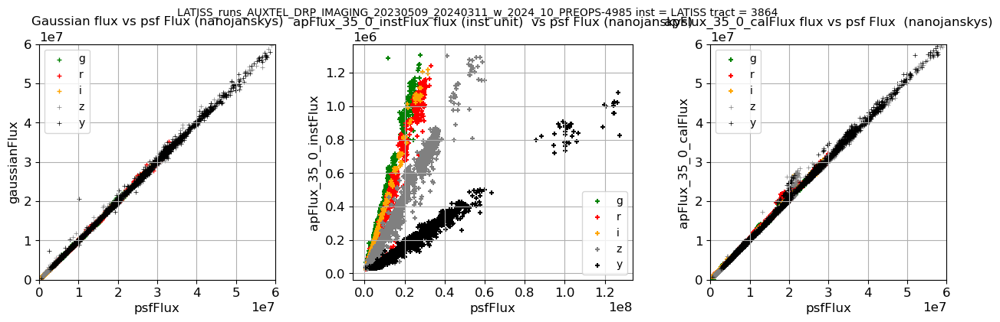

In [51]:
fig,axs = plt.subplots(1,3,figsize=(16,4))
ax=axs[0]
dataJoined_subset_g.plot.scatter(x="psfFlux",y="gaussianFlux",ax=ax,color="g",marker="+",lw=1,label="g")
dataJoined_subset_r.plot.scatter(x="psfFlux",y="gaussianFlux",ax=ax,color="r",marker="+",lw=1,label="r")
dataJoined_subset_i.plot.scatter(x="psfFlux",y="gaussianFlux",ax=ax,color="orange",marker="+",lw=1,label="i")
dataJoined_subset_z.plot.scatter(x="psfFlux",y="gaussianFlux",ax=ax,color="grey",marker="+",lw=0.5,label="z")
dataJoined_subset_y.plot.scatter(x="psfFlux",y="gaussianFlux",ax=ax,color="k",marker="+",lw=0.5,label="y")
ax.set_aspect("equal")
ax.set_xlim(0.,0.6e8)
ax.set_ylim(0.,0.6e8)
ax.set_title("Gaussian flux vs psf Flux (nanojanskys)")
ax.grid()

ax=axs[1]
dataJoined_subset_g.plot.scatter(x="psfFlux",y="apFlux_35_0_instFlux",ax=ax,color="g",marker="+",label="g")
dataJoined_subset_r.plot.scatter(x="psfFlux",y="apFlux_35_0_instFlux",ax=ax,color="r",marker="+",label="r")
dataJoined_subset_i.plot.scatter(x="psfFlux",y="apFlux_35_0_instFlux",ax=ax,color="orange",marker="+",label="i")
dataJoined_subset_z.plot.scatter(x="psfFlux",y="apFlux_35_0_instFlux",ax=ax,color="grey",marker="+",label="z")
dataJoined_subset_y.plot.scatter(x="psfFlux",y="apFlux_35_0_instFlux",ax=ax,color="k",marker="+",label="y")
ax.set_aspect("auto")
ax.set_title("apFlux_35_0_instFlux flux (inst unit)  vs psf Flux (nanojanskys)")
ax.grid()

ax=axs[2]
dataJoined_subset_g.plot.scatter(x="psfFlux",y="apFlux_35_0_calFlux",ax=ax,color="g",marker="+",label="g")
dataJoined_subset_r.plot.scatter(x="psfFlux",y="apFlux_35_0_calFlux",ax=ax,color="r",marker="+",label="r")
dataJoined_subset_i.plot.scatter(x="psfFlux",y="apFlux_35_0_calFlux",ax=ax,color="orange",marker="+",label="i")
dataJoined_subset_z.plot.scatter(x="psfFlux",y="apFlux_35_0_calFlux",ax=ax,color="grey",marker="+",lw=0.5,label="z")
dataJoined_subset_y.plot.scatter(x="psfFlux",y="apFlux_35_0_calFlux",ax=ax,color="k",marker="+",lw=0.5,label="y")
ax.set_aspect("equal")
ax.set_xlim(0.,0.6e8)
ax.set_ylim(0.,0.6e8)
ax.set_title("apFlux_35_0_calFlux flux vs psf Flux  (nanojanskys)")
ax.grid()
plt.suptitle(suptitle,y=1.0,fontsize=10)

Text(0.5, 1.0, 'LATISS_runs_AUXTEL_DRP_IMAGING_20230509_20240311_w_2024_10_PREOPS-4985 inst = LATISS tract = 3864')

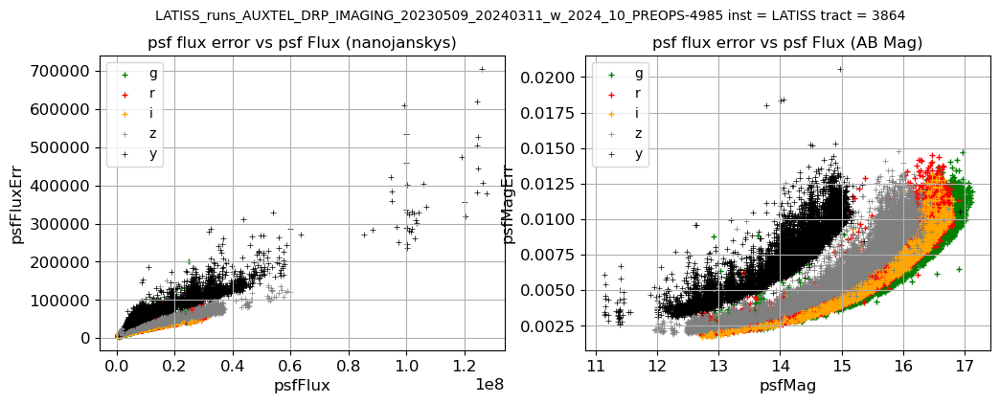

In [52]:
fig,axs = plt.subplots(1,2,figsize=(12,4))
ax=axs[0]
dataJoined_subset_g.plot.scatter(x="psfFlux",y="psfFluxErr",ax=ax,color="g",marker="+",lw=1,label="g")
dataJoined_subset_r.plot.scatter(x="psfFlux",y="psfFluxErr",ax=ax,color="r",marker="+",lw=1,label="r")
dataJoined_subset_i.plot.scatter(x="psfFlux",y="psfFluxErr",ax=ax,color="orange",marker="+",lw=1,label="i")
dataJoined_subset_z.plot.scatter(x="psfFlux",y="psfFluxErr",ax=ax,color="grey",marker="+",lw=0.5,label="z")
dataJoined_subset_y.plot.scatter(x="psfFlux",y="psfFluxErr",ax=ax,color="k",marker="+",lw=0.5,label="y")
ax.set_aspect("auto")

ax.set_title("psf flux error vs psf Flux (nanojanskys)")
ax.grid()

ax=axs[1]
dataJoined_subset_g.plot.scatter(x="psfMag",y="psfMagErr",ax=ax,color="g",marker="+",lw=1,label="g")
dataJoined_subset_r.plot.scatter(x="psfMag",y="psfMagErr",ax=ax,color="r",marker="+",lw=1,label="r")
dataJoined_subset_i.plot.scatter(x="psfMag",y="psfMagErr",ax=ax,color="orange",marker="+",lw=1,label="i")
dataJoined_subset_z.plot.scatter(x="psfMag",y="psfMagErr",ax=ax,color="grey",marker="+",lw=0.5,label="z")
dataJoined_subset_y.plot.scatter(x="psfMag",y="psfMagErr",ax=ax,color="k",marker="+",lw=0.5,label="y")
ax.set_aspect("auto")

ax.set_title("psf flux error vs psf Flux (AB Mag)")
ax.grid()

plt.suptitle(suptitle,y=1.0,fontsize=10)

## Statistics on Light Curves

- want number of source per object

In [53]:
#my_list = list(dataJoined.columns)
#for name in my_list:
#    print(name)

#### Compute pandas series with multi-label or series per color 

In [54]:
count_source_visit = dataJoined_subset.groupby(by=["obj_index","band"]).count()["visit"]
size_source_visit = dataJoined_subset.groupby(by=["obj_index","band"]).size()
count_source_visit_g = dataJoined_subset_g.groupby(by=["obj_index"]).count()["sourceId"]
count_source_visit_r = dataJoined_subset_r.groupby(by=["obj_index"]).count()["sourceId"]
count_source_visit_i = dataJoined_subset_i.groupby(by=["obj_index"]).count()["sourceId"]
count_source_visit_z = dataJoined_subset_z.groupby(by=["obj_index"]).count()["sourceId"]
count_source_visit_y = dataJoined_subset_y.groupby(by=["obj_index"]).count()["sourceId"]
size_source_visit_g = dataJoined_subset_g.groupby(by=["obj_index"]).size()
size_source_visit_r = dataJoined_subset_r.groupby(by=["obj_index"]).size()
size_source_visit_i = dataJoined_subset_i.groupby(by=["obj_index"]).size()
size_source_visit_z = dataJoined_subset_z.groupby(by=["obj_index"]).size()
size_source_visit_y = dataJoined_subset_y.groupby(by=["obj_index"]).size()

Text(0.5, 1.0, 'LATISS_runs_AUXTEL_DRP_IMAGING_20230509_20240311_w_2024_10_PREOPS-4985 inst = LATISS tract = 3864')

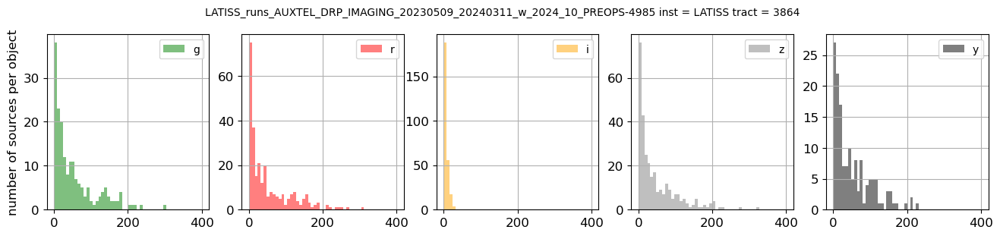

In [55]:
fig,axs = plt.subplots(1,5,figsize=(16,3))
ax=axs[0]
size_source_visit_g.hist(bins=50,range=(0,400.),ax=ax,facecolor="g",alpha=0.5,label="g")
ax.legend()
ax.set_ylabel("number of sources per object")
ax=axs[1]
size_source_visit_r.hist(bins=50,range=(0,400.),ax=ax,facecolor="r",alpha=0.5,label="r")
ax.legend()
ax=axs[2]
size_source_visit_i.hist(bins=50,range=(0,400.),ax=ax,facecolor="orange",alpha=0.5,label="i")
ax.legend()
ax=axs[3]
size_source_visit_z.hist(bins=50,range=(0,400.),ax=ax,facecolor="grey",alpha=0.5,label="z")
ax.legend()
ax=axs[4]
size_source_visit_y.hist(bins=50,range=(0,400.),ax=ax,facecolor="k",alpha=0.5,label="y")
ax.legend()


plt.suptitle(suptitle,y=1.0,fontsize=10)

In [56]:
#count_source_visit[3,"r"]

### Filtering the object using pandas series and dataframe

#### Unstacking a multi-label pandas series into a dataframe

In [57]:
NMIN = 20. # minimum number of visit in Y band
NBANDMIN = 4 # nimimum number of bands

In [58]:
size_source_visit 

obj_index  band
1          g         5
           i        30
           r       249
           z       193
2          i        30
                  ... 
1270       g        74
1271       g        53
1286       y        26
1287       y        11
1289       y         3
Length: 1170, dtype: int64

#### Select the object having at least NYMIN visit in band Y

- however it is useless, the selection will be done on pandas dataframe from unstacked series

In [59]:
cut_NY = size_source_visit[:,'y']  >= NMIN
cut_NY

obj_index
15      False
21       True
50      False
60       True
65       True
        ...  
1265    False
1267    False
1286     True
1287    False
1289    False
Length: 148, dtype: bool

In [60]:
size_source_visit_unstacked = size_source_visit.unstack()
size_source_visit_unstacked 

band,g,i,r,y,z
obj_index,,,,,
1,5.0,30.0,249.0,NaN,193.0
2,NaN,30.0,NaN,NaN,325.0
4,NaN,28.0,8.0,NaN,12.0
5,NaN,8.0,NaN,NaN,NaN
9,56.0,25.0,191.0,NaN,29.0
...,...,...,...,...,...
1270,74.0,NaN,NaN,NaN,NaN
1271,53.0,NaN,NaN,NaN,NaN
1286,NaN,NaN,NaN,26.0,NaN


#### Apply the selection on the pandas series

In [61]:
cut_on_size_in_bands = (size_source_visit_unstacked.y>= NMIN) & (size_source_visit_unstacked.g>= NMIN) & (size_source_visit_unstacked.r>= NMIN) & (size_source_visit_unstacked.z>= NMIN) 

size_source_visit_unstacked = size_source_visit_unstacked[cut_on_size_in_bands ] 
size_source_visit_unstacked

band,g,i,r,y,z
obj_index,,,,,
60,171.0,16.0,172.0,28.0,175.0
97,129.0,14.0,135.0,117.0,125.0
101,152.0,13.0,110.0,96.0,120.0
106,134.0,13.0,121.0,115.0,73.0
114,140.0,12.0,152.0,103.0,154.0
120,140.0,12.0,160.0,44.0,159.0
121,180.0,12.0,183.0,74.0,185.0
131,134.0,11.0,151.0,164.0,157.0
132,169.0,11.0,177.0,154.0,160.0


In [62]:
len(size_source_visit_unstacked)

57

#### Dropping the object not having a visit in all bands on the pandas dataframe from unstacked series

In [63]:
size_source_visit_selected =size_source_visit_unstacked.dropna(axis=0,how='any') 
size_source_visit_selected

band,g,i,r,y,z
obj_index,,,,,
60,171.0,16.0,172.0,28.0,175.0
97,129.0,14.0,135.0,117.0,125.0
101,152.0,13.0,110.0,96.0,120.0
106,134.0,13.0,121.0,115.0,73.0
114,140.0,12.0,152.0,103.0,154.0
120,140.0,12.0,160.0,44.0,159.0
121,180.0,12.0,183.0,74.0,185.0
131,134.0,11.0,151.0,164.0,157.0
132,169.0,11.0,177.0,154.0,160.0


#### Restack the pandas dataframe into a pandas series with multi-label

In [64]:
ser_size_source_visit_selected = size_source_visit_selected.stack()
ser_size_source_visit_selected 

obj_index  band
60         g       171.0
           i        16.0
           r       172.0
           y        28.0
           z       175.0
                   ...  
882        g        49.0
           i         1.0
           r        47.0
           y        58.0
           z        43.0
Length: 255, dtype: float64

#### Extract the list of selected objects from the pandas dataframe (from unstacked series)

In [65]:
selected_objects_indexes = list(size_source_visit_selected.index)
print("Nobj = ",len(selected_objects_indexes),"::",selected_objects_indexes )

Nobj =  51 :: [60, 97, 101, 106, 114, 120, 121, 131, 132, 151, 156, 158, 167, 178, 187, 190, 213, 240, 245, 256, 265, 310, 333, 366, 373, 404, 406, 426, 442, 466, 470, 488, 500, 514, 534, 535, 543, 548, 549, 564, 570, 591, 602, 613, 617, 637, 643, 647, 768, 851, 882]


In [66]:
#ser_size_source_visit_selected.keys() 

#### Loop on keys multi-label in pandas series

In [67]:
#for name,group in dataJoined_subset.groupby(by=["obj_index","band"]):
#    print("name = ",name)
#    print("group = ",group["visitId"])

In [68]:
#for (idx,band),val in count_source_visit:
#    print(idx,band,val)

### Plot the SED with psf Flux

171


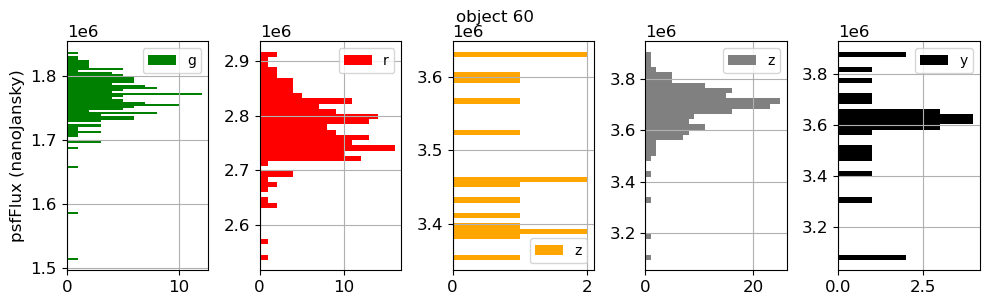

129


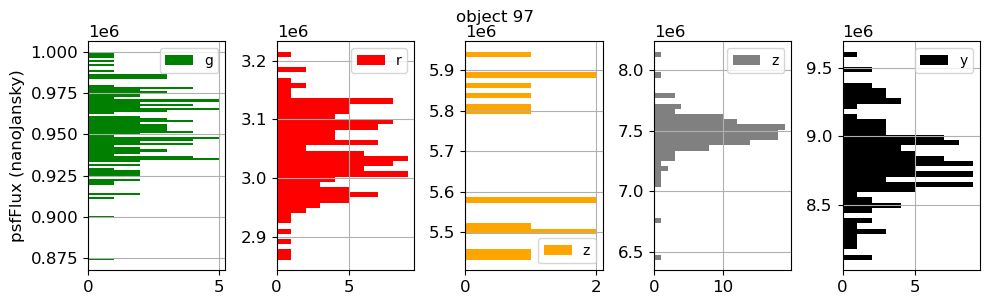

152


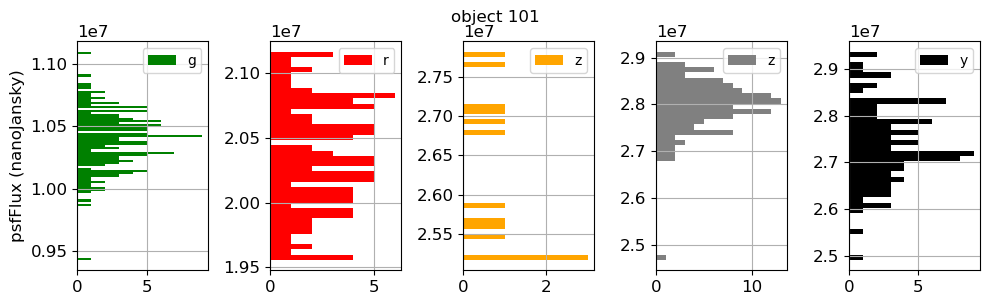

134


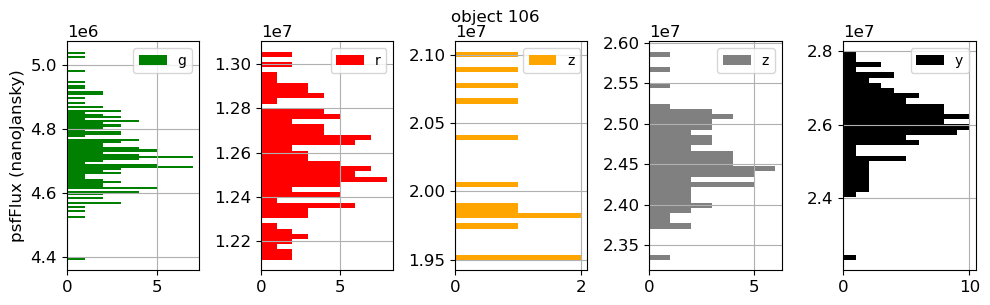

140


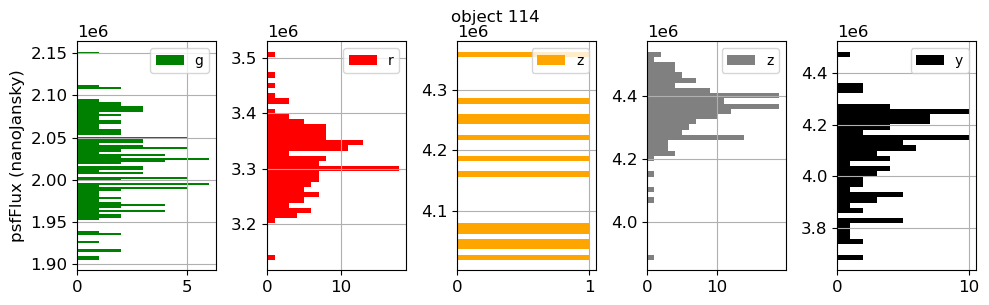

140


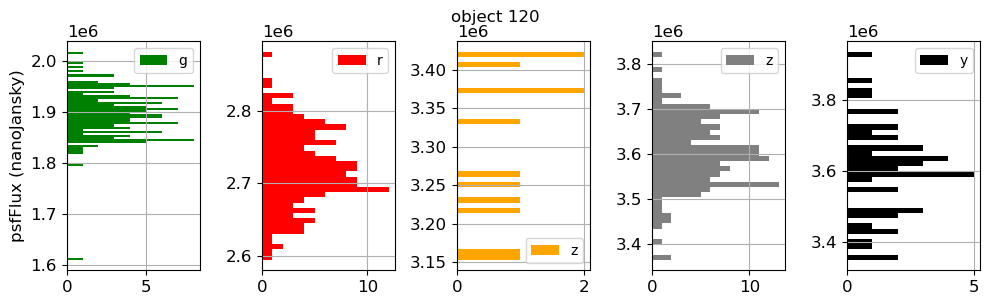

180


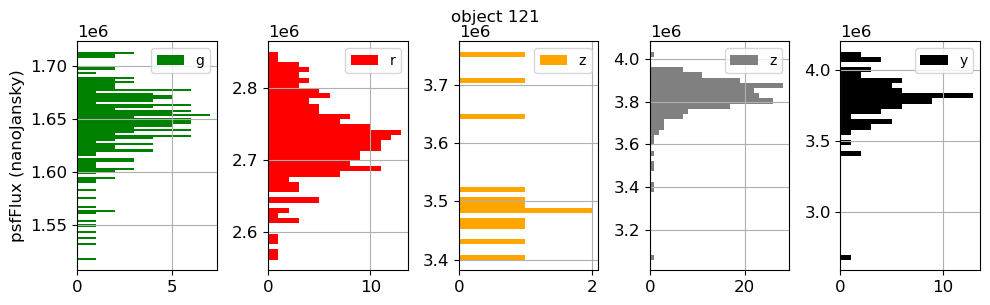

134


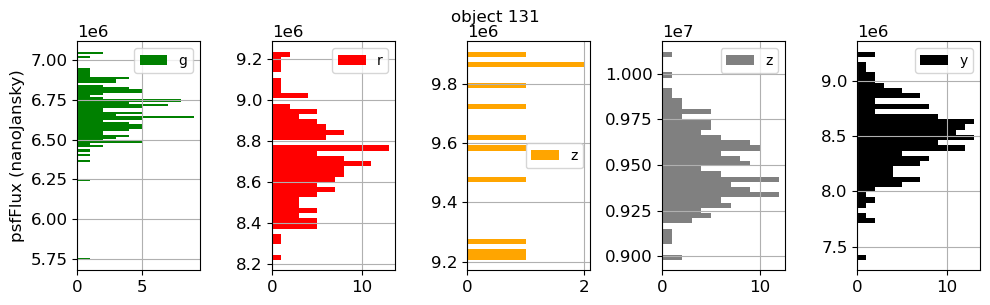

169


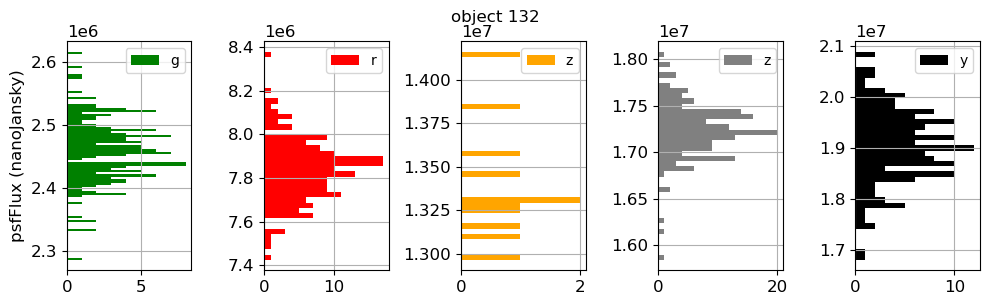

126


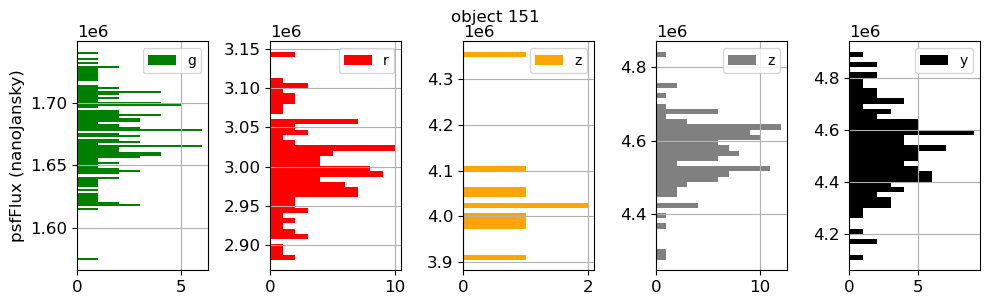

146


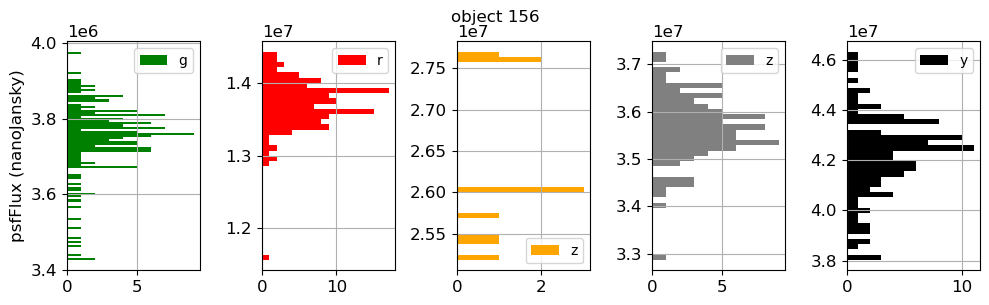

137


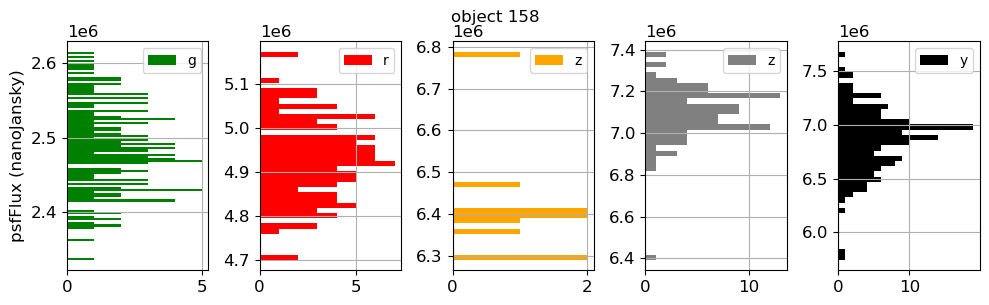

68


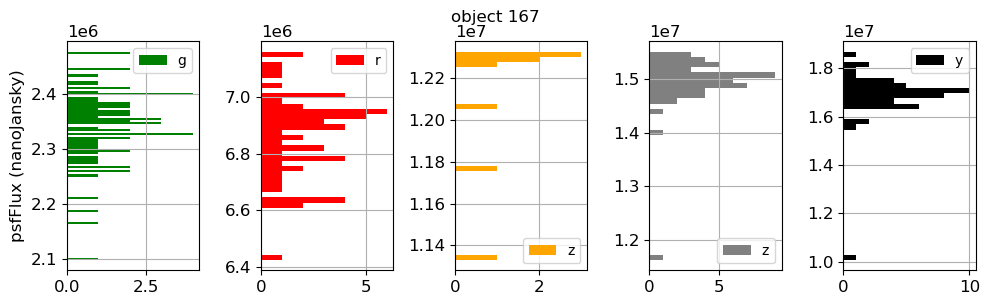

299


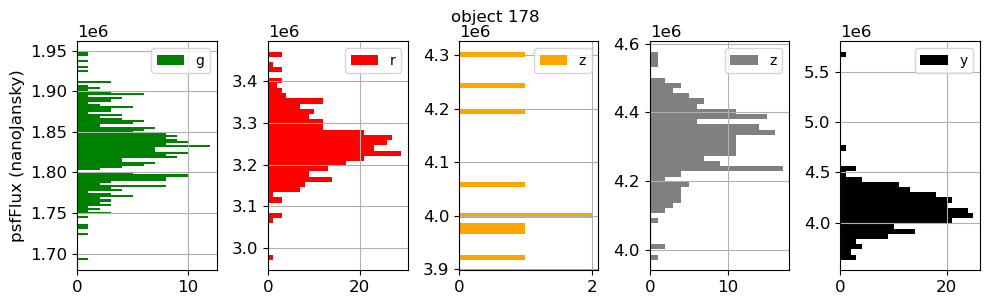

62


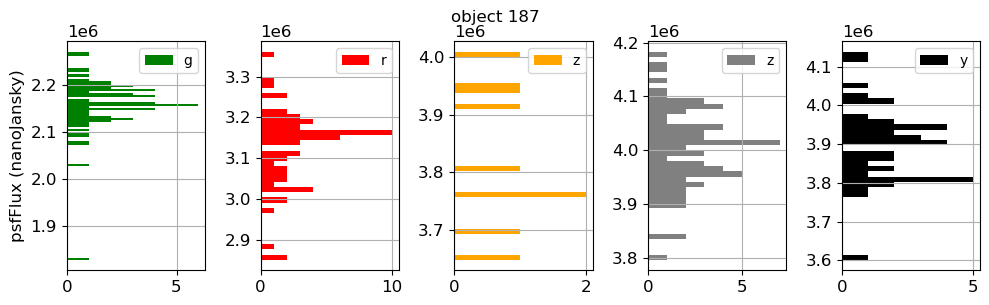

93


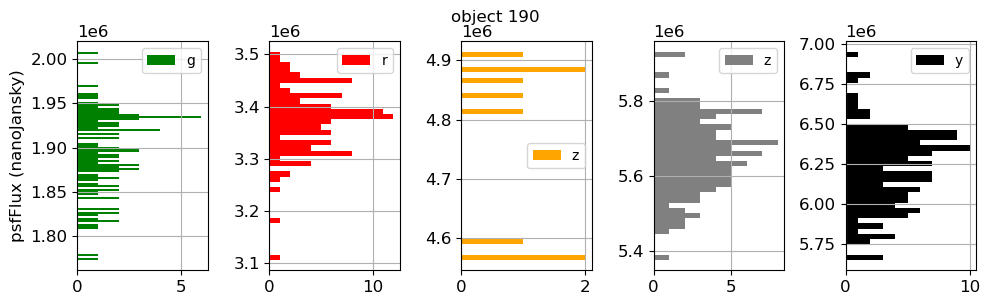

104


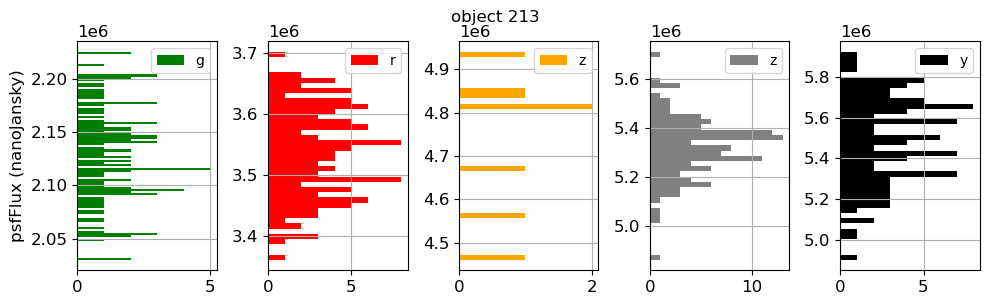

114


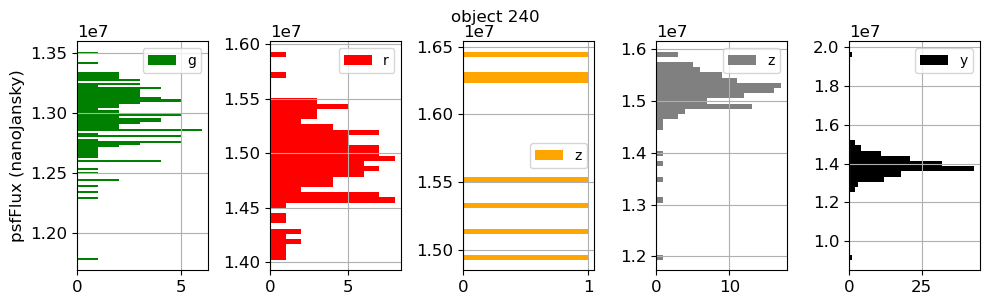

97


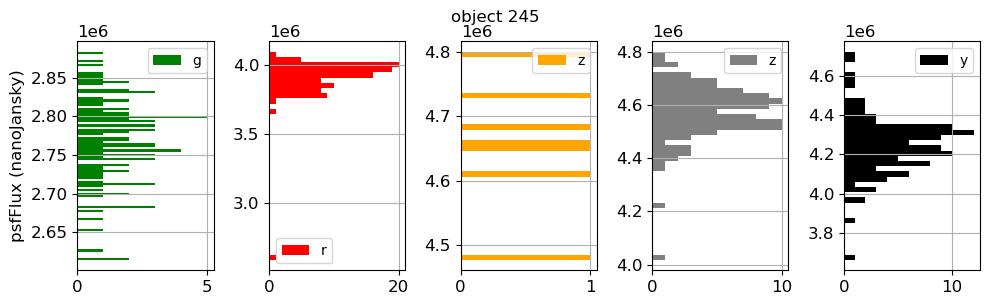

160


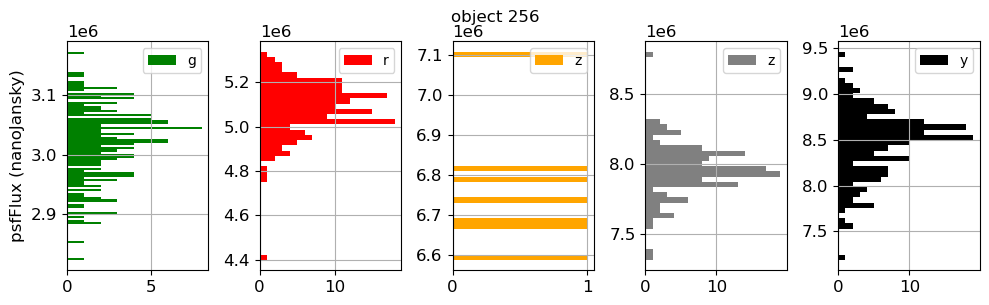

82


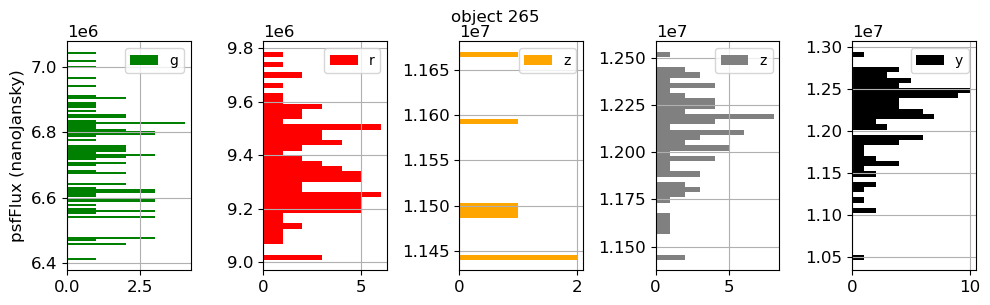

78


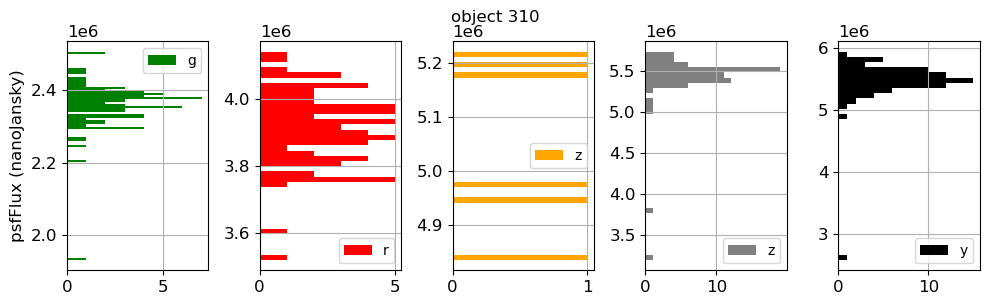

47


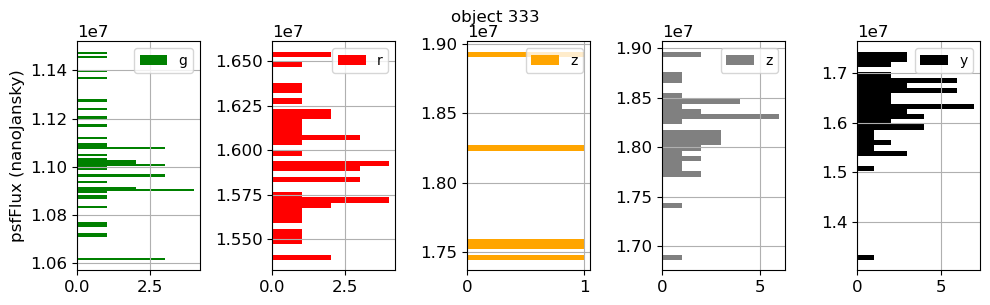

183


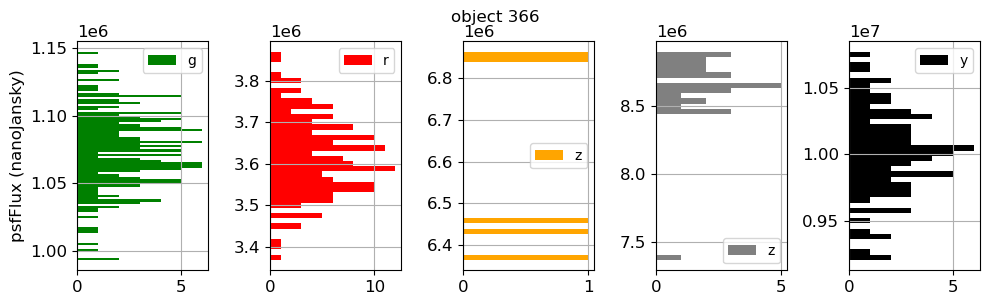

138


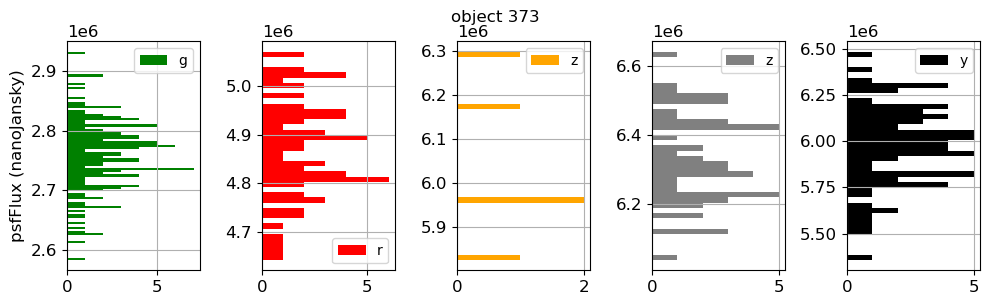

47


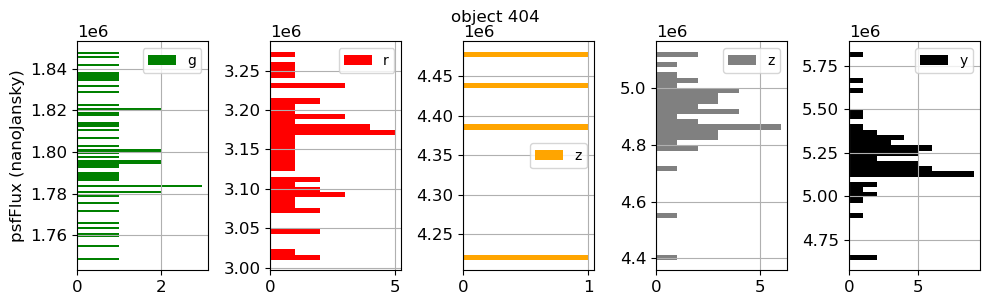

46


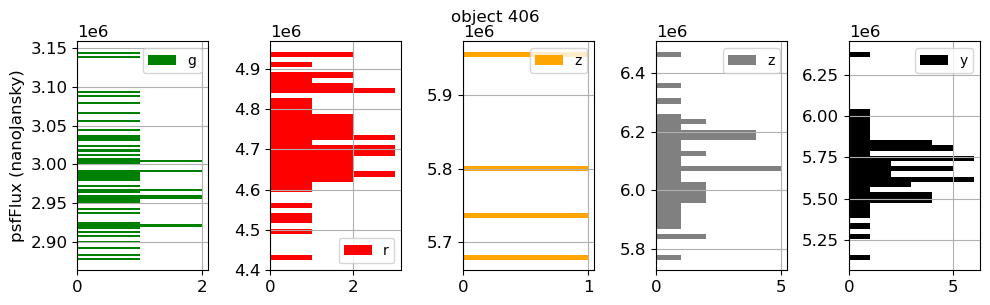

30


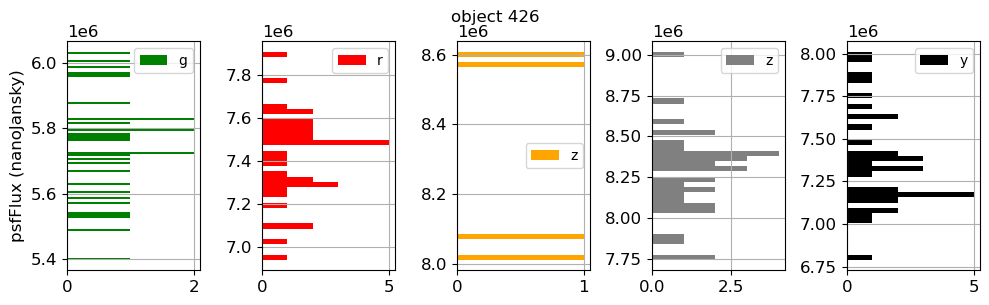

72


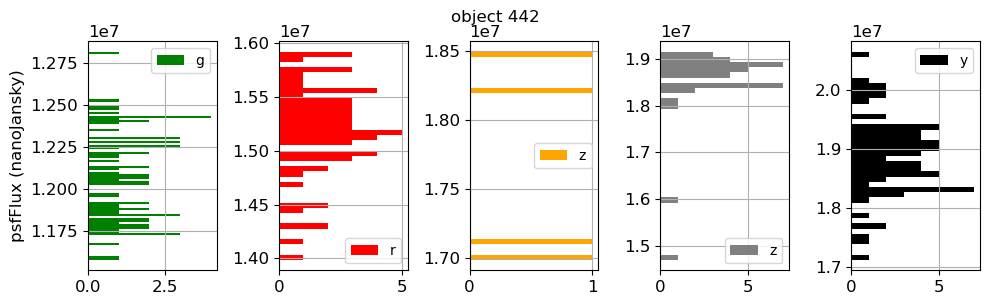

164


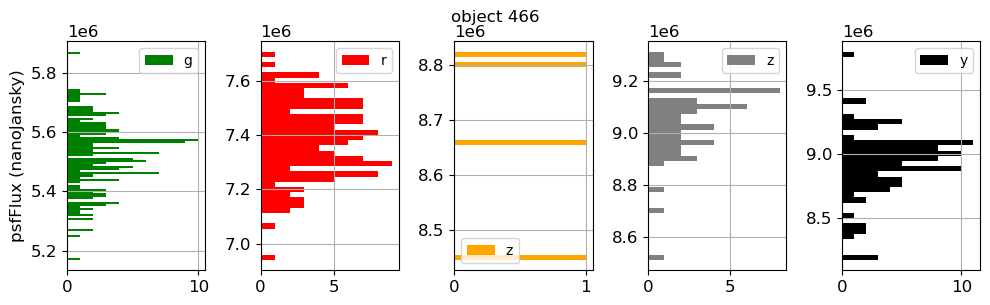

50


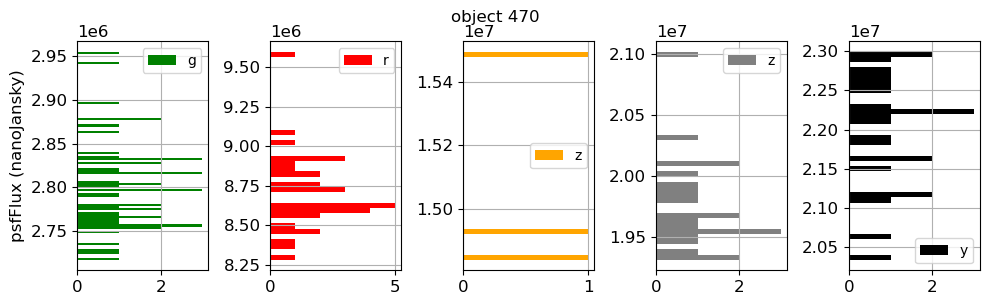

93


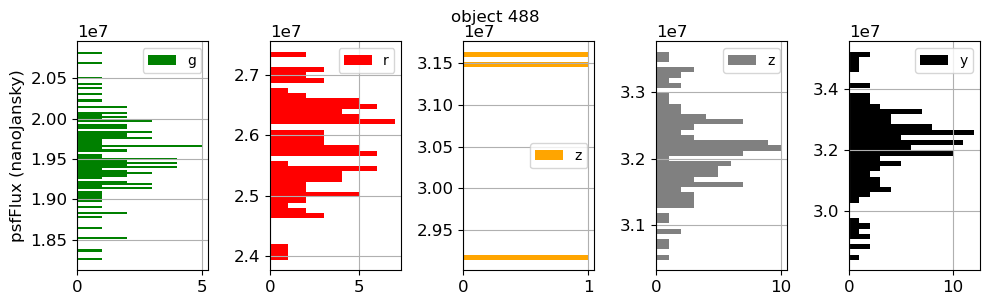

88


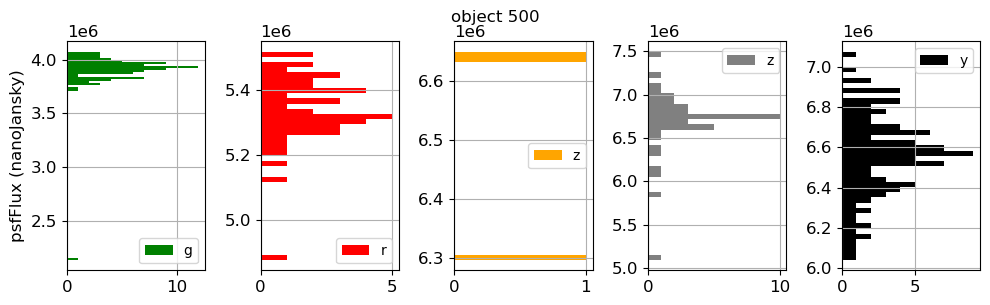

59


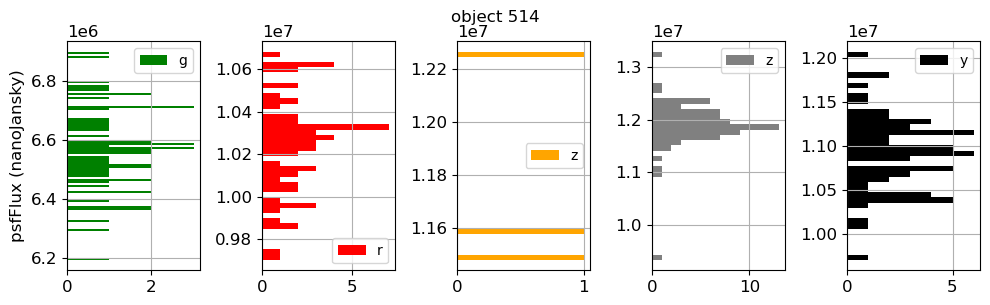

40


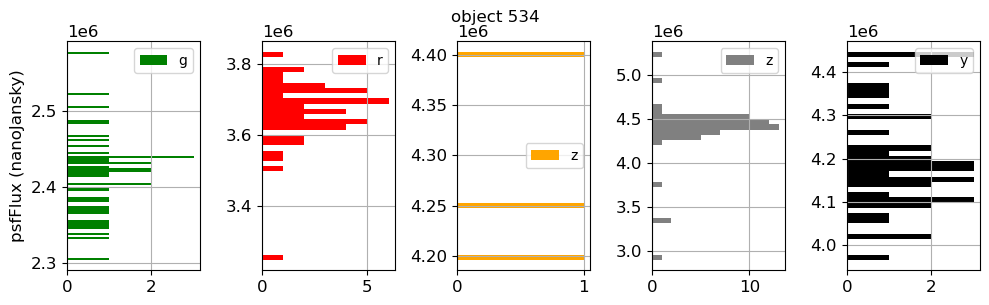

202


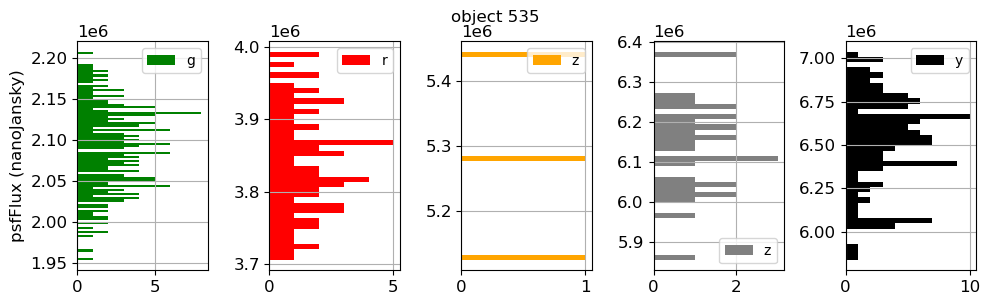

123


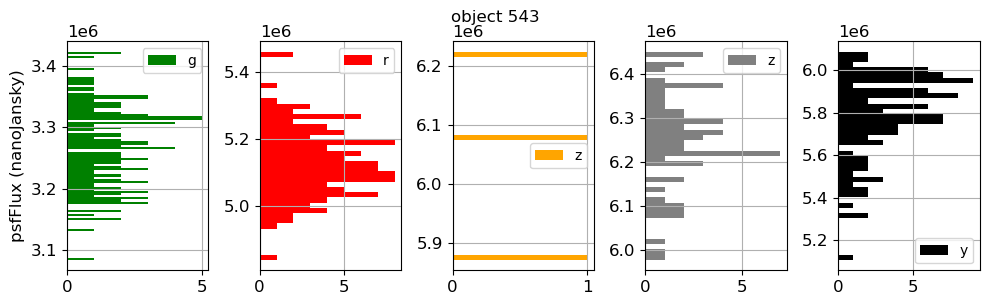

35


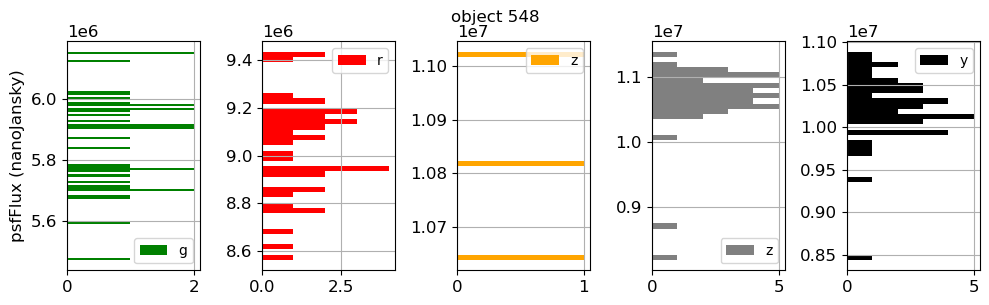

55


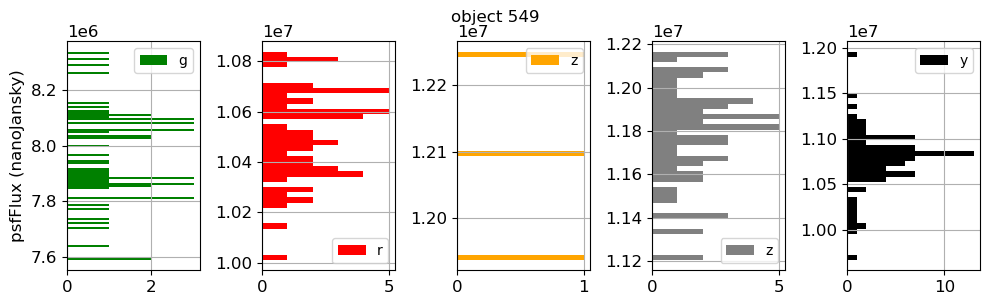

221


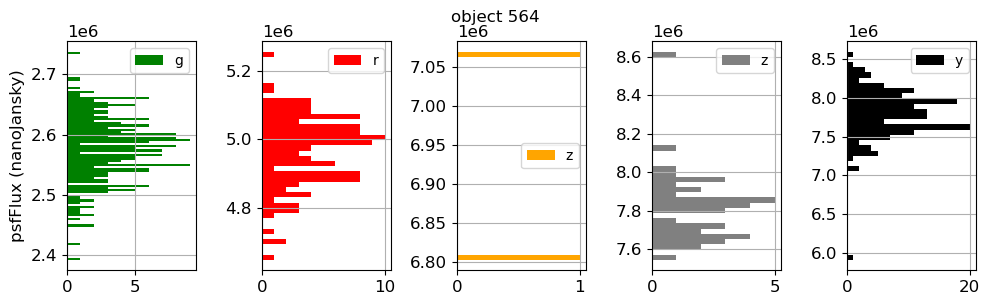

55


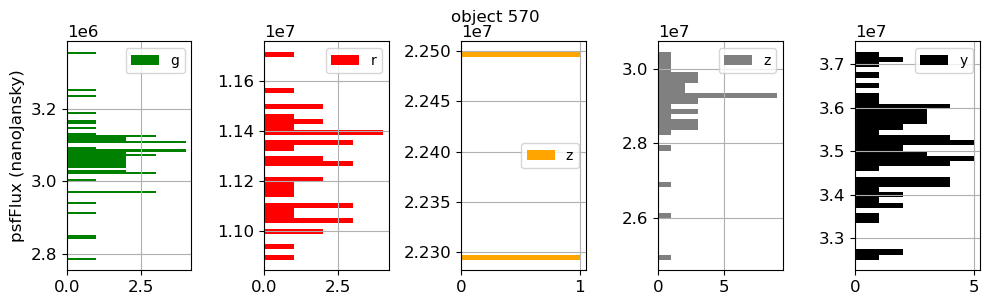

32


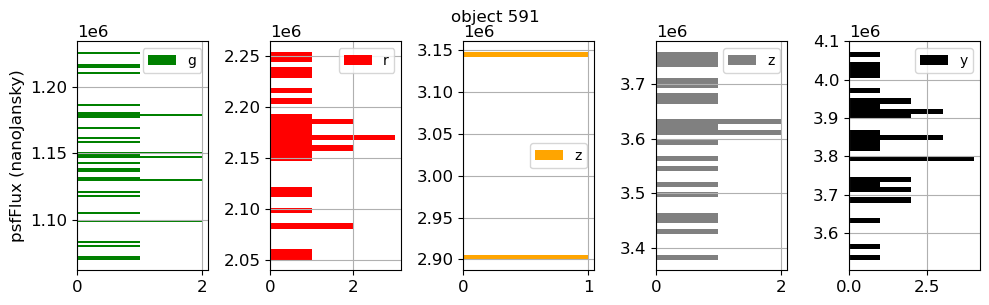

47


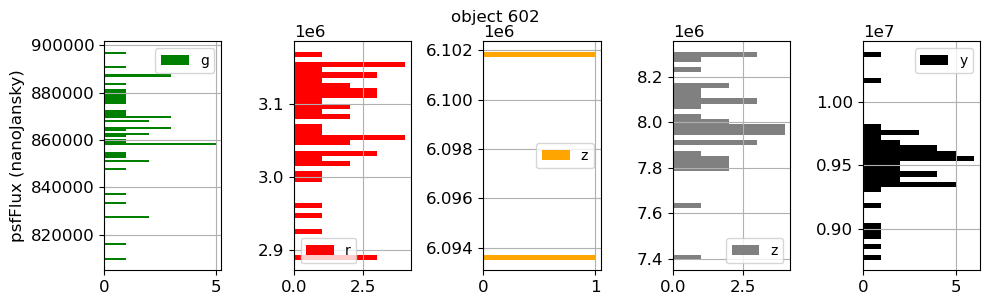

70


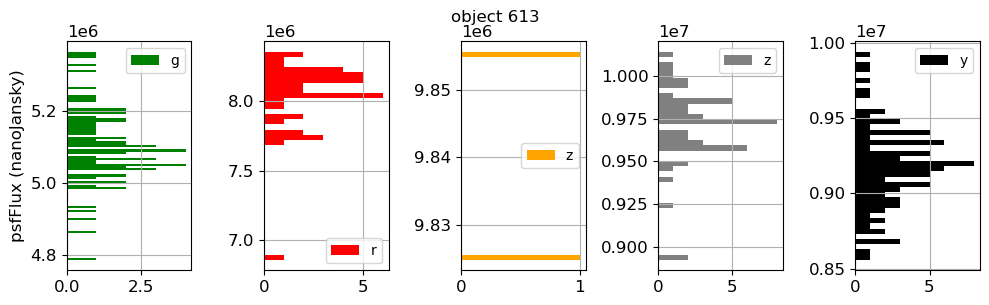

30


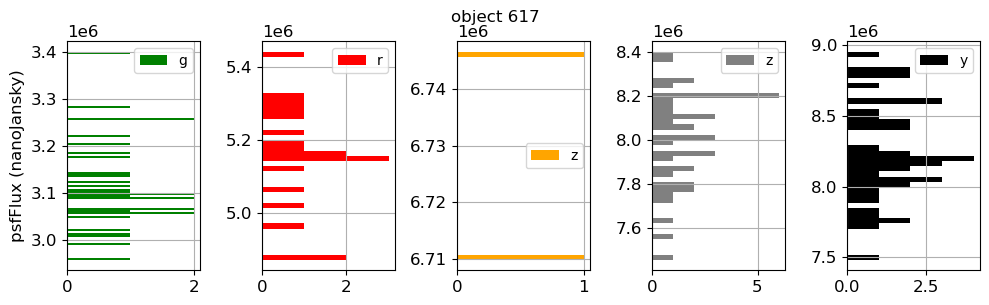

87


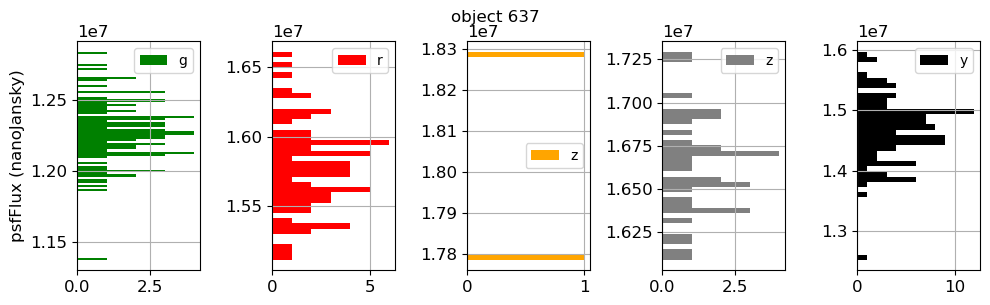

31


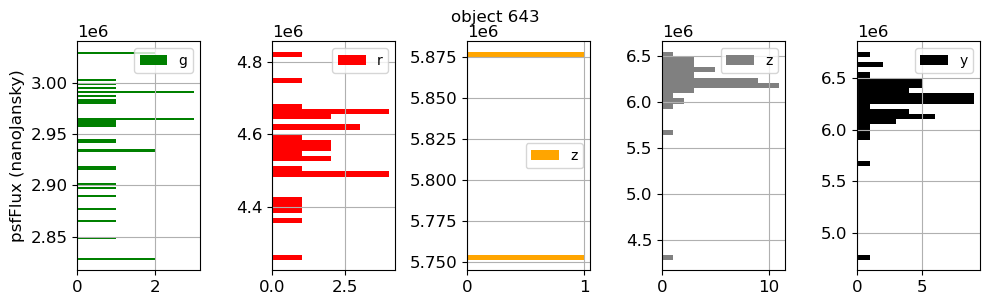

30


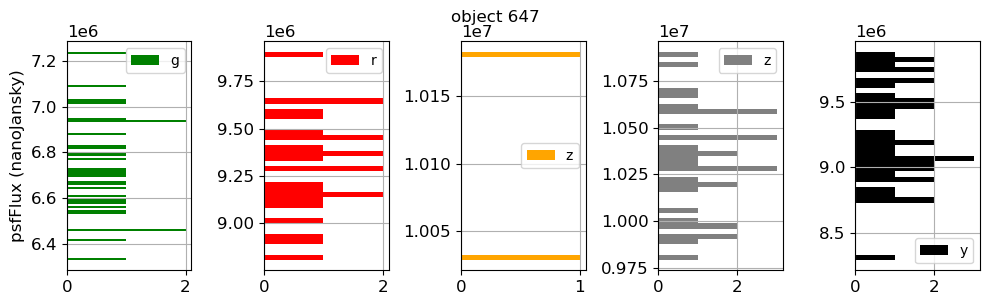

53


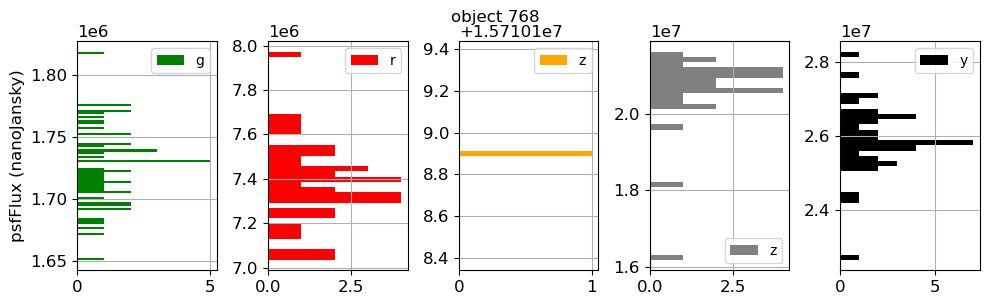

37


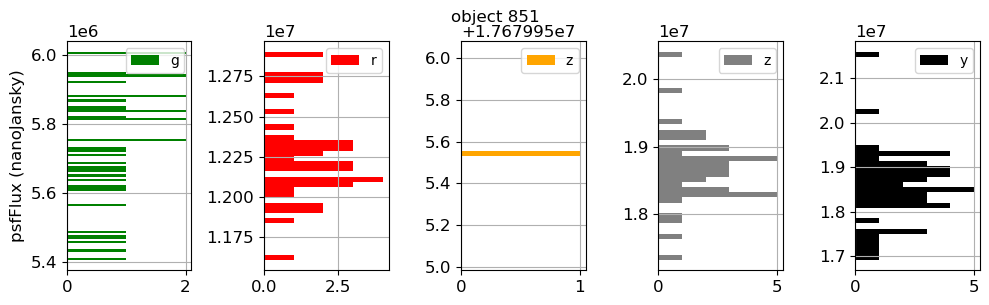

49


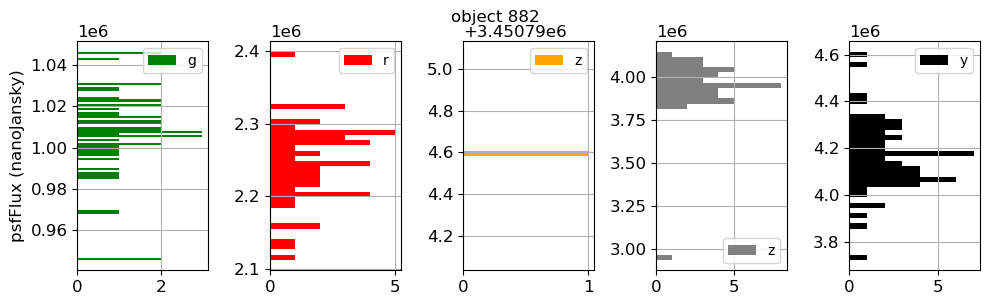

Text(0.5, 1.0, 'LATISS_runs_AUXTEL_DRP_IMAGING_20230509_20240311_w_2024_10_PREOPS-4985 inst = LATISS tract = 3864')

<Figure size 1000x600 with 0 Axes>

In [69]:
df_obj_sed = pd.DataFrame(columns=['idx_obj', 'ra', 'dec','magG', 'magR','magI','magZ','magY'])

icnt =0
for idx_obj_sel in selected_objects_indexes:
#for idx_obj_sel in [120]:
    cut_sel_object = dataJoined_subset.obj_index == idx_obj_sel 
    isolatedStarSources_sel = dataJoined_subset[cut_sel_object] 

    isolatedStarSources_sel_g = isolatedStarSources_sel[isolatedStarSources_sel["band"] == "g"]
    isolatedStarSources_sel_r = isolatedStarSources_sel[isolatedStarSources_sel["band"] == "r"]
    isolatedStarSources_sel_i = isolatedStarSources_sel[isolatedStarSources_sel["band"] == "i"]
    isolatedStarSources_sel_z = isolatedStarSources_sel[isolatedStarSources_sel["band"] == "z"]
    isolatedStarSources_sel_y = isolatedStarSources_sel[isolatedStarSources_sel["band"] == "y"]

    ra = isolatedStarSources_sel_g['ra'].mean()
    dec = isolatedStarSources_sel_g['dec'].mean()
    
    df_obj_sed.loc[icnt] = [idx_obj_sel,ra,dec,
                             isolatedStarSources_sel_g['psfMag'].median(),
                             isolatedStarSources_sel_r['psfMag'].median(),   
                             isolatedStarSources_sel_i['psfMag'].median(),   
                             isolatedStarSources_sel_z['psfMag'].median(),
                             isolatedStarSources_sel_y['psfMag'].median()]

    icnt +=1

    fig,axes = plt.subplots(1,5,figsize=(10,3))
    axs= axes.flatten()
    for idx,ax in enumerate(axs):
        if idx==0:
            print(len(isolatedStarSources_sel_g["psfFlux"]))
            isolatedStarSources_sel_g["psfFlux"].hist(bins=100,facecolor="g",ax=ax, orientation="horizontal")
            #isolatedStarSources_sel_g["psfFlux"].hist(bins=100,facecolor="g",ax=ax)
            ax.legend("g")
            ax.set_ylabel("psfFlux (nanoJansky)")
        elif idx==1:
            isolatedStarSources_sel_r["psfFlux"].hist(bins=40,facecolor="r",ax=ax, orientation="horizontal")
            ax.legend("r")
        elif idx==2:
            isolatedStarSources_sel_i["psfFlux"].hist(bins=40,facecolor="orange",ax=ax, orientation="horizontal")
            ax.legend("z")
        elif idx==3:
            isolatedStarSources_sel_z["psfFlux"].hist(bins=40,facecolor="grey",ax=ax, orientation="horizontal")
            ax.legend("z")
        elif idx==4:
            isolatedStarSources_sel_y["psfFlux"].hist(bins=40,facecolor="k",ax=ax, orientation="horizontal")
            ax.legend("y")
    plt.tight_layout(h_pad=0)  
    title =f"object {idx_obj_sel}"
    filename = f"sed_color_flux_obj_{idx_obj_sel}.png"
    plt.suptitle(title,y=1.000)
    plt.savefig(filename)
    plt.show()
plt.suptitle(suptitle,y=1.0,fontsize=10)

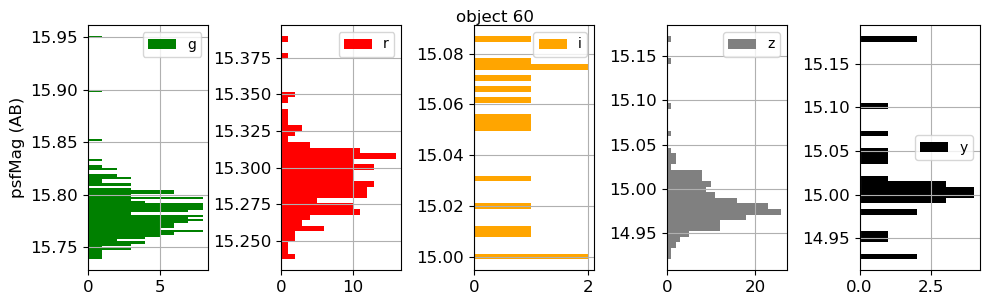

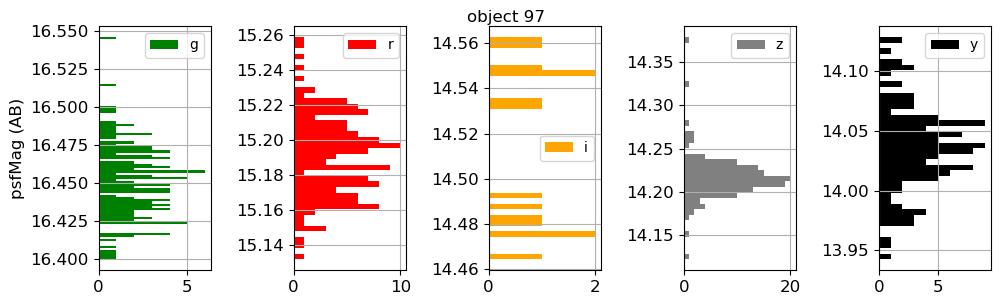

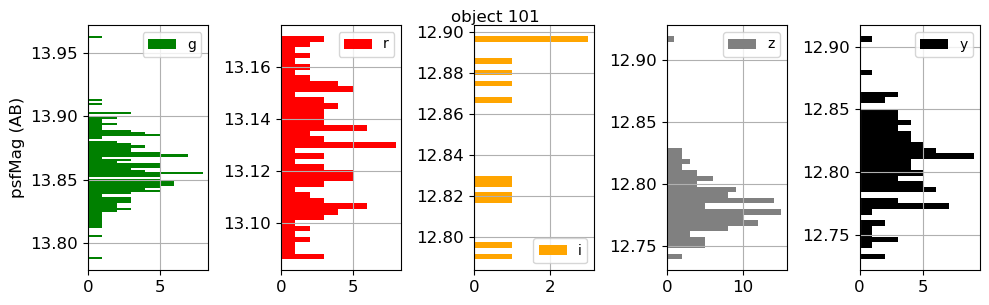

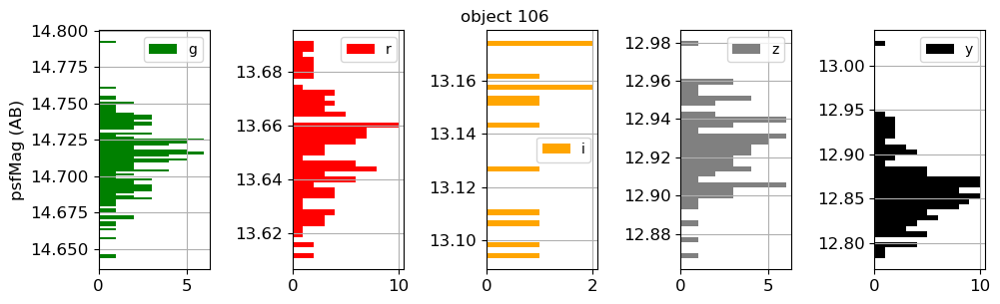

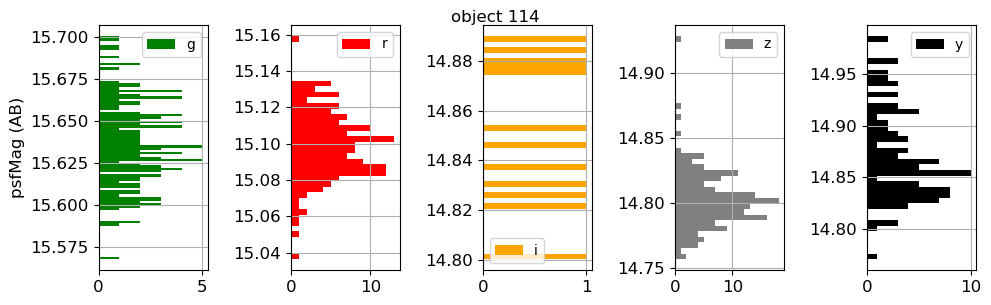

...

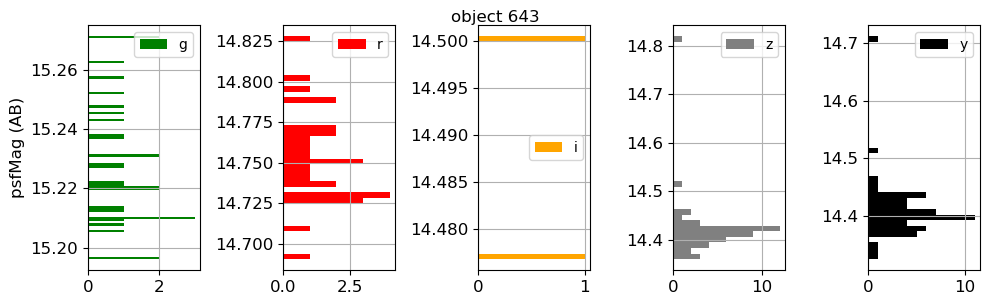

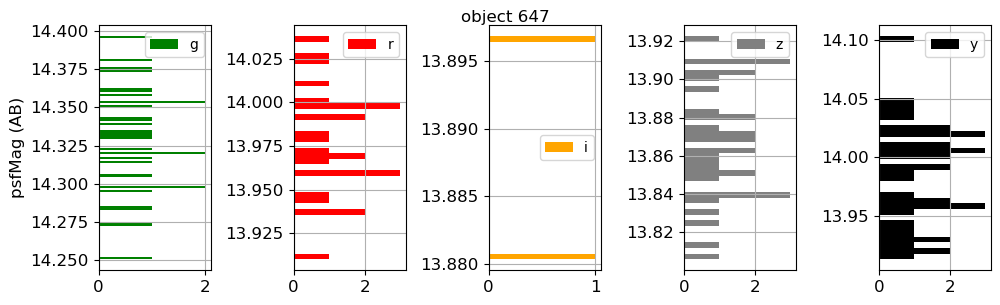

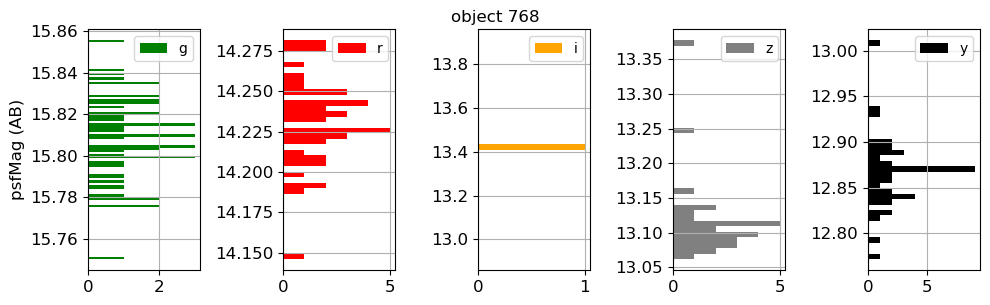

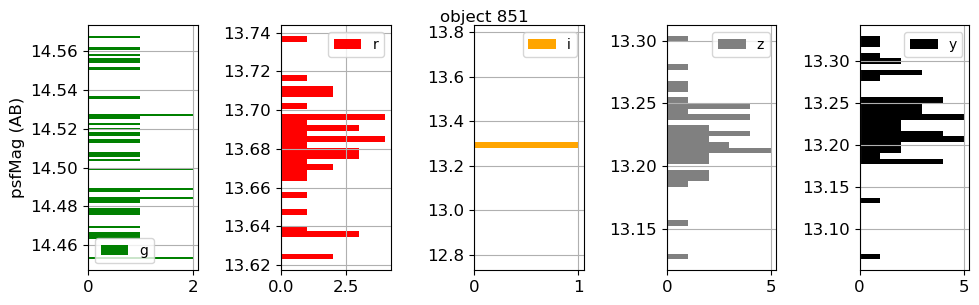

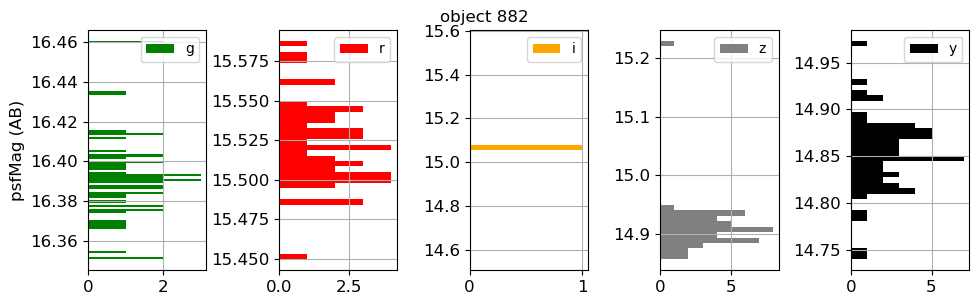

Text(0.5, 1.0, 'LATISS_runs_AUXTEL_DRP_IMAGING_20230509_20240311_w_2024_10_PREOPS-4985 inst = LATISS tract = 3864')

<Figure size 1000x600 with 0 Axes>

In [70]:
df_obj_sed = pd.DataFrame(columns=['idx_obj', 'ra', 'dec','magG', 'magR','magI','magZ','magY'])

icnt =0
for idx_obj_sel in selected_objects_indexes:
#for idx_obj_sel in [120]:
    cut_sel_object = dataJoined_subset.obj_index == idx_obj_sel 
    isolatedStarSources_sel = dataJoined_subset[cut_sel_object] 

    isolatedStarSources_sel_g = isolatedStarSources_sel[isolatedStarSources_sel["band"] == "g"]
    isolatedStarSources_sel_r = isolatedStarSources_sel[isolatedStarSources_sel["band"] == "r"]
    isolatedStarSources_sel_i = isolatedStarSources_sel[isolatedStarSources_sel["band"] == "i"]
    isolatedStarSources_sel_z = isolatedStarSources_sel[isolatedStarSources_sel["band"] == "z"]
    isolatedStarSources_sel_y = isolatedStarSources_sel[isolatedStarSources_sel["band"] == "y"]

    ra = isolatedStarSources_sel_g['ra'].mean()
    dec = isolatedStarSources_sel_g['dec'].mean()
    
    df_obj_sed.loc[icnt] = [idx_obj_sel,ra,dec,
                             isolatedStarSources_sel_g['psfMag'].median(),
                             isolatedStarSources_sel_r['psfMag'].median(),   
                             isolatedStarSources_sel_i['psfMag'].median(),   
                             isolatedStarSources_sel_z['psfMag'].median(),
                             isolatedStarSources_sel_y['psfMag'].median()]

    icnt +=1

    fig,axes = plt.subplots(1,5,figsize=(10,3))
    axs= axes.flatten()
    for idx,ax in enumerate(axs):
        if idx==0:
           
            isolatedStarSources_sel_g["psfMag"].hist(bins=100,facecolor="g",ax=ax, orientation="horizontal")
            #isolatedStarSources_sel_g["psfFlux"].hist(bins=100,facecolor="g",ax=ax)
            ax.legend("g")
            ax.set_ylabel("psfMag (AB)")
        elif idx==1:
            isolatedStarSources_sel_r["psfMag"].hist(bins=40,facecolor="r",ax=ax, orientation="horizontal")
            ax.legend("r")
        elif idx==2:
            isolatedStarSources_sel_i["psfMag"].hist(bins=40,facecolor="orange",ax=ax, orientation="horizontal")
            ax.legend("i")
        elif idx==3:
            isolatedStarSources_sel_z["psfMag"].hist(bins=40,facecolor="grey",ax=ax, orientation="horizontal")
            ax.legend("z")
        elif idx==4:
            isolatedStarSources_sel_y["psfMag"].hist(bins=40,facecolor="k",ax=ax, orientation="horizontal")
            ax.legend("y")
    plt.tight_layout(h_pad=0)  
    title =f"object {idx_obj_sel}"
    filename = f"sed_color_flux_obj_{idx_obj_sel}.png"
    plt.suptitle(title,y=1.000)
    plt.savefig(filename)
    plt.show()
plt.suptitle(suptitle,y=1.0,fontsize=10)

In [71]:
# define the sigmaclip algo
sigclip = SigmaClip(sigma=2, maxiters=None, cenfunc='mean')


df_obj_sed = pd.DataFrame(columns=['idx_obj', 'ra', 'dec','magG', 'magR','magI','magZ','magY','smagG', 'smagR','smagI','smagZ','smagY'])

icnt =0
for idx_obj_sel in selected_objects_indexes:
#for idx_obj_sel in [120]:
    cut_sel_object = dataJoined_subset.obj_index == idx_obj_sel 
    isolatedStarSources_sel = dataJoined_subset[cut_sel_object] 

    isolatedStarSources_sel_g = isolatedStarSources_sel[isolatedStarSources_sel["band"] == "g"]
    isolatedStarSources_sel_r = isolatedStarSources_sel[isolatedStarSources_sel["band"] == "r"]
    isolatedStarSources_sel_i = isolatedStarSources_sel[isolatedStarSources_sel["band"] == "i"]
    isolatedStarSources_sel_z = isolatedStarSources_sel[isolatedStarSources_sel["band"] == "z"]
    isolatedStarSources_sel_y = isolatedStarSources_sel[isolatedStarSources_sel["band"] == "y"]

    sample_g = isolatedStarSources_sel_g['psfMag'].values
    sample_r = isolatedStarSources_sel_r['psfMag'].values
    sample_i = isolatedStarSources_sel_i['psfMag'].values
    sample_z = isolatedStarSources_sel_z['psfMag'].values
    sample_y = isolatedStarSources_sel_y['psfMag'].values
 
    
    sample_g = sigclip(sample_g, masked=False, copy=False)
    sample_r = sigclip(sample_r, masked=False, copy=False)
    
    sample_z = sigclip(sample_z, masked=False, copy=False)
    sample_y = sigclip(sample_y, masked=False, copy=False)


 
    
    ra = isolatedStarSources_sel_g['ra'].mean()
    dec = isolatedStarSources_sel_g['dec'].mean()
    
    df_obj_sed.loc[icnt] = [idx_obj_sel,ra,dec,
                             sample_g.mean(),sample_r.mean(),sample_i.mean(),sample_z.mean(),sample_y.mean(),
                             sample_g.std(),sample_r.std(),sample_i.std(),sample_z.std(),sample_y.std()              
                           ]

    icnt +=1

plt.suptitle(suptitle,y=1.0,fontsize=10) 

Text(0.5, 1.0, 'LATISS_runs_AUXTEL_DRP_IMAGING_20230509_20240311_w_2024_10_PREOPS-4985 inst = LATISS tract = 3864')

<Figure size 1000x600 with 0 Axes>

In [72]:
df_obj_sed 

,idx_obj,ra,dec,magG,magR,magI,magZ,magY,smagG,smagR,smagI,smagZ,smagY
0,60.0,122.458940,-36.203409,15.780329,15.291872,15.046134,14.975505,15.003724,0.014902,0.014185,0.029178,0.010582,0.008030
1,97.0,122.443239,-36.188544,16.450535,15.191326,14.513583,14.215112,14.036297,0.019326,0.019672,0.035140,0.011367,0.018223
2,101.0,122.476593,-36.168953,13.856991,13.128910,12.851746,12.779792,12.809042,0.017624,0.021917,0.038518,0.015201,0.022315
3,106.0,122.558803,-36.184125,14.715377,13.651554,13.139435,12.924590,12.855124,0.018026,0.015232,0.027507,0.016101,0.016439
4,114.0,122.556549,-36.138403,15.635126,15.097675,14.851618,14.801064,14.849481,0.020914,0.013408,0.028150,0.014037,0.017874
5,120.0,122.565974,-36.177767,15.705627,15.313506,15.103761,15.006803,15.008673,0.020139,0.018248,0.031215,0.018382,0.027181
6,121.0,122.467499,-36.198182,15.854164,15.310193,15.031278,14.937808,14.946014,0.012057,0.013127,0.033002,0.013443,0.019950
7,131.0,122.573561,-36.178003,14.338505,14.053869,13.945172,13.957948,14.076195,0.019428,0.019381,0.028923,0.018137,0.029493
8,132.0,122.532137,-36.209822,15.422965,14.164790,13.582704,13.309119,13.194239,0.016756,0.011950,0.026648,0.011670,0.027894
9,151.0,122.562104,-36.210801,15.838517,15.207580,14.881697,14.747959,14.762834,0.014591,0.011516,0.029950,0.013890,0.027837


In [73]:
dict_photores = {}
Flist = ["G","R","I","Z","Y"]
for f in Flist :
    label = f"smag{f}"
    smean = df_obj_sed[label].values.mean() 
    smmag = smean*1000. 
    title = "{} = {:.2f} mmag".format(label,smmag)

    d = dict(sig=smean,title=title)
    dict_photores[f] = d

In [74]:
dict_photores

{'G': {'sig': 0.01798699634902087, 'title': 'smagG = 17.99 mmag'},
 'R': {'sig': 0.01709840118011244, 'title': 'smagR = 17.10 mmag'},
 'I': {'sig': 0.024189870045029597, 'title': 'smagI = 24.19 mmag'},
 'Z': {'sig': 0.016228110072805228, 'title': 'smagZ = 16.23 mmag'},
 'Y': {'sig': 0.023788697990563774, 'title': 'smagY = 23.79 mmag'}}

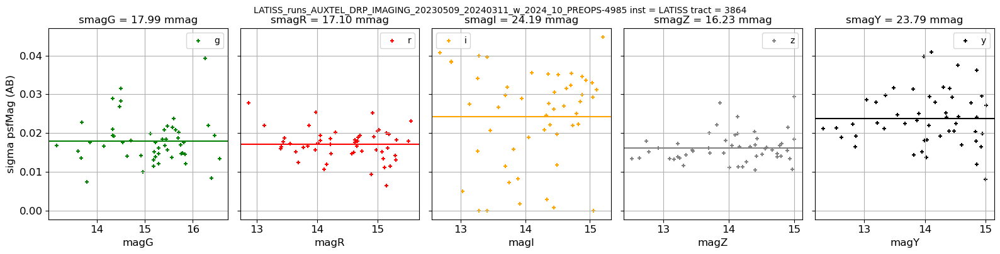

In [75]:
fig,axes = plt.subplots(1,5,figsize=(16,4),sharey=True)
axs= axes.flatten()
for idx,ax in enumerate(axs):
    f = Flist[idx]
    if idx==0:
           
            #isolatedStarSources_sel_g["psfMag"].hist(bins=100,facecolor="g",ax=ax, orientation="horizontal")
            df_obj_sed.plot.scatter( x="magG", y="smagG",marker= "+", color="g",ax=ax)
            ax.legend("g")
            ax.set_ylabel("sigma psfMag (AB)")
            ax.grid()
            ax.axhline(dict_photores[f]['sig'],color="g")
            ax.set_title(dict_photores[f]['title'])
   
    elif idx==1:
            df_obj_sed.plot.scatter( x="magR", y="smagR",marker= "+", color="r",ax=ax)
            ax.legend("r")
            ax.grid()
            ax.axhline(dict_photores[f]['sig'],color="r")
            ax.set_title(dict_photores[f]['title'])
    elif idx==2:
            df_obj_sed.plot.scatter( x="magI", y="smagI",marker= "+", color="orange",ax=ax)
            ax.legend("i")   
            ax.grid()
            ax.axhline(dict_photores[f]['sig'],color="orange")
            ax.set_title(dict_photores[f]['title'])
    elif idx==3:
            df_obj_sed.plot.scatter( x="magZ", y="smagZ",marker= "+", color="grey",ax=ax)
            ax.legend("z")
            ax.grid()
            ax.axhline(dict_photores[f]['sig'],color="grey")
            ax.set_title(dict_photores[f]['title'])
    elif idx==4:
            df_obj_sed.plot.scatter( x="magY", y="smagY",marker= "+", color="k",ax=ax)
            ax.legend("y")
            ax.grid()
            ax.axhline(dict_photores[f]['sig'],color="k")
            ax.set_title(dict_photores[f]['title'])
plt.tight_layout(h_pad=0)  

#    plt.suptitle(title,y=1.000)
#    plt.savefig(filename)
plt.suptitle(suptitle,y=1.0,fontsize=10)
plt.show()

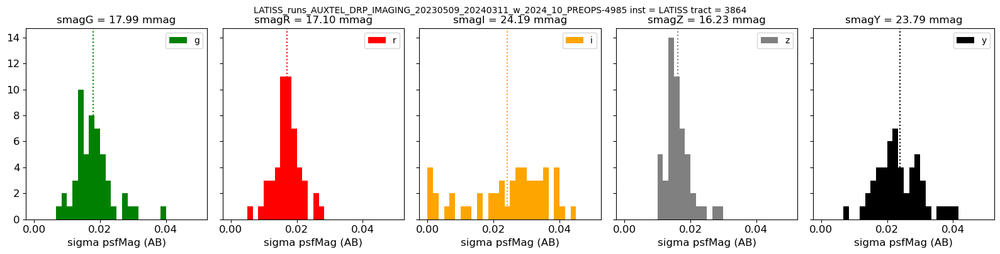

In [76]:
fig,axes = plt.subplots(1,5,figsize=(16,4),sharey=True)
axs= axes.flatten()
for idx,ax in enumerate(axs):
    f = Flist[idx]
    if idx==0:
           
            #isolatedStarSources_sel_g["psfMag"].hist(bins=100,facecolor="g",ax=ax, orientation="horizontal")
            df_obj_sed.hist("smagG",bins=30,range=(0,0.05), color="g",ax=ax)
            ax.legend("g")
            ax.set_xlabel("sigma psfMag (AB)")
            ax.grid()
            ax.axvline(dict_photores[f]['sig'],color="g",ls=":")
            ax.set_title(dict_photores[f]['title'])
   
    elif idx==1:
            df_obj_sed.hist("smagR",bins=30,range=(0,0.05), color="r",ax=ax)
            ax.legend("r")
            ax.grid()
            ax.set_xlabel("sigma psfMag (AB)")
            ax.axvline(dict_photores[f]['sig'],color="r",ls=":")
            ax.set_title(dict_photores[f]['title'])
    elif idx==2:
            df_obj_sed.hist("smagI",bins=30,range=(0,0.05), color="orange",ax=ax)
            ax.legend("i")   
            ax.grid()
            ax.axvline(dict_photores[f]['sig'],color="orange",ls=":")
            ax.set_title(dict_photores[f]['title'])
            ax.set_xlabel("sigma psfMag (AB)")
    elif idx==3:
            df_obj_sed.hist("smagZ",bins=30,range=(0,0.05), color="grey",ax=ax)
            ax.legend("z")
            ax.grid()
            ax.axvline(dict_photores[f]['sig'],color="grey",ls=":")
            ax.set_title(dict_photores[f]['title'])
            ax.set_xlabel("sigma psfMag (AB)")
    elif idx==4:
            df_obj_sed.hist("smagY",bins=30,range=(0,0.05), color="k",ax=ax)
            ax.legend("y")
            ax.grid()
            ax.axvline(dict_photores[f]['sig'],color="k",ls=":")
            ax.set_title(dict_photores[f]['title'])
            ax.set_xlabel("sigma psfMag (AB)")
plt.tight_layout(h_pad=0)  

#    plt.suptitle(title,y=1.000)
#    plt.savefig(filename)
plt.suptitle(suptitle,y=1.0,fontsize=10)
plt.show()

### Cut on selected light-curves

In [77]:
obj_ids_all = df_obj_sed.idx_obj.values.astype(int)

In [78]:
cut_goods = (df_obj_sed["smagG"]<0.02) & (df_obj_sed["smagR"]<0.02)	& (df_obj_sed["smagZ"]<0.02) & (df_obj_sed["smagY"]<0.02)
cut_bads = (df_obj_sed["smagG"]>0.03) | (df_obj_sed["smagR"] > 0.03)	| (df_obj_sed["smagZ"]>0.03) | (df_obj_sed["smagY"] > 0.03)

In [79]:
df_obj_sed_goods = df_obj_sed[cut_goods]
df_obj_sed_bads = df_obj_sed[cut_bads]

In [80]:
df_obj_sed_goods

,idx_obj,ra,dec,magG,magR,magI,magZ,magY,smagG,smagR,smagI,smagZ,smagY
0,60.0,122.458940,-36.203409,15.780329,15.291872,15.046134,14.975505,15.003724,0.014902,0.014185,0.029178,0.010582,0.008030
1,97.0,122.443239,-36.188544,16.450535,15.191326,14.513583,14.215112,14.036297,0.019326,0.019672,0.035140,0.011367,0.018223
3,106.0,122.558803,-36.184125,14.715377,13.651554,13.139435,12.924590,12.855124,0.018026,0.015232,0.027507,0.016101,0.016439
6,121.0,122.467499,-36.198182,15.854164,15.310193,15.031278,14.937808,14.946014,0.012057,0.013127,0.033002,0.013443,0.019950
14,187.0,122.423234,-36.188259,15.561455,15.148207,14.942067,14.894687,14.928930,0.013781,0.006397,0.033673,0.015529,0.016532
29,466.0,122.515905,-36.156007,14.543784,14.226814,14.053649,14.008037,14.021225,0.017656,0.017056,0.018968,0.011137,0.013772
34,534.0,122.441627,-36.246919,15.445620,14.986147,14.820994,14.780442,14.854383,0.018365,0.015663,0.022240,0.016750,0.012010
38,549.0,122.549266,-36.103293,14.147750,13.845025,13.693491,13.715632,13.815855,0.016568,0.016634,0.011451,0.014940,0.014450
42,602.0,122.458962,-36.086390,16.554822,15.174386,14.437080,14.139980,13.950803,0.013444,0.016114,0.000752,0.019941,0.015111
43,613.0,122.488426,-36.095863,14.630939,14.123056,13.917486,13.930609,13.991842,0.014019,0.010686,0.001699,0.014903,0.018104


In [81]:
obj_ids_goods = df_obj_sed_goods.idx_obj.values.astype(int)
obj_ids_goods 

array([ 60,  97, 106, 121, 187, 466, 534, 549, 602, 613, 768])

In [82]:
df_obj_sed_bads

,idx_obj,ra,dec,magG,magR,magI,magZ,magY,smagG,smagR,smagI,smagZ,smagY
11,158.0,122.513468,-36.199388,15.409874,14.668723,14.381427,14.270793,14.304246,0.020789,0.017911,0.022108,0.012637,0.031774
13,178.0,122.506622,-36.176345,15.746019,15.121694,14.875261,14.809761,14.859052,0.016938,0.011140,0.034528,0.017347,0.036224
15,190.0,122.506535,-36.145853,15.699754,15.078279,14.703844,14.516717,14.411858,0.018764,0.015236,0.032323,0.014488,0.031450
16,213.0,122.584367,-36.156101,15.579683,15.027077,14.710335,14.584604,14.548715,0.021477,0.020782,0.035467,0.016337,0.037450
33,514.0,122.553481,-36.250531,14.355772,13.872002,13.722815,13.708293,13.806939,0.019172,0.021969,0.031774,0.019967,0.031420
41,591.0,122.510524,-36.109432,16.253184,15.558467,15.199437,15.007459,14.934188,0.039313,0.023106,0.044756,0.029418,0.029563
44,617.0,122.611127,-36.182900,15.178910,14.609551,14.330255,14.136151,14.109984,0.013022,0.015103,0.002956,0.024242,0.040859
45,637.0,122.544167,-36.219339,13.678398,13.406496,13.259533,13.348292,13.484500,0.013529,0.016420,0.015352,0.014445,0.031659
47,647.0,122.614687,-36.183510,14.330532,13.978684,13.888599,13.868378,13.981320,0.028881,0.025305,0.008258,0.027790,0.039750
49,851.0,122.603450,-36.117018,14.505003,13.686935,13.281297,13.222162,13.219557,0.031570,0.012479,0.000000,0.017306,0.022594


In [83]:
obj_ids_bads = df_obj_sed_bads.idx_obj.values.astype(int)
obj_ids_bads 

array([158, 178, 190, 213, 514, 591, 617, 637, 647, 851])

In [84]:
def plot_light_curves_from_objects(list_of_objids,obj_cat,src_cat,title="PhotometricRepeatab",all_bands_name=["g","r","i","z","y"],
                                  all_bands_color=["g","r","orange","grey","k"]):
    """
    parameters :
        list_of_objids : list of integers
        obj_cat : df_obj_sed 
        src_cat : dataJoined
    """
    nrows = len(list_of_objids)
    
    fig,axes = plt.subplots(nrows,1,figsize=(16,3*nrows),sharex=True)
    axs= axes.flatten()

    for idx,obj_id  in enumerate(list_of_objids):
        ax = axs[idx]
        cut = src_cat["obj_index"] == obj_id
        ax.set_title(f" object = {obj_id}")
        sources = src_cat[cut]
        for ib,band in enumerate(all_bands_name):
            sources_inband = sources[sources["band"] == band].sort_values(by="expMidptMjd")
            sources_inband.plot(x='expMidptMjd',y='psfMag',marker="+",ls=":",color= all_bands_color[ib],legend=band,ax=ax,grid=True)
        
    
    plt.suptitle(title+suptitle,y=1.0,fontsize=10)
    plt.tight_layout()
    plt.show()

In [85]:
def plot_rel_light_curves_from_objects(list_of_objids,obj_cat,src_cat,title="PhotometricRepeatab",all_bands_name=["g","r","i","z","y"],
                                  all_bands_color=["g","r","orange","grey","k"]):
    """
    parameters :
        list_of_objids : list of integers
        obj_cat : df_obj_sed 
        src_cat : dataJoined
    """
    nrows = len(list_of_objids)
    
    fig,axes = plt.subplots(nrows,1,figsize=(16,3*nrows),sharex=True)
    axs= axes.flatten()

    for idx,obj_id  in enumerate(list_of_objids):
        ax = axs[idx]
        cut = src_cat["obj_index"] == obj_id
        ax.set_title(f" object = {obj_id}")
        sources = src_cat[cut]
        obj_cut = obj_cat.idx_obj ==  obj_id
        objectline =  obj_cat[obj_cut]
      
        for ib,band in enumerate(all_bands_name):
            tab_label = "mag"+band.upper()
            aver_mag =  objectline[tab_label].values
            N = len(aver_mag) 
          
            if N ==1:
                sources_inband = sources[sources["band"] == band].sort_values(by="expMidptMjd")
                sources_inband["psfMagRel"] =  sources_inband['psfMag'] -  aver_mag[0]
                #sources_inband["psfMagRel"] =  sources_inband['psfMag'] -  sources_inband['psfMag'].median()
                sources_inband.plot(x='expMidptMjd',y='psfMagRel',marker="+",ls=":",color= all_bands_color[ib],legend=band,ax=ax,grid=True)
        
    
    plt.suptitle(title+suptitle,y=1.0,fontsize=10)
    plt.tight_layout()
    plt.show()

In [86]:
def plot_photombias_vsquantity_from_objects(list_of_objids,obj_cat,src_cat,quantity,title="PhotometricBias vs",all_bands_name=["g","r","i","z","y"],
                                  all_bands_color=["g","r","orange","grey","k"]):
    """
    parameters :
        list_of_objids : list of integers
        obj_cat : df_obj_sed 
        src_cat : dataJoined
    """
    nrows = len(list_of_objids)
    
    fig,ax = plt.subplots(1,1,figsize=(10,6),sharex=True)
    

    for idx,obj_id  in enumerate(list_of_objids):
        cut = src_cat["obj_index"] == obj_id
      
        sources = src_cat[cut]
        obj_cut = obj_cat.idx_obj ==  obj_id
        objectline =  obj_cat[obj_cut]
      
        for ib,band in enumerate(all_bands_name):
            tab_label = "mag"+band.upper()
            aver_mag =  objectline[tab_label].values
            N = len(aver_mag) 
          
            if N ==1:
                sources_inband = sources[sources["band"] == band].sort_values(by=quantity)
                sources_inband["psfMagRel"] =  sources_inband['psfMag'] -  aver_mag[0]
                #sources_inband["psfMagRel"] =  sources_inband['psfMag'] -  sources_inband['psfMag'].median()
                sources_inband.plot.scatter(x=quantity,y='psfMagRel',marker="+",color= all_bands_color[ib],ax=ax,grid=True)
        
    
    plt.suptitle(title + quantity + " "+suptitle,y=1.0,fontsize=10)
    plt.tight_layout()
    plt.show()

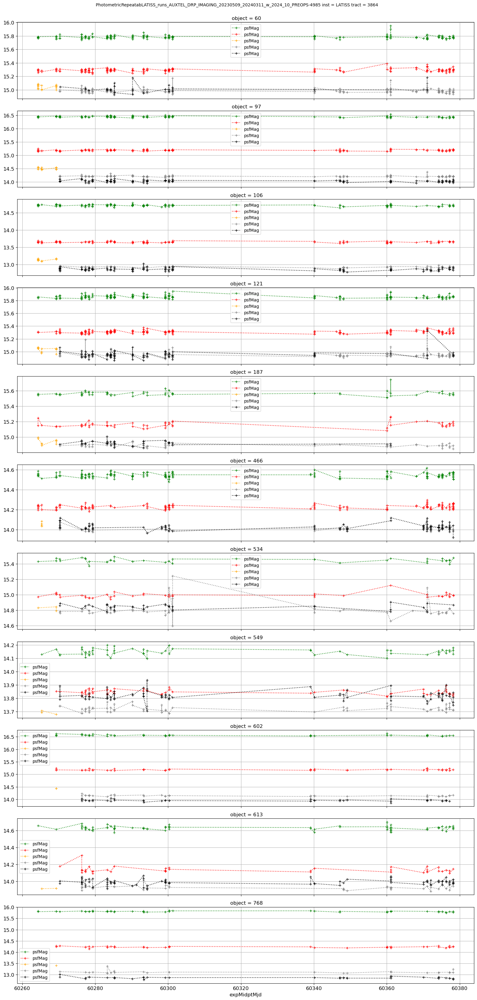

In [87]:
plot_light_curves_from_objects(obj_ids_goods, df_obj_sed ,dataJoined)

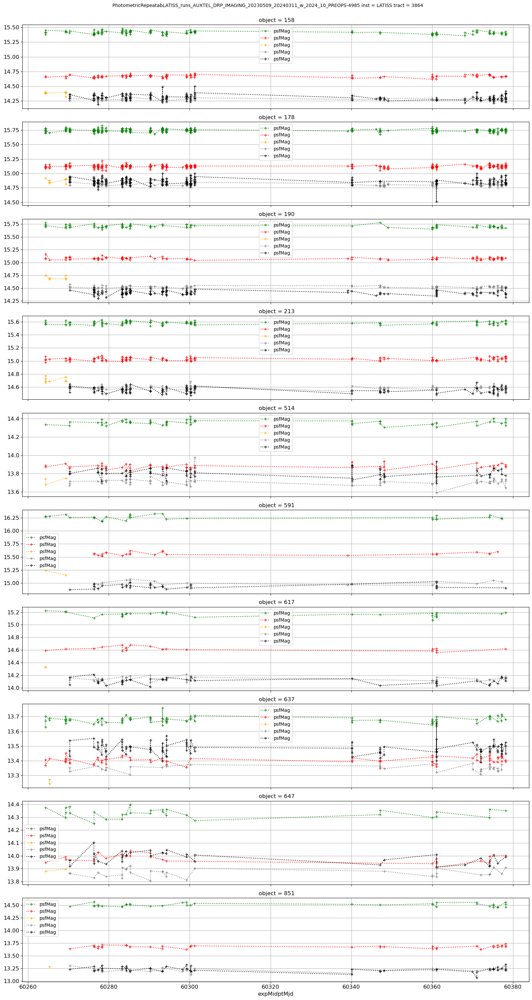

In [88]:
plot_light_curves_from_objects(obj_ids_bads, df_obj_sed ,dataJoined)

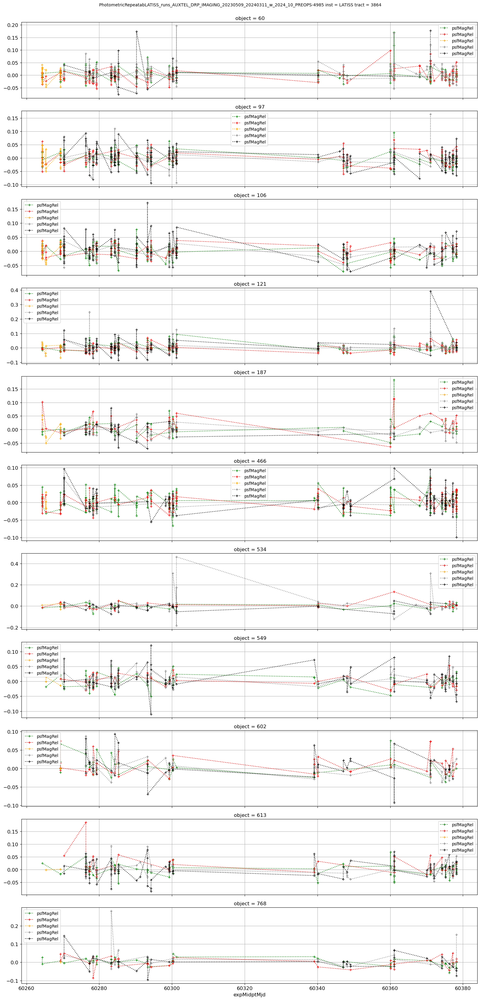

In [89]:
plot_rel_light_curves_from_objects(obj_ids_goods, df_obj_sed ,dataJoined)

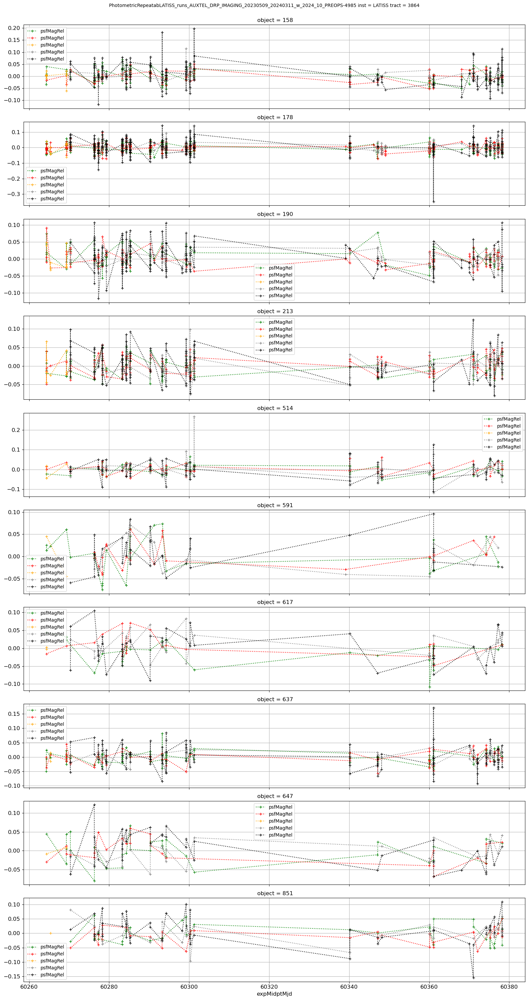

In [90]:
plot_rel_light_curves_from_objects(obj_ids_bads, df_obj_sed ,dataJoined)

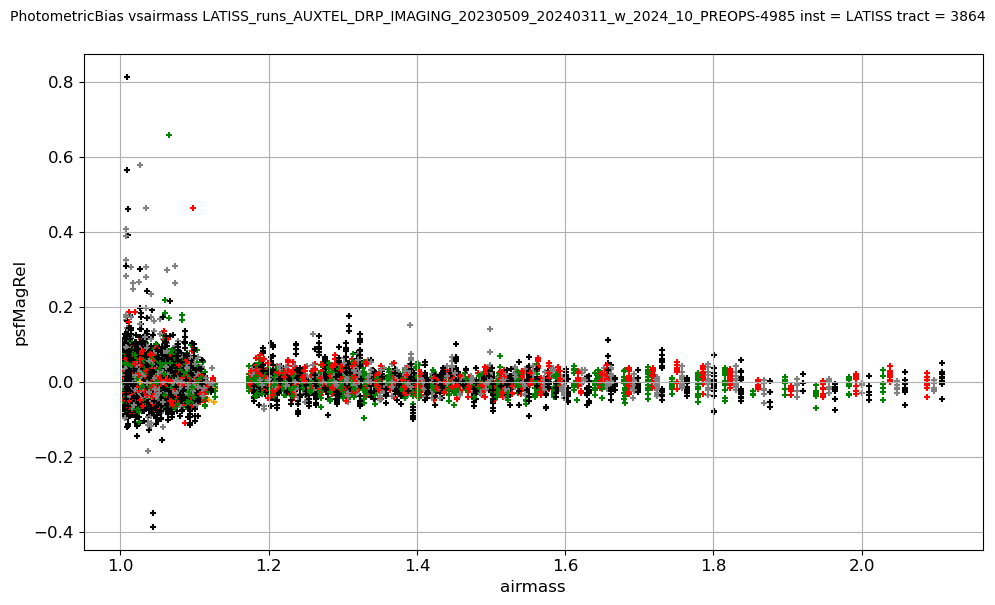

In [91]:
plot_photombias_vsquantity_from_objects(obj_ids_all, df_obj_sed ,dataJoined,"airmass")

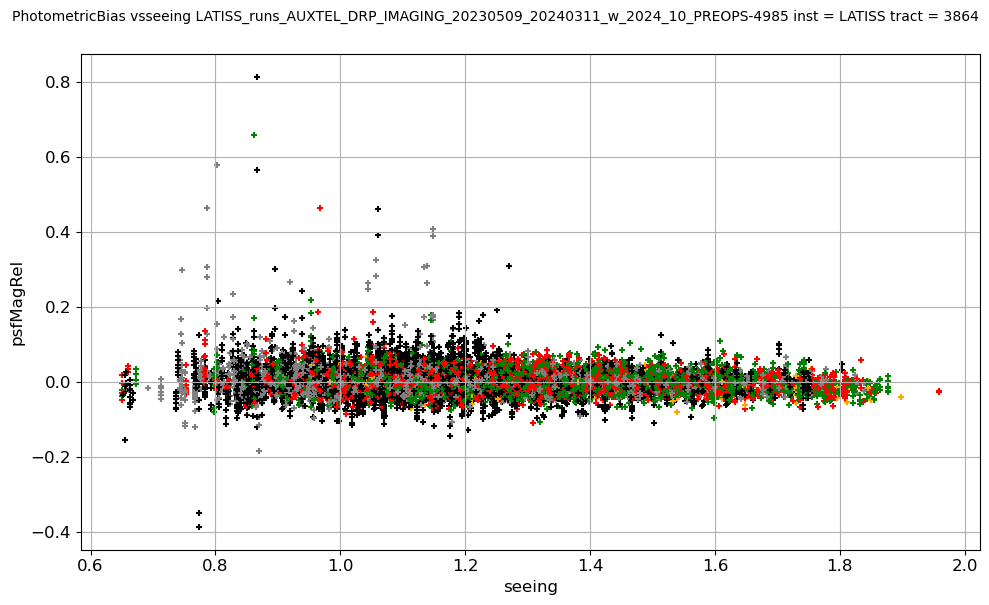

In [92]:
plot_photombias_vsquantity_from_objects(obj_ids_all, df_obj_sed ,dataJoined,"seeing")

## Find the list of visits associated with an object

In [93]:
obj_index_sel  = obj_ids_goods[0]  

In [94]:
cut = dataJoined["obj_index"] == obj_index_sel 

In [95]:
dataJoined_sel = dataJoined[cut]

In [96]:
dataJoined_sel

,sourceId,psfFlux,psfFluxErr,psfFlux_flag,psfFlux_apCorr,psfFlux_apCorrErr,extendedness,detect_isPrimary,deblend_skipped,gaussianFlux,gaussianFluxErr,gaussianFlux_flag,localPhotoCalib,localPhotoCalibErr,localPhotoCalib_flag,index,visit,detector,ra,dec,physical_filter,band,apFlux_35_0_instFlux,apFlux_35_0_instFluxErr,x,y,apFlux_50_0_instFlux,apFlux_50_0_instFluxErr,apFlux_50_0_flag,localBackground_instFlux,localBackground_flag,source_row,obj_index,psfSn,psfMag,psfMagErr,apFlux_35_0_calFlux,apFlux_35_0_calFluxErr,psfInstMag,psfGausFluxRatio,psfSigma,skyBg,expTime,expMidptMjd,nSource,medianE,psfStarScaledDeltaSizeScatter,astromOffsetStd,psfTraceRadiusDelta,zeroPoint,airmass,seeing,psfMagDiffMmag,psfMagDiffChi,raDiffMas,decDiffMas,raCosDecDiffMas
498,178737290963583258,2.844424e+06,16190.709373,False,1.002543,0.0,0.0,True,False,2.848619e+06,19382.881193,False,41.645972,0.067769,False,281,2023112900634,0,122.458938,-36.203402,SDSSr_65mm~empty,r,69459.869783,617.569221,2380.237723,2116.265887,72075.830093,845.081389,False,0.352750,False,281,60,175.682507,15.265014,0.006180,2.900080e+06,25784.672043,19.313947,0.998528,5.127601,11.397071,30.0,60278.334920,628,0.010437,0.015208,0.012242,0.856765,27.354448,1.007202,1.155509,-60.138944,-3.959798,-9.195184,27.898818,27.524937
515,178737292037325181,3.809116e+06,23906.797774,False,1.008626,0.0,0.0,True,False,3.820553e+06,29141.500939,False,67.862129,0.130985,False,380,2023112900635,0,122.458931,-36.203406,SDSSz_65mm~empty,z,56125.974863,613.347312,2383.285002,2110.487593,57030.321286,844.669879,False,0.184461,False,380,60,159.331906,14.947940,0.006814,3.841683e+06,41982.089690,19.527008,0.997006,4.443651,12.139689,30.0,60278.335461,847,0.011801,0.016387,0.010984,0.794446,26.823795,1.007041,1.001460,-377.213349,-24.405137,-32.765002,13.152749,-10.109741
566,179300079855730926,1.816476e+06,10452.694793,False,1.004353,0.0,0.0,True,False,1.807466e+06,12230.117345,False,22.951938,0.066856,False,237,2023121500484,0,122.458938,-36.203409,SDSSg_65mm~empty,g,80047.217740,600.286968,2174.069873,2550.197955,83622.050343,813.039061,False,0.398064,False,237,60,173.780667,15.751926,0.006248,1.845236e+06,13837.725228,19.153974,1.004985,5.842201,3.049858,30.0,60294.239799,439,0.005425,0.017762,0.009183,0.976577,27.995754,1.062127,1.316707,426.772730,28.049426,-9.162931,0.888596,-6.547036
583,179300080929472889,2.727317e+06,14026.764055,False,0.969584,0.0,0.0,True,False,2.716403e+06,15901.250325,False,27.286749,0.082675,False,376,2023121500485,0,122.458938,-36.203409,SDSSr_65mm~empty,r,104387.924563,626.890504,2173.848051,2550.820063,106854.905980,838.206922,False,0.510548,False,376,60,194.436682,15.310661,0.005584,2.761770e+06,16585.512290,18.900540,1.004018,5.083352,4.738638,30.0,60294.240341,684,0.003256,0.011959,0.008971,0.578688,27.808489,1.061107,1.145577,-14.492184,-0.969070,-9.197796,2.530787,-4.502049
808,182043970178646101,2.835165e+06,15608.108577,False,1.077241,0.0,0.0,True,False,2.831654e+06,17706.705414,False,29.392744,0.064810,False,84,2024030200027,0,122.458946,-36.203411,SDSSr_65mm~empty,r,96187.185918,665.045564,441.694417,948.052067,100666.023994,902.938373,False,0.064063,False,84,60,181.646923,15.268554,0.005977,3.045583e+06,21057.392288,18.939155,1.001240,7.764701,4.499110,30.0,60372.045769,416,0.005595,0.007630,0.010735,4.905511,27.715034,1.032520,1.749629,-56.598757,-3.746788,18.264974,-7.228918,5.337591
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
46563,178737231907782792,3.695780e+06,18465.926839,False,1.004728,0.0,0.0,True,False,3.732030e+06,22148.759741,False,41.618174,0.081071,False,135,2023112900579,0,122.458940,-36.203412,SDSSz_65mm~empty,z,89753.853486,709.474555,1167.769123,684.158499,91259.924135,969.901900,False,0.062063,False,135,60,200.140484,14.980735,0.005425,3.753053e+06,29666.646953,

In [97]:
ra = dataJoined_sel["ra"].values
dec = dataJoined_sel["dec"].values

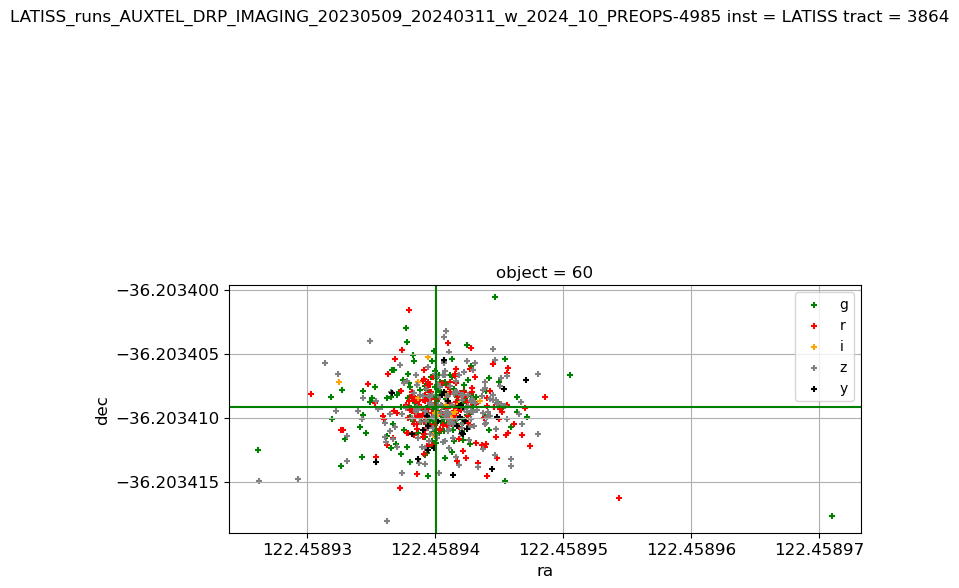

In [98]:
fig,ax=plt.subplots(1,1,figsize=(8,8))
ax.set_title(f"object = {obj_index_sel}")
dataJoined_sel[dataJoined_sel.band=="g"].plot.scatter(x="ra",y="dec",marker="+",color="g",ax=ax,grid=True,label="g")
dataJoined_sel[dataJoined_sel.band=="r"].plot.scatter(x="ra",y="dec",marker="+",color="r",ax=ax,grid=True,label="r")
dataJoined_sel[dataJoined_sel.band=="i"].plot.scatter(x="ra",y="dec",marker="+",color="orange",ax=ax,grid=True,label="i")
dataJoined_sel[dataJoined_sel.band=="z"].plot.scatter(x="ra",y="dec",marker="+",color="grey",ax=ax,grid=True,label="z")
dataJoined_sel[dataJoined_sel.band=="y"].plot.scatter(x="ra",y="dec",marker="+",color="k",ax=ax,grid=True,label="y")

ra_g = dataJoined_sel[dataJoined_sel.band=="g"]["ra"].mean()
dec_g = dataJoined_sel[dataJoined_sel.band=="g"]["dec"].mean()
ax.axvline(ra_g,color="g")
ax.axhline(dec_g,color="g")

plt.gca().ticklabel_format(axis='both', style='plain', useOffset=False)
plt.gca().set_aspect('equal')
plt.suptitle(suptitle)
plt.tight_layout()

In [99]:
dataJoined_sel[["visit","band"]]

,visit,band
498,2023112900634,r
515,2023112900635,z
566,2023121500484,g
583,2023121500485,r
808,2024030200027,r
...,...,...
46563,2023112900579,z
46603,2023112900581,g
46619,2023112900582,r
46639,2023112900583,z


In [100]:
visit_id_band = dataJoined_sel[["visit","band"]].iloc[0]
visit_id = visit_id_band['visit']
band = visit_id_band['band']

In [101]:
visit_id

2023112900634

In [102]:
dataId = {'visit': visit_id, 'instrument':instrument , 'detector': 0}

In [103]:
img = butler.get("calexp", dataId=dataId, collections=collection)
bkgd = butler.get('calexpBackground', **dataId,collections=collection)

wcs = img.getWcs()
bbox = img.getBBox()
corners_ra, corners_dec = get_corners_radec(wcs, bbox)
extent = [np.min(corners_ra),np.max(corners_ra),np.min(corners_dec),np.max(corners_dec)]


In [108]:
all_id_obj = df_obj_sed.idx_obj.values.astype(int)
all_ra_obj = df_obj_sed["ra"].values 
all_dec_obj = df_obj_sed["dec"].values 

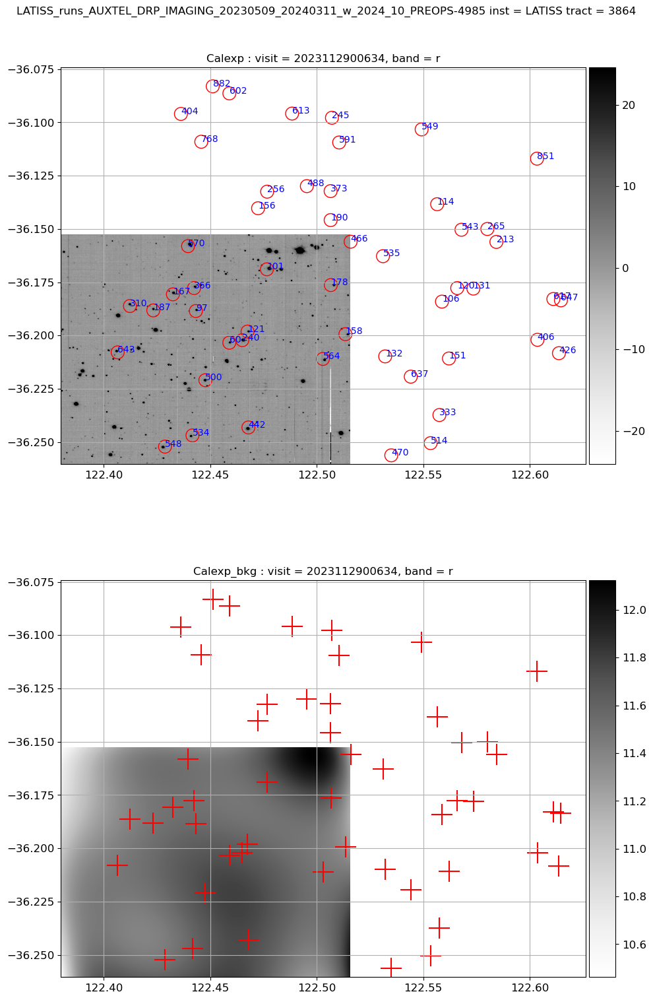

In [113]:
#%matplotlib widget

# Display the image with a suitable scaling
med = np.median(img.image.array.flatten())
sigMad = 1.4826 * np.median(np.fabs(img.image.array.flatten() - med))
vmin = med - 3 * sigMad
vmax = med + 3 * sigMad

fig,axs = plt.subplots(2,1,figsize=(10,16))
ax = axs[0]
im=ax.imshow(img.image.array, origin="lower",vmin=vmin, vmax=vmax, cmap="Greys",extent=extent)
divider = make_axes_locatable(ax)
cax = divider.append_axes("right", size="5%", pad=0.05)
the_title = f"Calexp : visit = {visit_id}, band = {band}"
ax.set_title(the_title)
ax.grid()
ax.set_aspect('equal')
ax.scatter(all_ra_obj,all_dec_obj,marker="o",color="y",s=200,facecolors='none', edgecolors='r')

for x, y, txt in np.broadcast(all_ra_obj, all_dec_obj, all_id_obj):
    ax.annotate(str(txt), (x, y),color="b")

plt.colorbar(im, cax=cax,ax=ax)


ax2 = axs[1]
im2=ax2.imshow(bkgd.getImage().array, origin="lower", cmap="Greys",extent=extent)
divider = make_axes_locatable(ax2)
cax2 = divider.append_axes("right", size="5%", pad=0.05)
the_title2 = f"Calexp_bkg : visit = {visit_id}, band = {band}"
ax2.set_title(the_title2)
ax2.grid()
ax2.set_aspect('equal')
plt.colorbar(im2, cax=cax2,ax=ax2)
ax2.scatter(all_ra_obj,all_dec_obj,marker="+",color="r",s=500)

plt.suptitle(suptitle)
plt.tight_layout()
plt.show()

In [ ]:
#diagramme magnitude Z vs couleur (Z-Y) et voir l’étalement de
#la séquence principale, et peut-être la branche des géantes rouges.

In [114]:
Nobj = len(df_obj_sed)
import seaborn as sns
from matplotlib.colors import ListedColormap
color_palette = sns.color_palette("hls", Nobj)

In [115]:
color_palette

[(0.86, 0.3712, 0.33999999999999997),
 (0.86, 0.43237647058823525, 0.33999999999999997),
 (0.86, 0.4935529411764705, 0.33999999999999997),
 (0.86, 0.5547294117647059, 0.33999999999999997),
 (0.86, 0.6159058823529411, 0.33999999999999997),
 (0.86, 0.6770823529411765, 0.33999999999999997),
 (0.86, 0.7382588235294117, 0.33999999999999997),
 (0.86, 0.7994352941176471, 0.33999999999999997),
 (0.8593882352941175, 0.86, 0.33999999999999997),
 (0.7982117647058823, 0.86, 0.33999999999999997),
 (0.7370352941176468, 0.86, 0.33999999999999997),
 (0.6758588235294114, 0.86, 0.33999999999999997),
 (0.6146823529411763, 0.86, 0.33999999999999997),
 (0.5535058823529413, 0.86, 0.33999999999999997),
 (0.4923294117647055, 0.86, 0.33999999999999997),
 (0.4311529411764704, 0.86, 0.33999999999999997),
 (0.36997647058823535, 0.86, 0.33999999999999997),
 (0.33999999999999997, 0.86, 0.3712),
 (0.33999999999999997, 0.86, 0.43237647058823525),
 (0.33999999999999997, 0.86, 0.49355294117647064),
 (0.33999999999999997, 0.86, 0.5547294117647059),
 (0.33999999999999997, 0.86, 0.6159058823529412),
 (0.33999999999999997, 0.86, 0.6770823529411767),
 (0.33999999999999997, 0.86, 0.7382588235294119),
 (0.33999999999999997, 0.86, 0.7994352941176471),
 (0.33999999999999997, 0.8593882352941177, 0.86),
 (0.33999999999999997, 0.7982117647058823, 0.86),
 (0.33999999999999997, 0.7370352941176468, 0.86),
 (0.33999999999999997, 0.6758588235294114, 0.86),
 (0.33999999999999997, 0.6146823529411763, 0.86),
 (0.33999999999999997, 0.553505882352941, 0.86),
 (0.33999999999999997, 0.49232941176470585, 0.86),
 (0.33999999999999997, 0.4311529411764704, 0.86),
 (0.33999999999999997, 0.369976470588235, 0.86),
 (0.3712, 0.33999999999999997, 0.86),
 (0.4323764705882351, 0.33999999999999997, 0.86),
 (0.49355294117647014, 0.33999999999999997, 0.86),
 (0.5547294117647059, 0.33999999999999997, 0.86),
 (0.6159058823529411, 0.33999999999999997, 0.86),
 (0.677082352941176, 0.33999999999999997, 0.86),
 (0.7382588235294119, 0.33999999999999997, 0.86),
 (0.799435294117647, 0.33999999999999997, 0.86),
 (0.86, 0.33999999999999997, 0.8593882352941175),
 (0.86, 0.33999999999999997, 0.7982117647058823),
 (0.86, 0.33999999999999997, 0.7370352941176466),
 (0.86, 0.33999999999999997, 0.6758588235294114),
 (0.86, 0.33999999999999997, 0.6146823529411763),
 (0.86, 0.33999999999999997, 0.5535058823529413),
 (0.86, 0.33999999999999997, 0.4923294117647055),
 (0.86, 0.33999999999999997, 0.4311529411764704),
 (0.86, 0.33999999999999997, 0.36997647058823535)]

In [116]:
mpl_colors = ListedColormap(sns.color_palette(color_palette).as_hex())

In [117]:
mpl_colors.colors

['#db5f57',
 '#db6e57',
 '#db7e57',
 '#db8d57',
 '#db9d57',
 '#dbad57',
 '#dbbc57',
 '#dbcc57',
 '#dbdb57',
 '#ccdb57',
 '#bcdb57',
 '#acdb57',
 '#9ddb57',
 '#8ddb57',
 '#7edb57',
 '#6edb57',
 '#5edb57',
 '#57db5f',
 '#57db6e',
 '#57db7e',
 '#57db8d',
 '#57db9d',
 '#57dbad',
 '#57dbbc',
 '#57dbcc',
 '#57dbdb',
 '#57ccdb',
 '#57bcdb',
 '#57acdb',
 '#579ddb',
 '#578ddb',
 '#577edb',
 '#576edb',
 '#575edb',
 '#5f57db',
 '#6e57db',
 '#7e57db',
 '#8d57db',
 '#9d57db',
 '#ad57db',
 '#bc57db',
 '#cc57db',
 '#db57db',
 '#db57cc',
 '#db57bc',
 '#db57ac',
 '#db579d',
 '#db578d',
 '#db577e',
 '#db576e',
 '#db575e']

In [118]:
df_obj_sed["Z-Y"] = df_obj_sed["magZ"] - df_obj_sed["magY"] 
df_obj_sed["G-R"] = df_obj_sed["magG"] - df_obj_sed["magR"] 

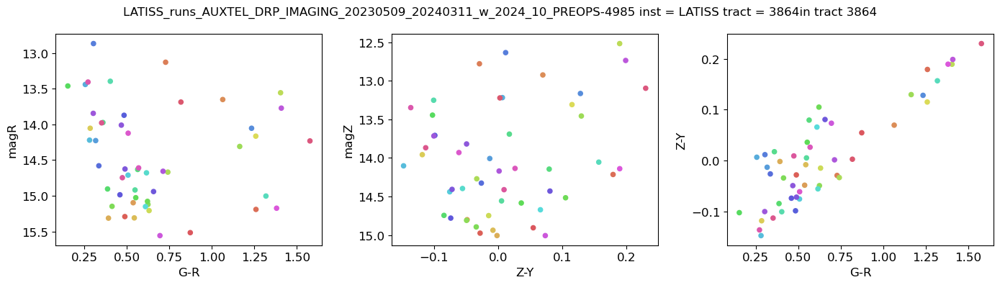

In [122]:
fig,axs = plt.subplots(1,3,figsize=(14,4))

ax=axs[0]
df_obj_sed.plot.scatter(y="magR",x="G-R",ax=ax,color=mpl_colors.colors)
ax.invert_yaxis()


ax=axs[1]
df_obj_sed.plot.scatter(y="magZ",x="Z-Y",ax=ax,color=mpl_colors.colors)
ax.invert_yaxis()


ax=axs[2]
df_obj_sed.plot.scatter(y="Z-Y",x="G-R",ax=ax,color=mpl_colors.colors)
#ax.invert_yaxis()

plt.suptitle(suptitle + f"in tract {tract}")
plt.tight_layout()

In [ ]:
df_obj_sed.to_csv(f"isolated_source_objects_tract{tract}.csv")

In [ ]:
assert False

In [ ]:
count_source_visit.hist(x="obj_index")

In [ ]:
count_sources = dataJoined.groupby(by="obj_index").count()["psfFlux"]

In [ ]:
count_source.hist(bins=100,range=(0,100))

In [ ]:
assert False

## Plot the per object source 

In [ ]:
fig, ax = plt.subplots(1, 1, figsize=(8,6))
ax.set_title("{}\n{} {} (max visit: {})".format(collection, tract, band, max(dataJoined["visit"])), fontsize=8)
nBins = 16 if len(dataJoined) < 4000 else 100
histData = psfMagStdMmagAll
xLabelStr = "std(psfFlux - psfFluxMean) ({} mmag)".format(band)
medianPsfFluxStd = np.median(histData)
n, bins, patches = ax.hist(histData, bins=nBins, density=True, histtype="step", lw=2, label="data (N = {})".format(len(histData)))
ax.axvline(x=medianPsfFluxStd, color="gray", linestyle='--', linewidth=1, label="median: {:.2f}".format(medianPsfFluxStd))

ax.tick_params(labelsize=7)
ax.set_xlabel(xLabelStr, fontsize=9)
ax.set_ylabel("Normalized (PDF)".format(band), fontsize=9)

ax.legend(fontsize=8)
if doSaveFigs:
    filename = "{}psfFluxStdHist_{}_{}_{}".format(saveDir, tract, band, collectionStr)
    print("Saving file in: {}".format(filename))
    fig.savefig(filename, dpi=150)

In [ ]:
fig, ax = plt.subplots(1, 1, figsize=(8,6))
ax.set_title("{}\n{} {} (max visit: {})".format(collection, tract, band, max(dataJoined["visit"])), fontsize=8)

medianRaStd = np.median(raStdMasAll)
n, bins, patches = ax.hist(raStdMasAll, bins=nBins, density=True, histtype="step", color="tab:blue", lw=2, label="RA (N = {})".format(len(raStdMasAll)))

medianDecStd = np.median(decStdMasAll)
n, bins, patches = ax.hist(decStdMasAll, bins=nBins, density=True, histtype="step", color="tab:orange", lw=2, label="Dec (N = {})".format(len(decStdMasAll)))

medianRaCosDecStd = np.median(raCosDecStdMasAll)
n, bins, patches = ax.hist(raCosDecStdMasAll, bins=nBins, density=True, histtype="step", color="tab:green", lw=2, label="RA*cos(Dec) (N = {})".format(len(raCosDecStdMasAll)))

ax.axvline(x=medianRaStd, linestyle='--', color="tab:blue", linewidth=1, label="median: {:.2f} (mas)".format(medianRaStd))
ax.axvline(x=medianDecStd, linestyle='--', color="tab:orange", linewidth=1, label="median: {:.2f} (mas)".format(medianDecStd))
ax.axvline(x=medianRaCosDecStd, linestyle='--', color="tab:green", linewidth=1, label="median: {:.2f} (mas)".format(medianRaCosDecStd))


ax.tick_params(labelsize=7)
ax.set_xlabel("std(value - valueMean) ({} mas)".format(band), fontsize=9)
ax.set_ylabel("Normalized (PDF)".format(band), fontsize=9)

# ax.set_xlim(0, 400)
ax.legend(fontsize=8)
if doSaveFigs:
    filename = "{}RaDecStdHist_{}_{}_{}".format(saveDir, tract, band, collectionStr)
    print("Saving file in: {}".format(filename))
    fig.savefig(filename, dpi=150)

In [ ]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10,4))
# ax.set_title("{} {} {}".format(collection, tract, band), fontsize=8)
fig.suptitle("{}\n{} {} (max visit: {})".format(collection, tract, band, max(dataJoined["visit"])),
             fontsize=10, y=0.98)
ax1.axvline(x=0.0, color="gray", linestyle='--', linewidth=1)

n, bins, patches = ax1.hist(dataJoined["psfMagDiffMmag"], bins=2*nBins, density=True, histtype="step", lw=2, label="data")

# Gaussian fit of all data
(mu, sigma) = scipy.stats.norm.fit(dataJoined["psfMagDiffMmag"])
yFit = scipy.stats.norm.pdf(bins, mu, sigma)
ax1.plot(bins, yFit, "--", lw=1, fillstyle="full",
        label="Gaussian fit all\n(N={}) \n$\mu$={:.2f} (mmag)\n$\sigma$={:.2f}(mmag)".format(len(dataJoined), mu, sigma))
ax1.fill_between(bins, yFit, alpha=0.2)

# Gassian fit of 3-sigma clipped data
clippedDiffArray = scipy.stats.sigmaclip(dataJoined["psfMagDiffMmag"], low=3.0, high=3.0).clipped

(muClipped, sigmaClipped) = scipy.stats.norm.fit(clippedDiffArray)
yFitClipped = scipy.stats.norm.pdf(bins, muClipped, sigmaClipped)
ax1.plot(bins, yFitClipped, "--", lw=1, fillstyle="full",
        label="3-$\sigma$-clipped\n(N={}) \n$\mu$={:.2f} (mmag) \n$\sigma$={:.2f}(mmag)".format(len(clippedDiffArray), muClipped, sigmaClipped))
ax1.fill_between(bins, yFitClipped, alpha=0.2)

ax1.tick_params(labelsize=7)
ax1.set_xlabel("psfFlux - psfFluxMean ({} mmag)".format(band), fontsize=9)
ax1.set_ylabel("Normalized (PDF)".format(band), fontsize=9)

ax1.set_xlim(-400, 400)
ax1.legend(fontsize=8)

# Plot chi histogram
ax2.axvline(x=0.0, color="gray", linestyle='--', linewidth=1)
n, bins, patches = ax2.hist(dataJoined["psfMagDiffChi"], bins=2*nBins, density=True, histtype="step", lw=2, label="data")

# Gaussian fit of all data
(mu, sigma) = scipy.stats.norm.fit(dataJoined["psfMagDiffChi"])
yFit = scipy.stats.norm.pdf(bins, mu, sigma)
ax2.plot(bins, yFit, "--", lw=1, fillstyle="full",
        label="Gaussian fit all\n(N={}) \n$\mu$={:.2f}\n$\sigma$={:.2f}".format(len(dataJoined), mu, sigma))
ax2.fill_between(bins, yFit, alpha=0.2)

# Gassian fit of 3-sigma clipped data
clippedDiffArray = scipy.stats.sigmaclip(dataJoined["psfMagDiffChi"], low=3.0, high=3.0).clipped
(muClipped, sigmaClipped) = scipy.stats.norm.fit(clippedDiffArray)
yFitClipped = scipy.stats.norm.pdf(bins, muClipped, sigmaClipped)
ax2.plot(bins, yFitClipped, "--", lw=1, fillstyle="full",
        label="3-$\sigma$-clipped\n(N={}) \n$\mu$={:.2f}\n$\sigma$={:.2f}".format(len(clippedDiffArray), muClipped, sigmaClipped))
ax2.fill_between(bins, yFitClipped, alpha=0.2)

ax2.tick_params(labelsize=7)
ax2.set_xlabel("$\chi$ = (psfMagDiff)/(psfMagErr$^2$ + psfMagMeanErr$^2$)$^{1/2}$", fontsize=9)
ax2.set_ylabel("Normalized (PDF)".format(band), fontsize=9)

ax2.set_xlim(-20, 20)
ax2.legend(fontsize=8)

if doSaveFigs:
    filename = "{}psfFluxDiffHist_{}_{}_{}{}".format(saveDir, tract, band, collectionStr, maxVisitStr)
    print("Saving file in: {}".format(filename))
    fig.savefig(filename, dpi=150)

In [ ]:
dataJoined.columns

In [ ]:
Band_To_Cmap_Dict = {"g":plt.cm.Greens,"r":plt.cm.Reds,"i":plt.cm.Oranges,"z":plt.cm.Purples,"y":plt.cm.Greys}

In [ ]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10,4))
# ax.set_title("{} {} {}".format(collection, tract, band), fontsize=8)
fig.suptitle("{}\n{} {} (max visit: {})".format(collection, tract, band, max(dataJoined["visit"])),
             fontsize=10, y=0.98)
ax1.axvline(x=0.0, color="gray", linestyle='--', linewidth=1)

#n, bins, patches = ax1.hist(dataJoined["psfMagDiffMmag"], bins=2*nBins, density=True, histtype="step", lw=2, label="data")
ax1.hist2d(dataJoined["psfMag"],dataJoined["psfMagDiffMmag"], bins=max(2*nBins,100), cmap=Band_To_Cmap_Dict[band], label="data")
ax1.tick_params(labelsize=7)
ax1.set_ylabel("psfFlux - psfFluxMean ({} mmag)".format(band), fontsize=9)
ax1.set_xlabel("psfMag ({})mag ".format(band), fontsize=9)

ax1.set_ylim(-100, 100)
ax1.legend(fontsize=8)
ax1.grid()

# Plot chi histogram
ax2.axvline(x=0.0, color="gray", linestyle='--', linewidth=1)
ax2.hist2d(dataJoined["psfMag"],dataJoined["psfMagDiffChi"], bins=max(2*nBins,100),cmap=Band_To_Cmap_Dict[band], lw=2, label="data")


ax2.tick_params(labelsize=7)
ax2.set_ylabel("$\chi$ = (psfMagDiff)/(psfMagErr$^2$ + psfMagMeanErr$^2$)$^{1/2}$", fontsize=9)
ax2.set_xlabel("psfMag ({})mag ".format(band), fontsize=9)

ax2.set_ylim(-10, 10)
ax2.legend(fontsize=8)
ax2.grid()
if doSaveFigs:
    filename = "{}psfFluxDiffHist2D_{}_{}_{}{}".format(saveDir, tract, band, collectionStr, maxVisitStr)
    print("Saving file in: {}".format(filename))
    fig.savefig(filename, dpi=150)

In [ ]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10,4))
# ax.set_title("{} {} {}".format(collection, tract, band), fontsize=8)
fig.suptitle("{}\n{} {} (max visit: {})".format(collection, tract, band, max(dataJoined["visit"])),
             fontsize=10, y=0.98)
ax1.axvline(x=0.0, color="gray", linestyle='--', linewidth=1)

#n, bins, patches = ax1.hist(dataJoined["psfMagDiffMmag"], bins=2*nBins, density=True, histtype="step", lw=2, label="data")
ax1.hist2d(dataJoined["PWV"],dataJoined["psfMagDiffMmag"], bins=max(2*nBins,50), cmap=Band_To_Cmap_Dict[band], label="data")
ax1.tick_params(labelsize=7)
ax1.set_ylabel("psfFlux - psfFluxMean ({} mmag)".format(band), fontsize=9)
ax1.set_xlabel("PWV ", fontsize=9)

ax1.set_ylim(-100, 100)
ax1.set_xlim(1, 5.)
ax1.grid()
ax1.legend(fontsize=8)

# Plot chi histogram
ax2.axvline(x=0.0, color="gray", linestyle='--', linewidth=1)
ax2.hist2d(dataJoined["PWV"],dataJoined["psfMagDiffChi"], bins=max(2*nBins,50),cmap=Band_To_Cmap_Dict[band], lw=2, label="data")


ax2.tick_params(labelsize=7)
ax2.set_ylabel("$\chi$ = (psfMagDiff)/(psfMagErr$^2$ + psfMagMeanErr$^2$)$^{1/2}$", fontsize=9)
ax2.set_xlabel("PWV mm", fontsize=9)

ax2.set_ylim(-10, 10)
ax2.set_xlim(1, 5.)
ax2.grid()
ax2.legend(fontsize=8)

if doSaveFigs:
    filename = "{}psfFluxDiffHist2DPWV_{}_{}_{}{}".format(saveDir, tract, band, collectionStr, maxVisitStr)
    print("Saving file in: {}".format(filename))
    fig.savefig(filename, dpi=150)

In [ ]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10,4))
# ax.set_title("{} {} {}".format(collection, tract, band), fontsize=8)
fig.suptitle("{}\n{} {} (max visit: {})".format(collection, tract, band, max(dataJoined["visit"])),
             fontsize=10, y=0.98)
ax1.axvline(x=0.0, color="gray", linestyle='--', linewidth=1)

#n, bins, patches = ax1.hist(dataJoined["psfMagDiffMmag"], bins=2*nBins, density=True, histtype="step", lw=2, label="data")
ax1.hist2d(dataJoined["PWV"],dataJoined["psfMagDiffMmag"], bins=max(2*nBins,50), cmap=plt.cm.Reds, label="data")
ax1.tick_params(labelsize=7)
ax1.set_ylabel("psfFlux - psfFluxMean ({} mmag)".format(band), fontsize=9)
ax1.set_xlabel("PWV ", fontsize=9)

ax1.set_ylim(-100, 100)
ax1.set_xlim(1, 5.)
ax1.grid()
ax1.legend(fontsize=8)

# Plot chi histogram
ax2.axvline(x=0.0, color="gray", linestyle='--', linewidth=1)
ax2.hist2d(dataJoined["PWV"],dataJoined["psfMagDiffChi"], bins=max(2*nBins,50),cmap=plt.cm.Reds, lw=2, label="data")


ax2.tick_params(labelsize=7)
ax2.set_ylabel("$\chi$ = (psfMagDiff)/(psfMagErr$^2$ + psfMagMeanErr$^2$)$^{1/2}$", fontsize=9)
ax2.set_xlabel("PWV mm", fontsize=9)

ax2.set_ylim(-20, 20)
ax2.set_xlim(1, 5.)
ax2.grid()
ax2.legend(fontsize=8)

if doSaveFigs:
    filename = "{}psfFluxDiffHist2DPWV_{}_{}_{}{}".format(saveDir, tract, band, collectionStr, maxVisitStr)
    print("Saving file in: {}".format(filename))
    fig.savefig(filename, dpi=150)

In [ ]:
all_nightObs = dataJoined["nightObs"].unique() 
all_X = []
all_Y1 = []
all_EY1 = []
all_Y2 = []
all_EY2 = []
for night in all_nightObs:
    cut = dataJoined["nightObs"] == night
    df_sel = dataJoined[cut]
    pwv = df_sel["PWV"].mean()
    Y1 = df_sel["psfMagDiffMmag"].mean()
    EY1= df_sel["psfMagDiffMmag"].std()
    Y2 = df_sel["psfMagDiffChi"].mean()
    EY2 = df_sel["psfMagDiffChi"].std()
    all_X.append(pwv)
    all_Y1.append(Y1)
    all_EY1.append(EY1)
    all_Y2.append(Y2)
    all_EY2.append(EY2)
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10,4))
# ax.set_title("{} {} {}".format(collection, tract, band), fontsize=8)
fig.suptitle("{}\n{} {} (max visit: {})".format(collection, tract, band, max(dataJoined["visit"])),
             fontsize=10, y=0.98)
ax1.axhline(y=0.0, color="gray", linestyle='--', linewidth=1)

#n, bins, patches = ax1.hist(dataJoined["psfMagDiffMmag"], bins=2*nBins, density=True, histtype="step", lw=2, label="data")
ax1.hist2d(dataJoined["PWV"],dataJoined["psfMagDiffMmag"], bins=max(2*nBins,50), cmap=plt.cm.Reds, label="data")
ax1.tick_params(labelsize=7)
ax1.set_ylabel("psfFlux - psfFluxMean ({} mmag)".format(band), fontsize=9)
ax1.set_xlabel("PWV ", fontsize=9)
ax1.errorbar(all_X,all_Y1,yerr=all_EY1,fmt='o',lw=1,color='b',ecolor='b',markersize=6)

ax1.set_ylim(-50, 50)
ax1.set_xlim(1, 5.)
ax1.grid()
ax1.legend(fontsize=8)

# Plot chi histogram
ax2.axhline(y=0.0, color="gray", linestyle='--', linewidth=1)
ax2.hist2d(dataJoined["PWV"],dataJoined["psfMagDiffChi"], bins=max(2*nBins,50),cmap=plt.cm.Reds, lw=2, label="data")
ax2.errorbar(all_X,all_Y2,yerr=all_EY2,fmt='o',lw=1,color='b',ecolor='b',markersize=6)

ax2.tick_params(labelsize=7)
ax2.set_ylabel("$\chi$ = (psfMagDiff)/(psfMagErr$^2$ + psfMagMeanErr$^2$)$^{1/2}$", fontsize=9)
ax2.set_xlabel("PWV mm", fontsize=9)

ax2.set_ylim(-10, 10)
ax2.set_xlim(1, 5.)
ax2.grid()
ax2.legend(fontsize=8)

if doSaveFigs:
    filename = "{}psfFluxDiffHist2DPWV_{}_{}_{}{}".format(saveDir, tract, band, collectionStr, maxVisitStr)
    print("Saving file in: {}".format(filename))
    fig.savefig(filename, dpi=150)     

In [ ]:
# Split out the smallest and largest PSF mag std objects (just to easily look at the extremes).
largeStdList = [index for index in psfMagStdMmagDict if psfMagStdMmagDict[index] >= 1.4*medianPsfFluxStd]
smallStdList= [index for index in psfMagStdMmagDict if psfMagStdMmagDict[index] < 0.4*medianPsfFluxStd]
for objectIndex in largeStdList:
    print("Large Std: objectIndex = {}  number of matches = {}".format(objectIndex, len(dataJoined[dataJoined["obj_index"] == objectIndex])))
for objectIndex in smallStdList:
    print("Small Std: objectIndex = {}  number of matches = {}".format(objectIndex, len(dataJoined[dataJoined["obj_index"] == objectIndex])))

In [ ]:
# Plot cutouts centered on matched sources from different visits for a couple of objects.
# Selecting from the small/largeStdLists made above to look at the extremes.
imMin, imMax, Q = -0.001, 0.004, 8
expMin, expMax = -25, 100
numSub = 8
for maxBoxSize in [71]:
    plt.close("all")
    for objInd in smallStdList[0:3] + largeStdList[1:2]:
        joinedObjects = dataJoined[dataJoined["obj_index"] == objInd]
        numObj = len(joinedObjects)
        print("numObj = {} [with obj_index = {}]".format(numObj, objInd))
        nRow = 1 if numObj <= numSub else (numObj // numSub) + 1
        # print("nRow = {}".format(nRow))
        fig, axes = plt.subplots(nRow, numSub, figsize=(3*numSub, 3*nRow), constrained_layout=True)
        joinedObjects = dataJoined[dataJoined["obj_index"] == objInd]
        
        psfMag = joinedObjects["psfMag"]
        psfMagErr = joinedObjects["psfMagErr"]
        psfMagDiffMmag = joinedObjects["psfMagDiffMmag"].values
        psfMagStdMmag = psfMagStdMmagDict[objInd]

        clippedMeanRaArray = scipy.stats.sigmaclip(joinedObjects["ra"], low=3.0, high=3.0).clipped
        clippedMeanRa = np.mean(clippedMeanRaArray)
        clippedMeanDecArray = scipy.stats.sigmaclip(joinedObjects["dec"], low=3.0, high=3.0).clipped
        clippedMeanDec = np.mean(clippedMeanDecArray)

        iObj = -1
        for ax in axes.ravel():
            iObj += 1
            if iObj < numObj:
                row = joinedObjects[iObj:iObj + 1]
                detector = row["detector"].values[0]
                visit = row["visit"].values[0]
                psfMag = (row["psfFlux"].values[0]*u.nJy).to(u.ABmag)

                dataId = {"detector": detector, "visit": visit}
                exp = butler.get("calexp", dataId)
                wcs = exp.wcs
                pt = geom.SpherePoint(geom.Angle(row["ra"].values[0], geom.degrees),
                                      geom.Angle(row["dec"].values[0], geom.degrees))
                (xSrc, ySrc) = wcs.skyToPixel(pt)

                boxSize = int(min(maxBoxSize, xSrc, exp.getWidth()-xSrc, ySrc, exp.getHeight()-ySrc) - 1)

                minBbox = geom.Point2I(int(xSrc) - boxSize ,int(ySrc) - boxSize)
                maxBbox = geom.Point2I(int(xSrc) + boxSize, int(ySrc) + boxSize)
                srcBbox = geom.Box2I(minBbox, maxBbox)

                subimg = afwImage.ExposureF(exp, srcBbox, afwImage.PARENT, True)
                subimgRgb = afwRgb.makeRGB(subimg.image.array, None, None, expMin, expMax - expMin, Q)

                im = ax.imshow(subimgRgb, interpolation="nearest", origin="lower")
                ax.text(0.5, 0.06, "psfSig: {:.2f} pix".format(row["psfSigma"].values[0]),
                        color="cyan", fontsize=14, ha="center", va="center", transform=ax.transAxes)
                ax.text(0.5, 0.15, "{:.2f}".format(psfMag),
                        color="violet", fontsize=14, ha="center", va="center", transform=ax.transAxes)

                diffColor = "red" if np.abs(psfMagDiffMmag[iObj]) > 100 else "lawngreen"
                ax.text(0.5, 0.92, "diff: {:.2f} mmag".format(psfMagDiffMmag[iObj]),
                        color=diffColor, fontsize=14, ha="center", va="center", transform=ax.transAxes)

                ax.set_title("{} : {} {}sec".format(iObj,visit, row["expTime"].values[0]), fontsize=12)

        color = "green"
        plt.text(0.5, 0.84, "std: {:.2f} mmag".format(psfMagStdMmag), color=color, fontsize=14,
                 ha="center", va="center", transform=ax.transAxes)

        if doSaveFigs:
            filename = "{}{}_allOjbectsSmallStd_{}_{}_{}".format(saveDir, camera.getName(), objInd, maxBoxSize, collectionStr)
            print("Saving file in: {}".format(filename))
            plt.savefig(filename, dpi=250)

In [ ]:
# Plot all light curves (or as many as you include from stdList)
stdList = [index for index in psfMagStdMmagDict]
# Make light curves for both:
#     psfInstMag: the "instrument" magnitude
#     psfMag: the calibrated magnitude
for magStr in ["psfInstMag", "psfMag"]:
    fig, ax = plt.subplots(1, 1, figsize=(14, 10))
    for objInd in stdList[:25]:
        joinedObjects = dataJoined[dataJoined["obj_index"] == objInd]
        xData = joinedObjects["expMidptMjd"]
        yData = joinedObjects[magStr]
        yDataErr = joinedObjects["psfMagErr"]
        yDataSorted = [y for _, y in sorted(zip(xData, yData))]
        yDataErrSorted = [y for _, y in sorted(zip(xData, yDataErr))]
        xDataSorted = sorted(xData)
        ax.errorbar(xDataSorted, yDataSorted, yerr=yDataErrSorted, linestyle="-", alpha=0.6, label="{}".format(objInd))
        ax.scatter(xDataSorted, yDataSorted, s=9, alpha=1.0)
    ax.legend(fontsize=6, loc="upper right")
    ax.set_xlabel("{}{}".format("expMidpdMjd", " (MJD)"), fontsize=10)
    ax.set_ylabel("{}_{}".format(band, magStr), fontsize=10)
    title = f"Light Curves {magStr} for tract {tract} in band {band} (AUXTEL)"
    ax.set_title(title)
    if doSaveFigs:
        filename = "{}{}_lightCurves_{}".format(saveDir, camera.getName(),collectionStr)
        print("Saving file in: {}".format(filename))
        plt.savefig(filename, dpi=150)
    ax.grid()

In [ ]:
# Plot light curves divided by photo Std
magStr = "psfMag"
largeThresh = min(2.0*medianPsfFluxStd, 0.8*max(psfMagStdMmagDict.values()))
smallThresh = max(0.5*medianPsfFluxStd, 0.2*min(psfMagStdMmagDict.values()))
mediumThreshLower = medianPsfFluxStd - 0.04*medianPsfFluxStd
mediumThreshUpper = medianPsfFluxStd + 0.04*medianPsfFluxStd
largeStdList = [index for index in psfMagStdMmagDict if psfMagStdMmagDict[index] > largeThresh]
mediumUpperStdList = [index for index in psfMagStdMmagDict if (psfMagStdMmagDict[index] < mediumThreshUpper and psfMagStdMmagDict[index] > medianPsfFluxStd)]
mediumLowerStdList = [index for index in psfMagStdMmagDict if (psfMagStdMmagDict[index] < medianPsfFluxStd and psfMagStdMmagDict[index] > mediumThreshLower)]
smallStdList = [index for index in psfMagStdMmagDict if psfMagStdMmagDict[index] < smallThresh]
titleStrList = ["psf diff std > {:.2f} mmag".format(largeThresh),
                "psf diff {:.2f} < std < {:.2f} mmag".format(medianPsfFluxStd, mediumThreshUpper),
                "psf diff {:.2f} < std < {:.2f} mmag".format(mediumThreshLower, medianPsfFluxStd),
                "psf diff std < {:.2f} mmag".format(smallThresh)]

fig, axes = plt.subplots(4, 1, figsize=(14, 20))
for stdList, titleStr, ax in zip([largeStdList[:10], mediumUpperStdList[:10], mediumLowerStdList[:10], smallStdList[:10]], titleStrList, axes):
    for objInd in stdList:
        joinedObjects = dataJoined[dataJoined["obj_index"] == objInd]
        xData = joinedObjects["expMidptMjd"]
        yData = joinedObjects[magStr]
        yDataErr = joinedObjects["psfMagErr"]
        yDataSorted = [y for _, y in sorted(zip(xData, yData))]
        yDataErrSorted = [y for _, y in sorted(zip(xData, yDataErr))]
        xDataSorted = sorted(xData)
        ax.errorbar(xDataSorted, yDataSorted, yerr=yDataErrSorted, linestyle="-", alpha=0.6, label="{}".format(objInd))
        ax.scatter(xDataSorted, yDataSorted, s=9, alpha=1.0)
    ax.legend(fontsize=6)
    ax.set_xlabel("{}{}".format("expMidpdMjd", " (MJD)"), fontsize=10)
    ax.set_ylabel("{}_psf (mag)".format(band), fontsize=10)
    ax.set_title(titleStr, fontsize=12, pad=4)
    ax.grid()
suptitle = f"Light Curves {magStr} for tract {tract} in band {band} (AUXTEL)"
plt.suptitle(suptitle)
plt.tight_layout()
if doSaveFigs:
    filename = "{}{}_lightCurves_{}".format(saveDir, camera.getName(),collectionStr)
    print("Saving file in: {}".format(filename))
    plt.savefig(filename, dpi=150)

In [ ]:
airmasses = [airmassDict[v] for v in sorted_visitList if v in airmassDict.keys() ]
zeropoints = [zeroPointDict[v] for v in sorted_visitList if v in zeroPointDict.keys()]
fig, ax = plt.subplots(1, 1, figsize=(14, 5))
ax.plot(sorted_visits_mjd,airmasses,marker='o',lw=1,c="blue",label="airmass") 
ax.set_xlabel("MJD")
ax.set_ylabel("airmass")
ax2 =ax.twinx()
ax2.plot(sorted_visits_mjd,zeropoints,marker='o',lw=1,c="red",label="zeropoint")
ax2.set_ylabel("zero-point (mag)")
ax.legend(loc="upper left")
ax.set_ylim(1.,2)
ax.grid()
ax2.legend(loc="upper right")
suptitle = f"Airmass and zero point for tract {tract} in band {band} (AUXTEL)"
ax.set_title(suptitle)
#ax2.set_ylim(27,28.5)

## Difference vs PWV

## Save the sources

In [ ]:
dataJoined.to_csv(fullname_file_output_selectedsources)